# Tokenized Input Transformer Analysis

For analysis of run 14 

In [1]:
## Import meta setup

# In order to force reload any changes done to the models package files
%load_ext autoreload
%autoreload 2

# Allow import from our custom lib python files
import sys
import os

module_path = os.path.abspath(os.path.join('../src'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [18]:
import os
from timeit import default_timer
import json
import collections
import itertools

from lib.params import device, use_cuda # device, use_cuda, Checkpoint, various saving strs
from lib.datasets import TokenizedKingDataset, TokenizedCollateFn, FilledMatrixDataset
from lib.models import TokenizedInputTransformer
from lib.saveload import *


import pandas as pd
import numpy as np
from umap import UMAP
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.metrics import (zero_one_loss, rand_score, adjusted_rand_score, 
                            completeness_score, mutual_info_score, 
                            adjusted_mutual_info_score, normalized_mutual_info_score)
from sklearn.model_selection import train_test_split
from sklearn.metrics.pairwise import cosine_similarity
from scipy.stats import wilcoxon
import torch
from torch.utils.data import Subset
import torch.nn.functional as F
from torch import nn


# Viz
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
# pio.renderers.default = "notebook+plotly_mimetype+png"
# For some reason, the correct setting to get the plots to show up in Quarto HTML?
pio.renderers.default = "plotly_mimetype+notebook_connected+png"

from bertviz import head_view, model_view
from IPython import display

In [3]:
# Generated figure margin
mn = 10

# Reordered default plotly colors, just because looks better
cust_colorseq = ['#636EFA',
                '#00CC96',
                '#FFA15A',
                '#EF553B',
                '#AB63FA',
                '#19D3F3',
                '#FF6692',
                '#B6E880',
                '#FF97FF',
                '#FECB52']

pio.templates["custom"] = go.layout.Template(layout=go.Layout(
        xaxis=dict(showgrid=False,
                   showline=True,
                   linewidth=2,
                   linecolor="black",
                   # categoryorder="array",
                   # categoryarray=catarr
                  ),
         yaxis=dict(showgrid=False,
                    showline=True,
                   linewidth=2,
                   linecolor="black",
                   ticks="outside", # Show ticks
                    # tickmode="sync",
                   # categoryorder="array",
                   # categoryarray=catarr
                   ),
         paper_bgcolor='rgba(255,255,255,1)',
         plot_bgcolor='rgba(255,255,255,1)',
         legend=dict(xanchor="right",
                    yanchor="bottom",
        #             # orientation="h",
        #             y=1.02,
        #             x=1,
        #             title=dict(text="Model")
            ),
        font=dict(size=17),
        margin=dict(l=mn, r=mn, t=mn, b=mn),
    colorway=cust_colorseq,
                    ),
     data=go.layout.template.Data()
    )
pio.templates.default = "plotly+custom"

## Load Data

### Source King and Label Data

In [4]:
datapath = "../Data/king_matrix.csv"

# The official 1000 genome sample names to popcodes
sample_to_popcode = pd.read_csv("../Data/igsr_samples.tsv", sep="\t")[["Sample name", "Population code", "Superpopulation code", "Superpopulation name"]].dropna()
sample_to_label = sample_to_popcode.set_index("Sample name").to_dict()["Population code"]
pop_to_superpop = sample_to_popcode.set_index("Population code").to_dict()["Superpopulation code"]
superpop_to_name = sample_to_popcode.set_index("Superpopulation code").to_dict()["Superpopulation name"]
pop_to_supername = sample_to_popcode.set_index("Population code").to_dict()["Superpopulation name"]

# Labels as descriptive names
label_names = pd.read_csv("../Output/Heritage_UMAP/umap_embeddings.csv").iloc[:, -1]
# Labels as ints
y = pd.read_csv("../Output/Heritage_UMAP/labels_file_series.csv", index_col=0).to_numpy().flatten()
# Label int to popcode
king_popcodes = pd.read_csv("../Output/Heritage_UMAP/variable_to_integer_conversion_tribe_string_labels.csv", index_col=0)
# Labels as popcodes
label_codes = pd.read_csv("../Output/Heritage_UMAP/labels_file_series.csv", index_col=0)\
                .replace(king_popcodes.set_index("0").to_dict()["1"])["0"]
# Labels as superpops
label_superpops = label_codes.replace(pop_to_superpop)
label_superpops_y = label_superpops.astype("category").cat.codes

king_matrix = pd.read_csv(datapath).fillna(0).to_numpy()
X = king_matrix

print(label_names, label_codes, y)
X

0       British\nEngland and Scotland
1       British\nEngland and Scotland
2       British\nEngland and Scotland
3       British\nEngland and Scotland
4       British\nEngland and Scotland
                    ...              
2498      Gujarati Indian\nHouston,TX
2499      Gujarati Indian\nHouston,TX
2500      Gujarati Indian\nHouston,TX
2501      Gujarati Indian\nHouston,TX
2502      Gujarati Indian\nHouston,TX
Name: Label, Length: 2503, dtype: object 0       GBR
1       GBR
2       GBR
3       GBR
4       GBR
       ... 
2498    GIH
2499    GIH
2500    GIH
2501    GIH
2502    GIH
Name: 0, Length: 2503, dtype: object [10 10 10 ... 11 11 11]


array([[-0.0091, -0.0023, -0.0143, ..., -0.0278, -0.034 , -0.0348],
       [ 0.    , -0.0004,  0.0173, ..., -0.0066,  0.0074, -0.0152],
       [ 0.    ,  0.    ,  0.0147, ..., -0.0347, -0.0333, -0.0283],
       ...,
       [ 0.    ,  0.    ,  0.    , ...,  0.0187,  0.0126,  0.015 ],
       [ 0.    ,  0.    ,  0.    , ...,  0.    ,  0.0161, -0.0096],
       [ 0.    ,  0.    ,  0.    , ...,  0.    ,  0.    ,  0.0181]])

### NN Input Dataset and Constructor

In [5]:
# From train 14
# dsize = 12000
# vstart = int(dsize * 0.8)
# maxseqlen = 100
# maxind = 1000
# padval = -1
# batchsize = 20

# From train 16
dsize = 40000
vstart = int(dsize * 0.8)
maxseqlen = 100
maxind = 2502
padval = -1
batchsize = 150

dataset = TokenizedKingDataset(datapath, filled=False, normalize=True, padval=padval, dsize=dsize, maxseqlen=maxseqlen, maxind=maxind, remove_starts=False)
dataset_filled = TokenizedKingDataset(datapath, filled=True, normalize=True, padval=padval, dsize=dsize, maxseqlen=maxseqlen, maxind=maxind, remove_starts=False)

X_filled = dataset_filled.X


test = Subset(dataset_filled, range(vstart, dsize))

print(len(dataset_filled), len(dataset_filled[-1][0]), dataset_filled[0][0].shape, dataset_filled[0][1].shape)
print(len(test), len(test[0][0]), test[-1][0].shape, test[-1])
X_filled

All (shuffled) inds are repeated 818 times to get full dataset.
All (shuffled) inds are repeated 818 times to get full dataset.
40000 5 torch.Size([2]) torch.Size([2, 100])
8000 25 torch.Size([5]) (tensor([2475,  615, 1266, 1615, 1064], dtype=torch.int32), tensor([[ 0.7205,  0.7077,  0.6182,  0.7275,  0.7245, -1.0000, -1.0000, -1.0000,
         -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000,
         -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000,
         -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000,
         -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000,
         -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000,
         -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000,
         -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000,
         -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000, -1.0000,
         -1.00

tensor([[0.7205, 0.7139, 0.7188,  ..., 0.7002, 0.6957, 0.6951],
        [0.7139, 0.7205, 0.7202,  ..., 0.7157, 0.7259, 0.7094],
        [0.7188, 0.7202, 0.7205,  ..., 0.6952, 0.6962, 0.6999],
        ...,
        [0.7002, 0.7157, 0.6952,  ..., 0.7205, 0.7323, 0.7135],
        [0.6957, 0.7259, 0.6962,  ..., 0.7323, 0.7205, 0.7337],
        [0.6951, 0.7094, 0.6999,  ..., 0.7135, 0.7337, 0.7205]])

In [6]:
def make_data_old(inds: list[int]):
    """ Assumes inds are a list of the original indices, with maxind <= maxind set in the model
    Transforms them to be inds - 1, needed for train14
    """
    if 0 in inds:
        raise Exception("Can't use first indice, no matching col")
    inds = [i - 1 for i in inds]
    x = torch.tensor(inds, dtype=torch.int32, device=device)[None, :]
    target = F.pad(torch.tensor(X_filled[1:, :-1][inds, :][:, inds], device=device), (0, maxseqlen - len(inds)), value=padval)[None, :, :]
    mask = torch.full(x.shape, True).to(device)
    mask[:, :len(inds)] = False
    return x, target, mask

def make_data(inds: list[int]):
    """ Assumes inds are a list of the original indices, with maxind <= maxind set in the model
    """
    x = torch.tensor(inds, dtype=torch.int32, device=device)[None, :]
    target = F.pad(X_filled[1:, :-1][inds, :][:, inds], (0, maxseqlen - len(inds)), value=padval)[None, :, :]
    mask = torch.full(x.shape, True).to(device)
    mask[:, :len(inds)] = False
    return x, target, mask

# Example
x, target, mask = make_data([1, 2, 4])
print(x.shape, target.shape, mask.shape, x, mask)

torch.Size([1, 3]) torch.Size([1, 3, 100]) torch.Size([1, 3]) tensor([[1, 2, 4]], dtype=torch.int32) tensor([[False, False, False]])


## Load Model

In [7]:
# runname = "test14"
runname = "test16" # Best one
# runname = "test17"
# model_names = ["Test_28_t_f_1h", "Test_29_t_f_2h"]
model_names = ["Test_32_t_f_1h", "Test_33_t_f_2h", "Test_34_t_1h"] # run16, best
# model_names = ["Test_35_t_f_1h"]
machine = "Paperspace"
rundir = os.path.join("../Output/Runs/", runname)
outdir = rundir

print(f"Using {device} device")


models = []
for model_name in model_names:
    _, model_state = load_checkpoint(model_name, machine, rundir)
    with open(os.path.join(rundir, f"details_{runname}.json")) as file:
        params = json.load(file)
        params[model_name]["activation"] = eval(params[model_name]["activation"])()
    model = TokenizedInputTransformer(**params[model_name]).to(device)
    model.load_state_dict(model_state, strict=True)
    models.append(model)
    
print(models)

Using cpu device
Found checkpoint to load. Using: Paperspace_Test_32_t_f_1h_checkpoint_2024-12-19_081516.tar
Found model state dict to load. Using: Paperspace_Test_32_t_f_1h_state-dict_2024-12-19_081516.pt
Found checkpoint to load. Using: Paperspace_Test_33_t_f_2h_checkpoint_2024-12-19_125402.tar
Found model state dict to load. Using: Paperspace_Test_33_t_f_2h_state-dict_2024-12-19_125402.pt
Found checkpoint to load. Using: Paperspace_Test_34_t_1h_checkpoint_2024-12-19_165028.tar
Found model state dict to load. Using: Paperspace_Test_34_t_1h_state-dict_2024-12-19_165028.pt
[TokenizedInputTransformer(
  (pos_encoding): PositionalEncoding(
    (dropout): Dropout(p=0.0, inplace=False)
  )
  (encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-2): 3 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=200, out_features=200, bias=True)
        )
        (linear1): Linear(in_features=200, out_featur

In [8]:
for i in models[0].encoder.layers[0].named_parameters():
    print(i, i[1].shape)

for i in models[0].embed.named_parameters():
    print(i, i[1].shape)

('self_attn.in_proj_weight', Parameter containing:
tensor([[ 0.1655,  0.1103, -0.1117,  ...,  0.0645,  0.0272, -0.0546],
        [ 0.2695,  0.1470, -0.0519,  ..., -0.0371, -0.0356,  0.0363],
        [ 0.1045, -0.1589, -0.0092,  ...,  0.0391, -0.1040, -0.0095],
        ...,
        [-0.0673,  0.2484,  0.0924,  ...,  0.0193, -0.0325, -0.0259],
        [-0.1450, -0.2787, -0.0228,  ..., -0.0620, -0.0356,  0.0119],
        [ 0.1172, -0.0658,  0.0515,  ...,  0.0845,  0.0047, -0.0027]],
       requires_grad=True)) torch.Size([600, 200])
('self_attn.in_proj_bias', Parameter containing:
tensor([-4.8929e-02,  5.6447e-02,  2.2692e-02,  3.9140e-02, -3.0521e-03,
         6.7043e-02, -1.6464e-04, -4.1185e-02,  3.5511e-02, -2.5539e-02,
         7.7715e-02, -6.9530e-02,  6.7453e-02,  4.6742e-02,  7.4647e-02,
        -7.1843e-02,  1.0872e-02,  5.9200e-02, -7.5276e-02, -2.1084e-02,
         8.0725e-02, -4.6322e-02,  3.9212e-03,  7.6109e-02, -4.0836e-02,
        -1.8200e-02, -5.7966e-02, -5.6773e-02,  4.

### Model Output Hooks

In [9]:
activation = {}
def get_activation(name):
    def hook(model, input, output):
        if "attn" in name:
            activation[name] = list(x.detach() for x in output if x is not None)
        else:
            activation[name] = output.detach()
    return hook

def make_multi_head_output(module, args, kwargs):
    kwargs["average_attn_weights"] = False
    kwargs["need_weights"] = True
    return args, kwargs

def register_hooks(model):
    # register the forward hooks
    model.encoder.layers[-1].register_forward_hook(get_activation('ellast'))
    model.encoder.layers[-1].linear2.register_forward_hook(get_activation('ellast_lin2'))
    model.encoder.layers[-1].linear1.register_forward_hook(get_activation('ellast_lin1'))
    model.encoder.layers[0].self_attn.register_forward_hook(get_activation('el1_attn'))
    model.encoder.layers[1].self_attn.register_forward_hook(get_activation('el2_attn'))
    model.encoder.layers[2].self_attn.register_forward_hook(get_activation('el3_attn'))
    model.encoder.register_forward_hook(get_activation('encoder'))

    model.encoder.layers[0].self_attn.register_forward_pre_hook(make_multi_head_output, with_kwargs=True, prepend=True)
    model.encoder.layers[1].self_attn.register_forward_pre_hook(make_multi_head_output, with_kwargs=True, prepend=True)
    model.encoder.layers[2].self_attn.register_forward_pre_hook(make_multi_head_output, with_kwargs=True, prepend=True)

[register_hooks(m) for m in models]

[None, None, None]

#### Test

In [10]:
models[0].train(False)
models[0].eval()

# pass some data through the model
x, _, mask = make_data([1, 5, 10, 20])
out = models[0](x, mask)

print(activation["el1_attn"][0].shape, activation["el1_attn"][1].shape, activation["encoder"].shape)
# Output
activation

torch.Size([1, 4, 200]) torch.Size([1, 1, 4, 4]) torch.Size([1, 4, 200])


{'el1_attn': [tensor([[[-5.8803e-02,  8.4916e-02,  1.0099e-01, -2.0231e-01,  2.1258e-01,
            -1.9816e-03,  1.8000e-01,  4.5319e-01,  7.4703e-01,  4.2913e-01,
            -6.5923e-01,  2.7140e-01,  2.9665e-02,  5.0486e-01,  2.5228e+00,
             3.6005e-01,  1.2172e-01, -5.4099e-01, -3.5048e-01,  6.2900e-02,
             1.2650e+00, -2.0817e-01,  6.4681e-01, -1.0051e+00, -9.9204e-01,
             2.1307e-01, -8.6412e-01,  4.2773e-01, -4.1909e-02,  4.7494e-01,
             2.6019e-01, -2.0585e-01, -1.1441e+00,  9.5617e-01,  8.5173e-01,
             1.8159e+00, -2.3151e+00,  7.0922e-01,  2.6385e-01,  1.7878e+00,
             1.3925e+00,  6.2760e-01, -8.0426e-01, -2.8907e-01,  4.3700e+00,
            -1.5579e-01,  1.7799e-02,  4.1468e-01, -2.2274e+00, -1.9014e-01,
             6.7237e-01, -1.1903e+00, -4.1034e-01,  1.2530e-01, -1.0410e+00,
            -1.7634e-01, -7.0507e-01,  8.1870e-01, -5.6555e-01,  1.4722e-01,
            -1.4548e-01,  1.2302e-01, -5.2471e-01, -4.7586e-01, 

## Embedding Analysis

(2503, 200)


/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



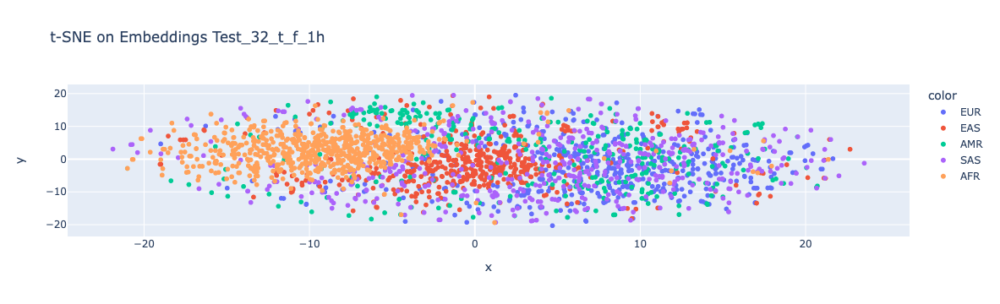

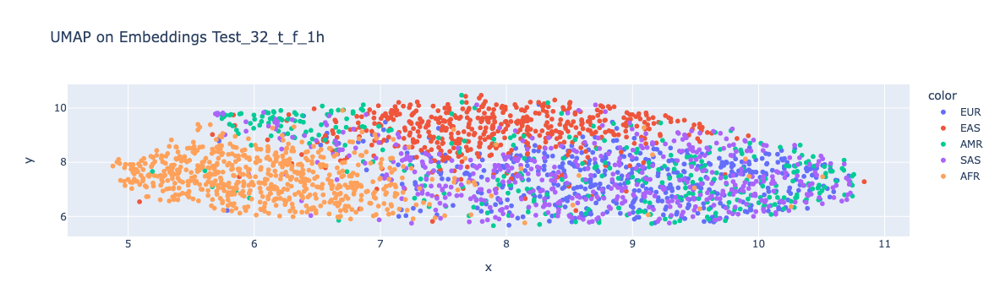

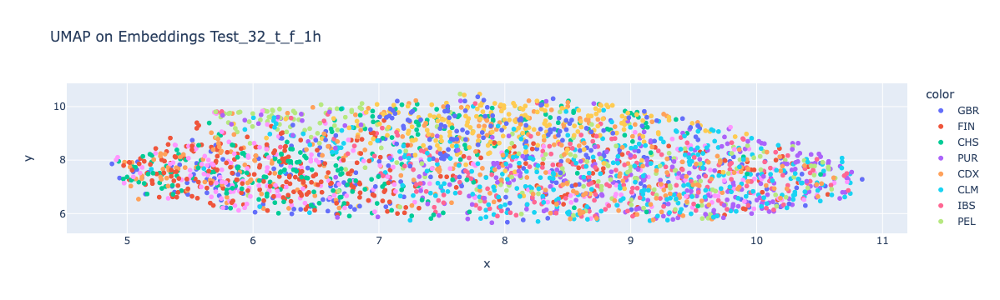

(2503, 200)


/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



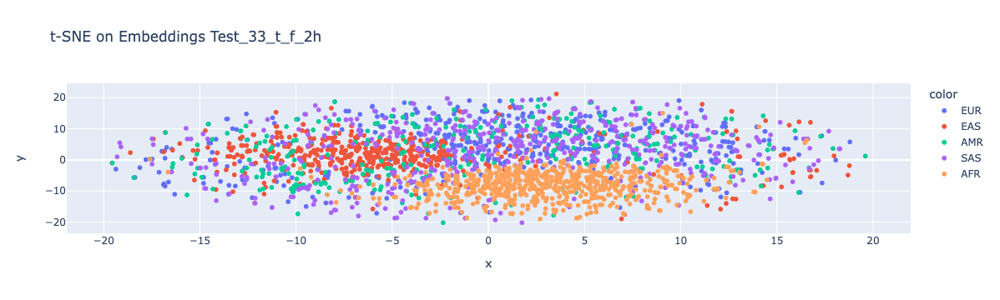

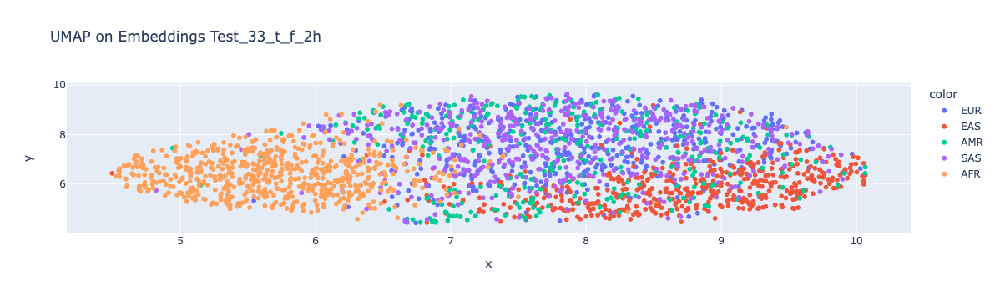

(2503, 200)


/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



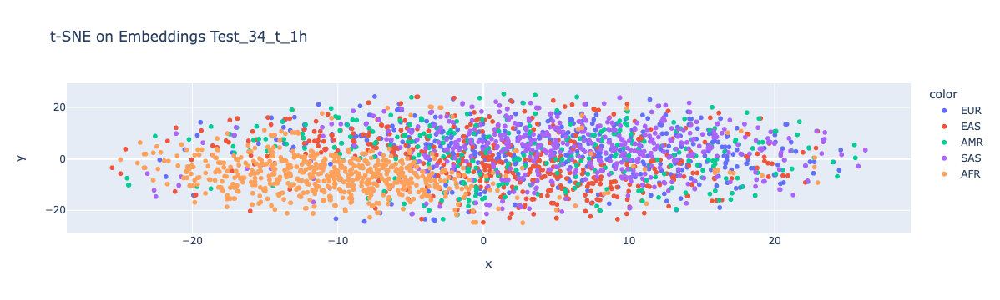

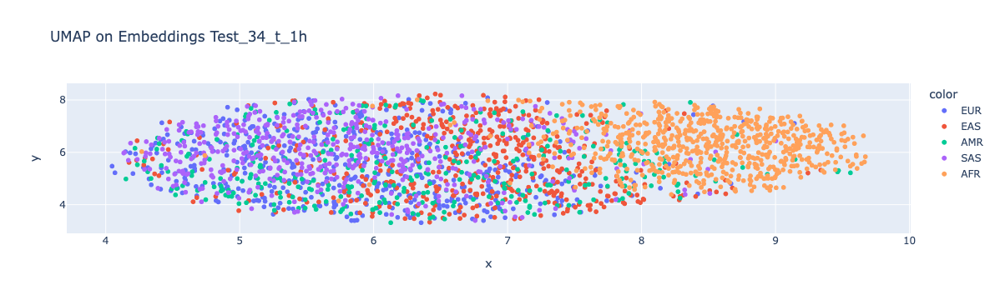

In [28]:
inds = list(range(2503))

for model in models:
    # Don't include padding_idx embedding weight
    embeddings = model.embed.weight.cpu().detach().numpy()[:-1, :]
    print(embeddings.shape)

    umap_params = {'min_dist': 0.0, 'n_neighbors': 2, 'target_weight': 1.0}
    # umap_embeddings = UMAP(**umap_params, n_components=2).fit_transform(embeddings)
    umap_embeddings = UMAP(n_components=2, metric="cosine").fit_transform(embeddings)
    # umap_3d_embeddings = UMAP(**umap_params, n_components=3).fit_transform(embeddings)
    tsne_2d_embeddings = TSNE(n_components= 2, 
                                perplexity=30, 
                                learning_rate=200, 
                                early_exaggeration=12, 
                                n_iter=1000, 
                                init='pca').fit_transform(embeddings)
    
    fig = px.scatter(x=tsne_2d_embeddings[:, 0], y=tsne_2d_embeddings[:, 1], 
                     color=label_superpops, 
                     hover_name=inds,
                     title=f"t-SNE on Embeddings {model.get_name()}")
    fig.show()
    
    fig = px.scatter(x=umap_embeddings[:, 0], y=umap_embeddings[:, 1], 
                     color=label_superpops, 
                     hover_name=inds,
                     title=f"UMAP on Embeddings {model.get_name()}")
    fig.show()

    if model.get_name() == "Test_32_t_f_1h":
        # Save prev fig
        fig.update_layout(title_text=None)
        fig.write_image("images/nn_embeddings.pdf")

        
        fig = px.scatter(x=umap_embeddings[:, 0], y=umap_embeddings[:, 1], 
                         color=label_codes, 
                         hover_name=inds,
                         title=f"UMAP on Embeddings {model.get_name()}")
        fig.show()
    

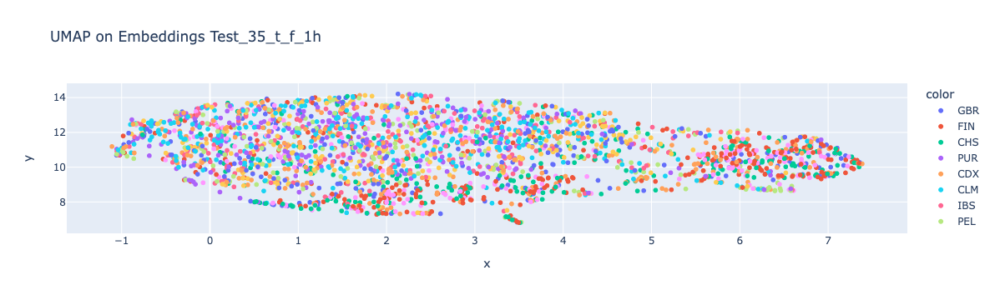

In [11]:
fig = px.scatter(x=umap_embeddings[:, 0], y=umap_embeddings[:, 1], 
                         color=label_codes, 
                         hover_name=inds,
                         title=f"UMAP on Embeddings {model.get_name()}")
fig.show()

In [19]:
## Save embeddings
for model in models:
    embeddings = model.embed.weight.cpu().detach().numpy()[:-1, :]
    np.save(os.path.join(outdir, f"{model.get_name()}_embeddings.npy"), embeddings)

## Attention Analysis

In [87]:
embed_size = 120

def get_attn_weights(model, x, mask, normalize=False):
    model.train(False)
    model.eval()

    # Pass given data through the model
    out = model(x, mask)
    # Get attention weights
    att_weights = [activation[f"el{i}_attn"][1].cpu().numpy() for i in range(1, 4)]

    # Normalize weights to [0, 1]
    if normalize:
        for i, a in enumerate(att_weights):
            min, max = np.min(a), np.max(a)
            att_weights[i] = ((a - min) / (max - min))

    return att_weights

def get_attn_for_inds(model, inds: list[int], labels, normalize=False):
    x, _, mask = make_data(inds)
    attn_weights = get_attn_weights(model, x, mask, normalize=normalize)
    tokens = np.array(labels)[inds]

    return attn_weights, tokens

def invert_attn(attn_weights, normalize=False):
    if normalize:
        for i, a in enumerate(attn_weights):
            mina, maxa = np.min(a), np.max(a)
            attn_weights[i] = ((a - mina) / (maxa - mina))
            
    for i, a in enumerate(attn_weights): 
        attn_weights[i] = 1 - a

    return attn_weights
    

def get_attn_for_inds_old(model, inds: list[int], labels, normalize=False):
    x, _, mask = make_data_old(inds)
    attn_weights = get_attn_weights(model, x, mask, normalize=normalize)
    tokens = np.array(labels)[inds]

    return attn_weights, tokens

def get_QKV_weights(model, embed_dim=embed_size):
    q_w, k_w, v_w = torch.split(model.encoder.layers[0].self_attn.in_proj_weight, [embed_dim, embed_dim, embed_dim])
    q_b, k_b, v_b = torch.split(model.encoder.layers[0].self_attn.in_proj_bias, [embed_dim, embed_dim, embed_dim])
    q_w = q_w.T
    k_w = k_w.T
    v_w = v_w.T

    return (q_w, q_b), (k_w, k_b), (v_w, v_b)

def viz_layer_attn(attn_weights, tokens, inds, layer=0):
    names = ["{} {}".format(x, '\u200B'*i) for i, x in enumerate(tokens)]
    attn_weights[layer] = attn_weights[layer].squeeze().mean(axis=0) if len(attn_weights[layer].squeeze().shape) > 2 else attn_weights[layer].squeeze()
    fig = px.imshow(attn_weights[layer], x=names, y=names, 
                    title=f"Layer {layer} attention (averaged over heads)", 
                    template="plotly",
                    range_color=[0, 1]
                   )
    fig.show()

def viz_avg_attn(attn_weights, tokens, inds):
    avg = np.stack(attn_weights).squeeze().mean(axis=((0, 1) if attn_weights[0].shape[1] > 1 else 0))
    names = [f"{x} ({inds[i]})" for i, x in enumerate(tokens)]
    fig = px.imshow(avg, x=names, y=names, title="Average attention over all layers")
    fig.show()

In [12]:
afr_inds = [940, 880, 980]
sasian_inds = [537, 961, 959, 536, 1001]
amer_clust_inds = [360, 300, 420, 340, 400]
euro_clust_inds = [140, 120, 20, 60]
easian_clust_inds = [800, 760, 900, 660, 220, 540]


# Do all possible combinations of 2 nationalities
all_clusts = [afr_inds, sasian_inds, amer_clust_inds, euro_clust_inds, easian_clust_inds]
for c1, c2 in itertools.combinations(all_clusts, 2):
    inds = c1 + c2
    for model in models:
        attn_weights, tokens = get_attn_for_inds(model, inds, label_superpops)
        print(model.get_name(), tokens)
        # head_view([torch.tensor(a) for a in attn_weights], tokens)
        # viz_layer_attn(attn_weights, tokens, inds)
        # viz_layer_attn(attn_weights, tokens, inds, 1)
        # viz_layer_attn(attn_weights, tokens, inds, 2)
        # viz_avg_attn(attn_weights, tokens, inds)
        # model_view([torch.tensor(a) for a in attn_weights], tokens)

Test_32_t_f_1h ['AFR' 'AFR' 'AFR' 'SAS' 'SAS' 'SAS' 'SAS' 'SAS']
Test_33_t_f_2h ['AFR' 'AFR' 'AFR' 'SAS' 'SAS' 'SAS' 'SAS' 'SAS']
Test_34_t_1h ['AFR' 'AFR' 'AFR' 'SAS' 'SAS' 'SAS' 'SAS' 'SAS']
Test_32_t_f_1h ['AFR' 'AFR' 'AFR' 'AMR' 'AMR' 'AMR' 'AMR' 'AMR']
Test_33_t_f_2h ['AFR' 'AFR' 'AFR' 'AMR' 'AMR' 'AMR' 'AMR' 'AMR']
Test_34_t_1h ['AFR' 'AFR' 'AFR' 'AMR' 'AMR' 'AMR' 'AMR' 'AMR']
Test_32_t_f_1h ['AFR' 'AFR' 'AFR' 'EUR' 'EUR' 'EUR' 'EUR']
Test_33_t_f_2h ['AFR' 'AFR' 'AFR' 'EUR' 'EUR' 'EUR' 'EUR']
Test_34_t_1h ['AFR' 'AFR' 'AFR' 'EUR' 'EUR' 'EUR' 'EUR']
Test_32_t_f_1h ['AFR' 'AFR' 'AFR' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS']
Test_33_t_f_2h ['AFR' 'AFR' 'AFR' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS']
Test_34_t_1h ['AFR' 'AFR' 'AFR' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS']
Test_32_t_f_1h ['SAS' 'SAS' 'SAS' 'SAS' 'SAS' 'AMR' 'AMR' 'AMR' 'AMR' 'AMR']
Test_33_t_f_2h ['SAS' 'SAS' 'SAS' 'SAS' 'SAS' 'AMR' 'AMR' 'AMR' 'AMR' 'AMR']
Test_34_t_1h ['SAS' 'SAS' 'SAS' 'SAS' 'SAS' 'AMR' 'AMR' 'AMR' 'AMR' 'AMR']

### Viz of Random Indices

In [13]:
def viz_inds(inds, model, labels):
    attn_weights, tokens = get_attn_for_inds(model, inds, labels)
    print(model.get_name(), ", ".join(tokens))
    head_view([torch.tensor(a) for a in attn_weights], tokens)
    # viz_avg_attn(attn_weights, tokens, inds)
    viz_layer_attn(attn_weights, tokens, inds, 0)
    viz_layer_attn(attn_weights, tokens, inds, 1)
    viz_layer_attn(attn_weights, tokens, inds, 2)

In [14]:
labels_both = label_superpops + " (" + label_codes + ")"

In [15]:
# Good indice groups from randomly generating them
sel_inds = [[ 412, 1488,  202,  694, 1122, 1312, 2161, 1774,  247,    1],
# Found from lowest intra-percentage
            [2125, 2013, 1345,  453,  837,  974, 1966, 2088,  565,  137, 1130, 2405, 2053, 1068, 1500],
            [276, 1638,  928, 1979, 2402,  313,  967,  518, 2074,  890,  304, 1301, 2282,   37, 2009],
            [2376,824,699,489,1336,1736,2464,1228,1174,564,2094,2318,647,1276,2061],
           ]


[412, 1488, 202, 694, 1122, 1312, 2161, 1774, 247, 1]
Test_32_t_f_1h AMR, SAS, EAS, AMR, AFR, AFR, AFR, EAS, EAS, EUR


<IPython.core.display.Javascript object>

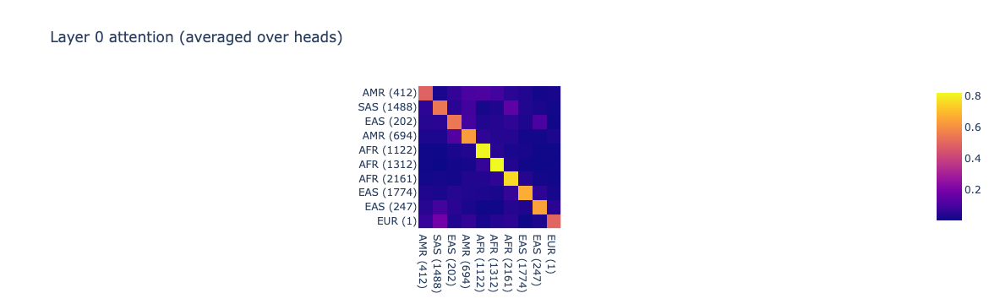

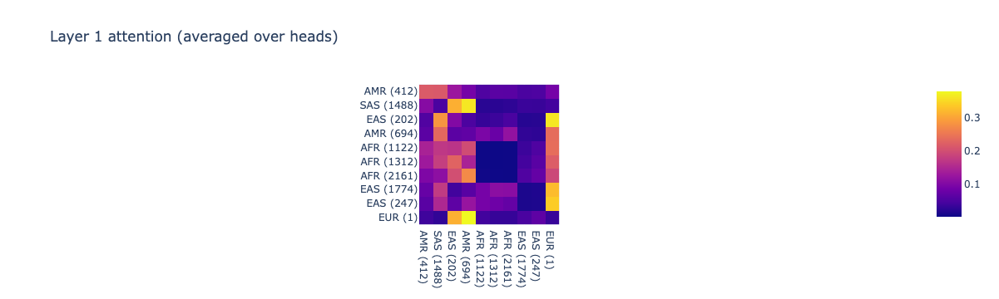

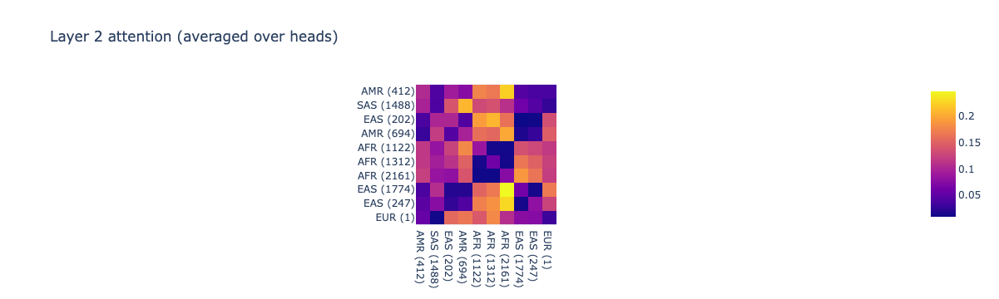

[2125, 2013, 1345, 453, 837, 974, 1966, 2088, 565, 137, 1130, 2405, 2053, 1068, 1500]
Test_32_t_f_1h AFR, EAS, AFR, AMR, EUR, AFR, EAS, AFR, EUR, EUR, AFR, SAS, AFR, AFR, SAS


<IPython.core.display.Javascript object>

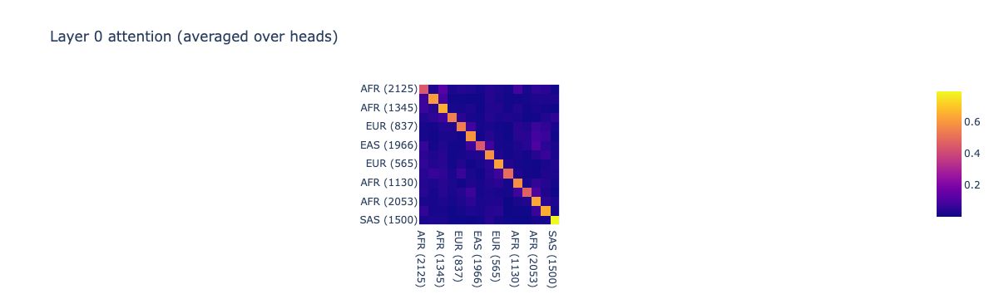

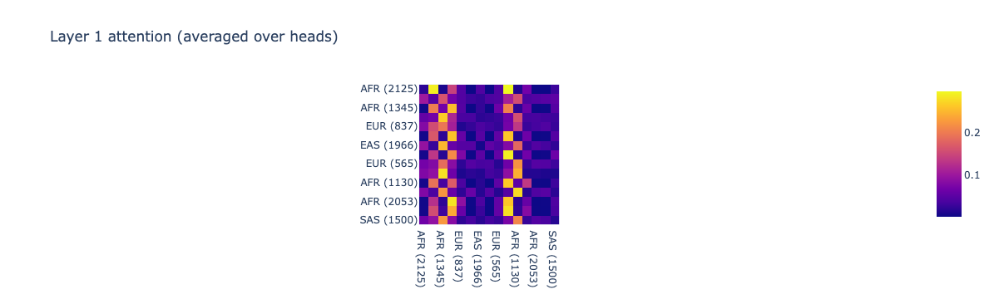

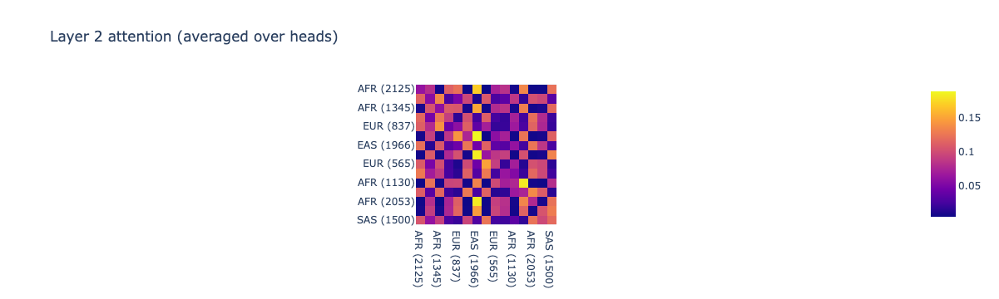

[276, 1638, 928, 1979, 2402, 313, 967, 518, 2074, 890, 304, 1301, 2282, 37, 2009]
Test_32_t_f_1h EAS, SAS, EAS, AFR, SAS, EAS, AFR, EUR, AFR, AFR, AMR, AFR, AFR, EUR, EAS


<IPython.core.display.Javascript object>

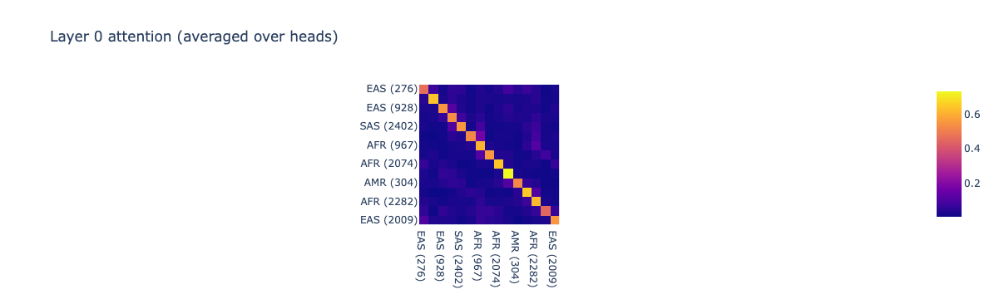

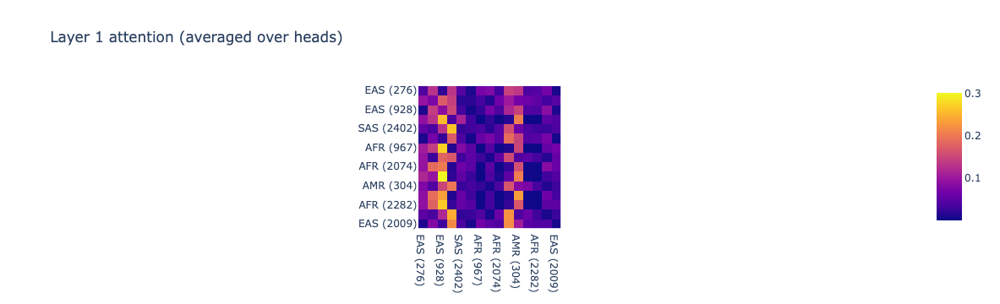

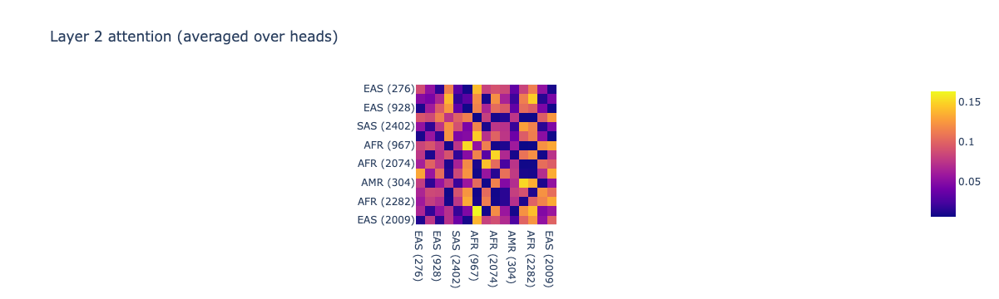

[2376, 824, 699, 489, 1336, 1736, 2464, 1228, 1174, 564, 2094, 2318, 647, 1276, 2061]
Test_32_t_f_1h EUR, EAS, AMR, AMR, AFR, EUR, SAS, AFR, AFR, EUR, AFR, EUR, EAS, AFR, AFR


<IPython.core.display.Javascript object>

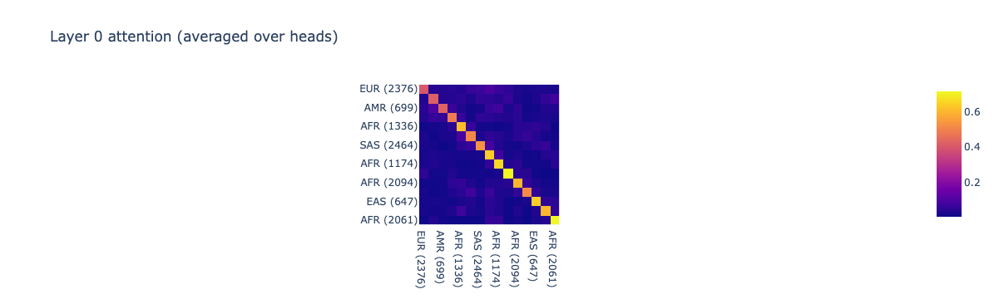

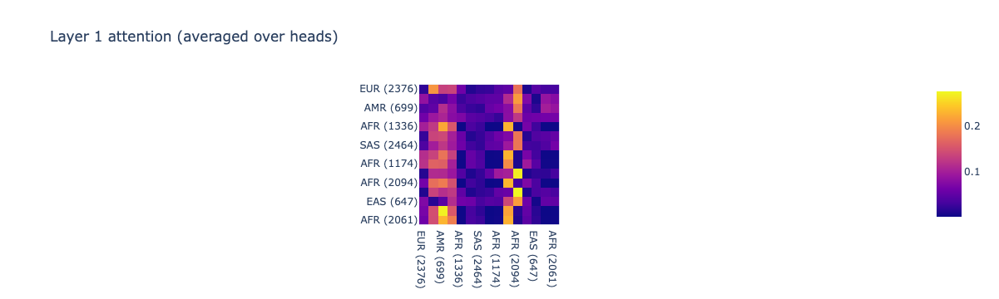

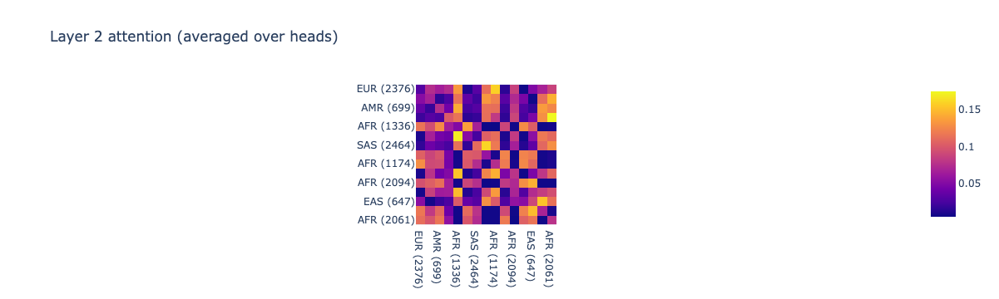

In [75]:
for inds in sel_inds:
    print(inds)
    viz_inds(inds, models[0], label_superpops)

[1573 2006  901 1076 1460 2161  804  934  975 1048]
Test_32_t_f_1h SAS, EAS, EAS, SAS, SAS, AFR, EAS, AFR, AFR, SAS


<IPython.core.display.Javascript object>

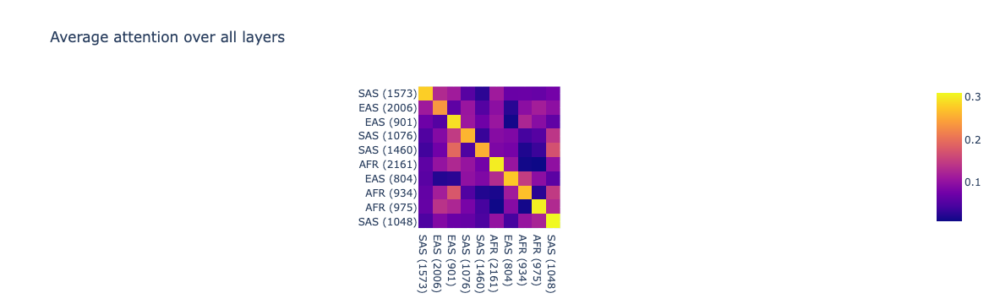

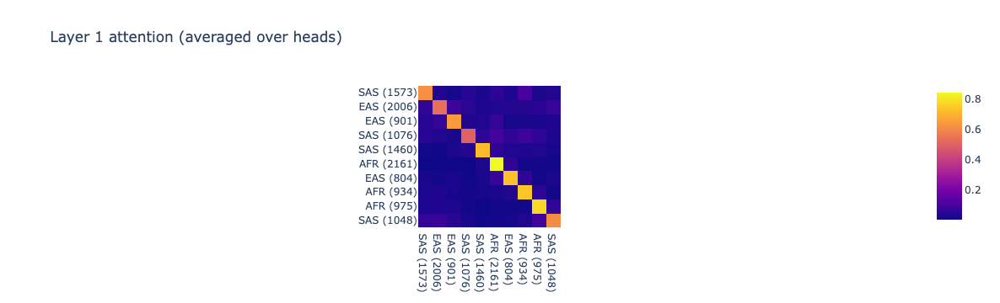

[ 412 1488  202  694 1122 1312 2161 1774  247    1]
Test_32_t_f_1h AMR, SAS, EAS, AMR, AFR, AFR, AFR, EAS, EAS, EUR


<IPython.core.display.Javascript object>

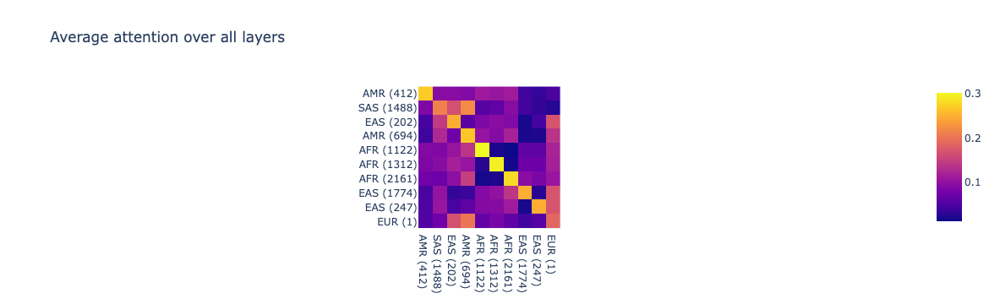

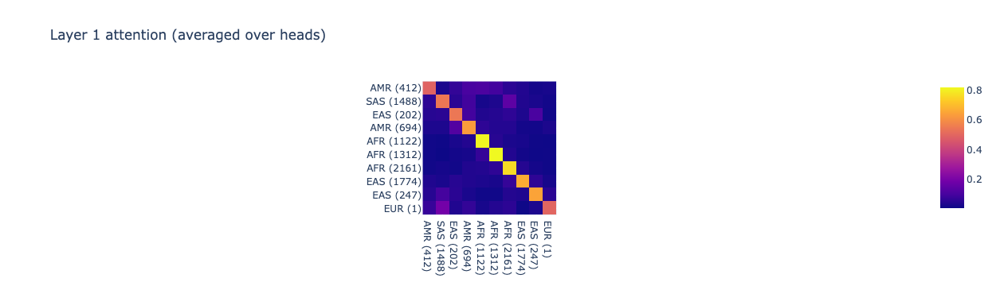

[ 259 2203  335  431  844 1621 1684  567 1346 1359]
Test_32_t_f_1h EAS, AMR, AMR, AMR, EUR, SAS, EUR, EUR, SAS, SAS


<IPython.core.display.Javascript object>

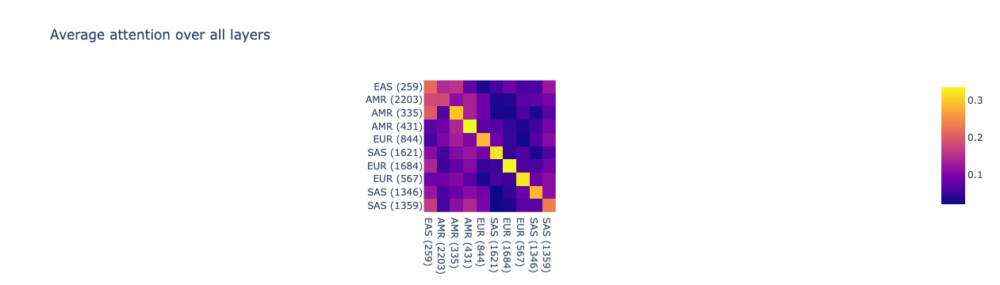

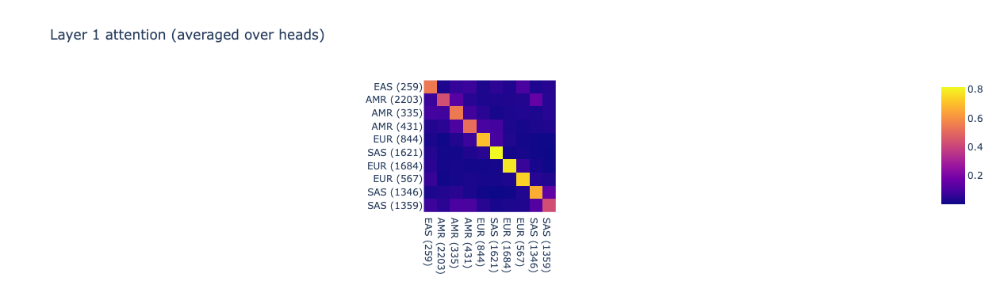

In [38]:
# Random inds length
rlen = 10
model = models[0]

for i in range(3):
    inds = np.random.randint(2503, size=rlen)
    print(inds)
    viz_inds(inds, model, label_superpops)

[2153  841  390 1635 1408 1054 1333  109 1894  539]
Test_32_t_f_1h AFR (LWK), EUR (IBS), AMR (PUR), SAS (BEB), SAS (ITU), AFR (GWD), AFR (MSL), EUR (FIN), AFR (YRI), EAS (KHV)


<IPython.core.display.Javascript object>

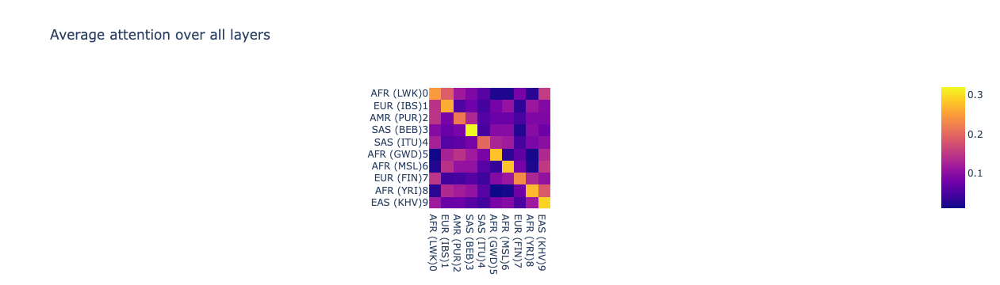

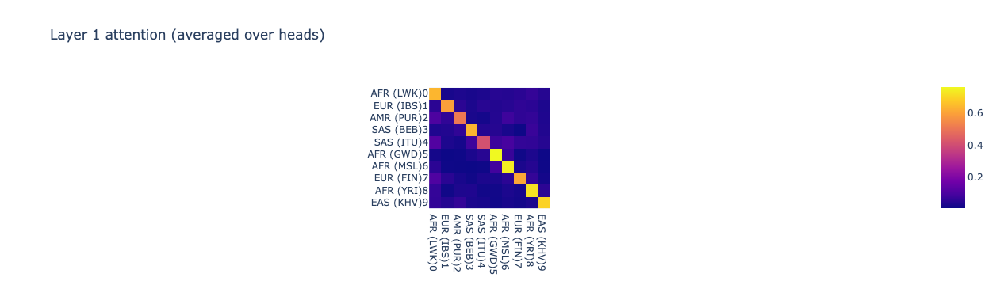

Test_33_t_f_2h AFR (LWK), EUR (IBS), AMR (PUR), SAS (BEB), SAS (ITU), AFR (GWD), AFR (MSL), EUR (FIN), AFR (YRI), EAS (KHV)


<IPython.core.display.Javascript object>

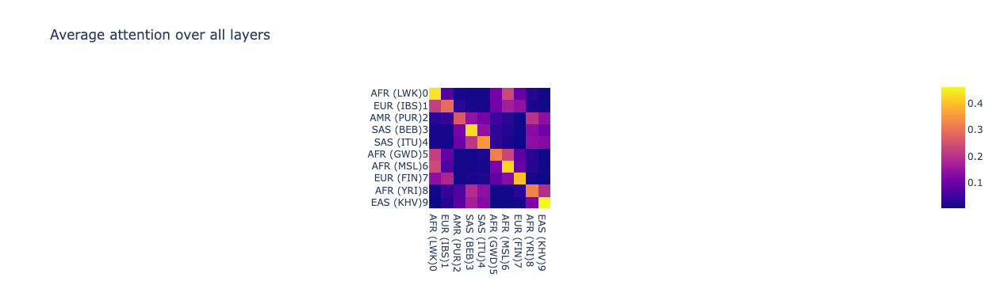

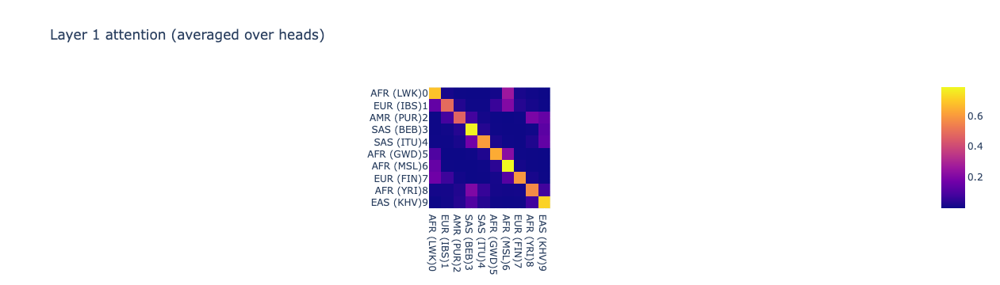

Test_34_t_1h AFR (LWK), EUR (IBS), AMR (PUR), SAS (BEB), SAS (ITU), AFR (GWD), AFR (MSL), EUR (FIN), AFR (YRI), EAS (KHV)


<IPython.core.display.Javascript object>

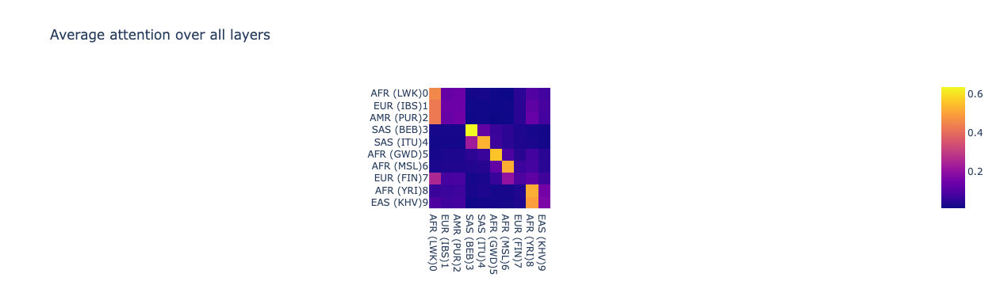

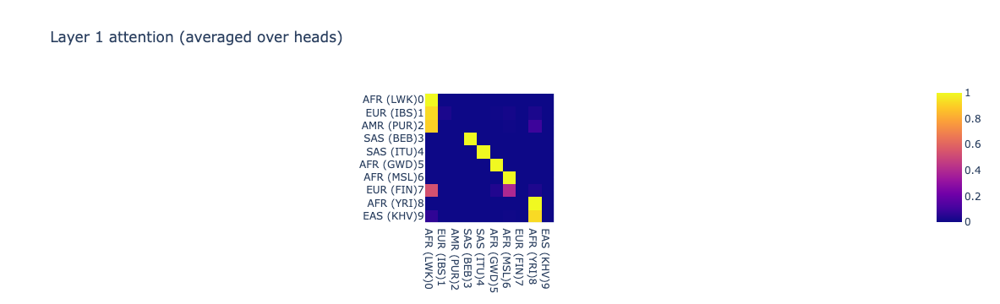

[2300 2269  984 2469 2088  989  304 1859 1398   26]
Test_32_t_f_1h EUR (TSI), AFR (ASW), AFR (GWD), SAS (GIH), AFR (LWK), AFR (GWD), AMR (PUR), EAS (CHB), SAS (PJL), EUR (GBR)


<IPython.core.display.Javascript object>

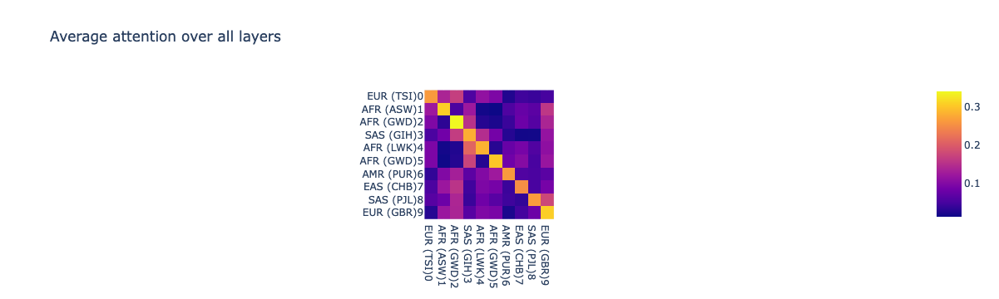

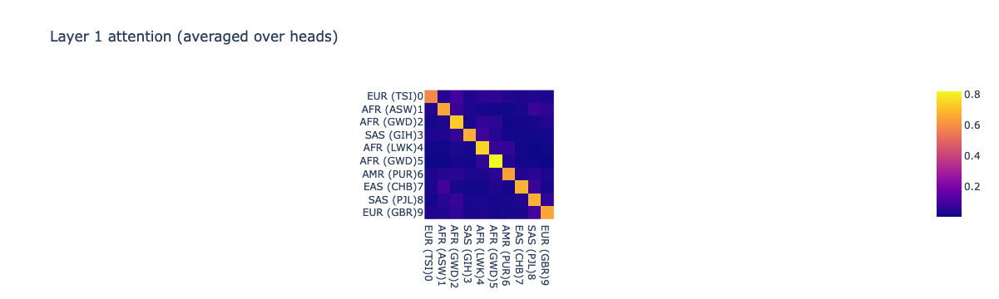

Test_33_t_f_2h EUR (TSI), AFR (ASW), AFR (GWD), SAS (GIH), AFR (LWK), AFR (GWD), AMR (PUR), EAS (CHB), SAS (PJL), EUR (GBR)


<IPython.core.display.Javascript object>

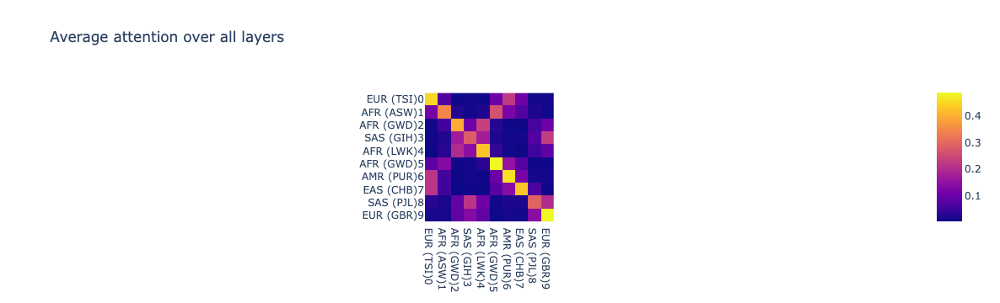

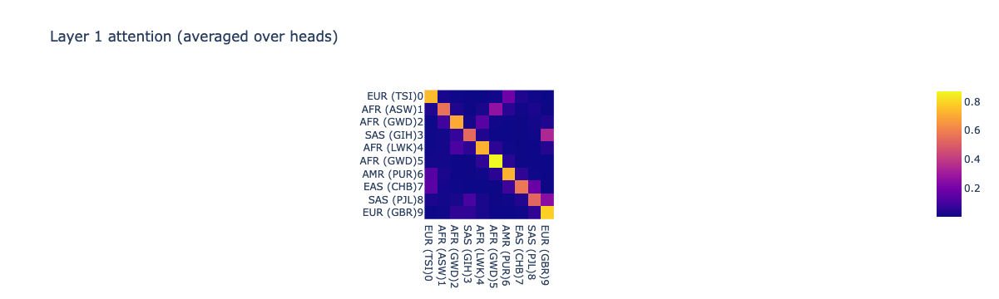

Test_34_t_1h EUR (TSI), AFR (ASW), AFR (GWD), SAS (GIH), AFR (LWK), AFR (GWD), AMR (PUR), EAS (CHB), SAS (PJL), EUR (GBR)


<IPython.core.display.Javascript object>

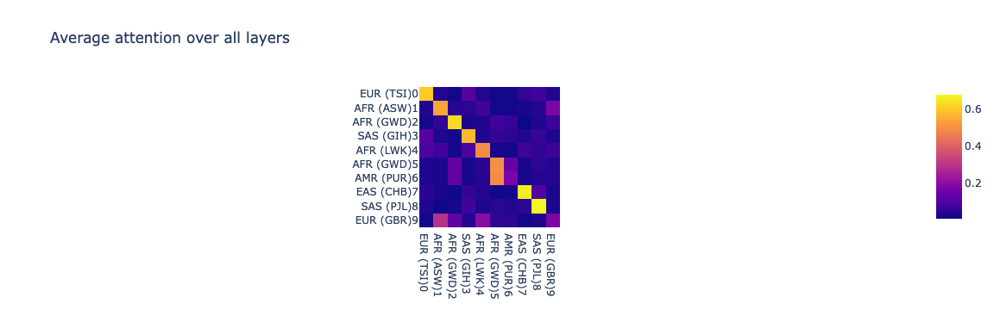

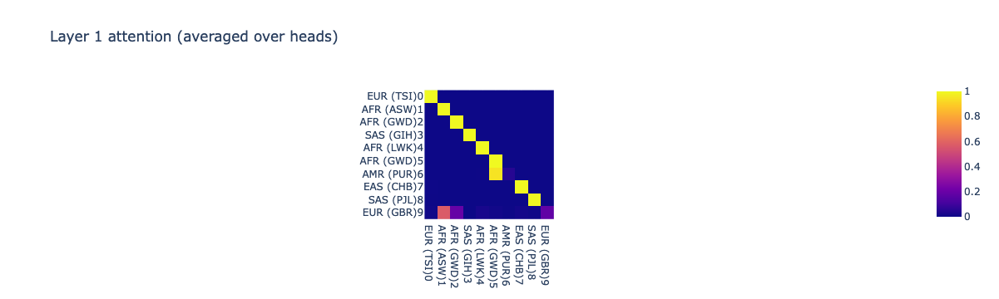

[1334 1329 1770   91 2242  169 1138  495 1835 1501]
Test_32_t_f_1h AFR (MSL), AFR (GWD), AFR (YRI), EUR (GBR), AFR (ASW), EUR (FIN), AFR (ESN), AMR (CLM), EAS (CHB), SAS (ITU)


<IPython.core.display.Javascript object>

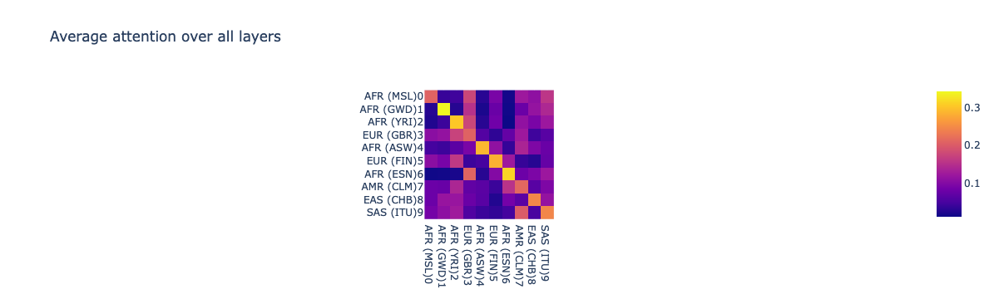

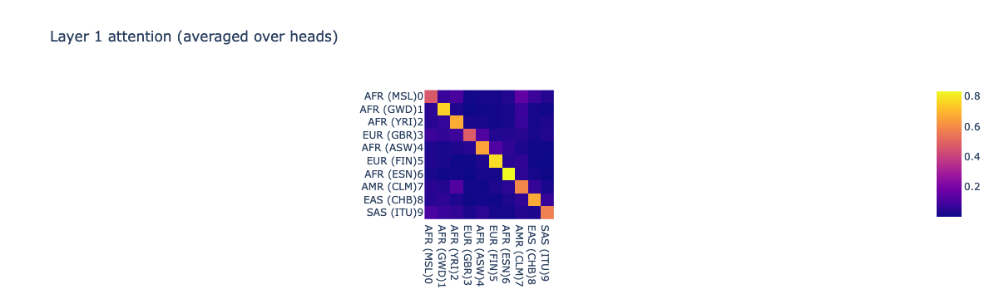

Test_33_t_f_2h AFR (MSL), AFR (GWD), AFR (YRI), EUR (GBR), AFR (ASW), EUR (FIN), AFR (ESN), AMR (CLM), EAS (CHB), SAS (ITU)


<IPython.core.display.Javascript object>

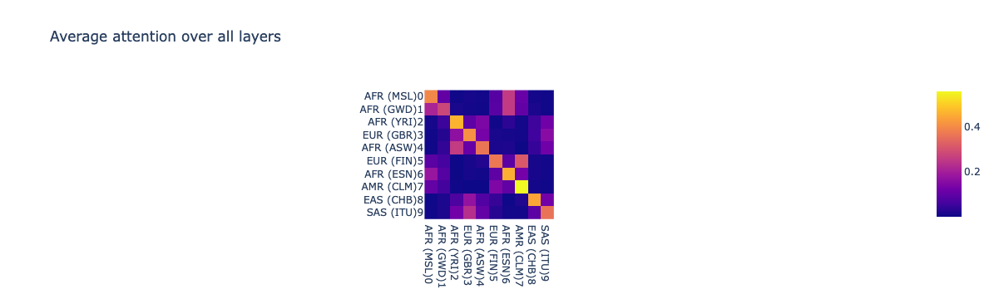

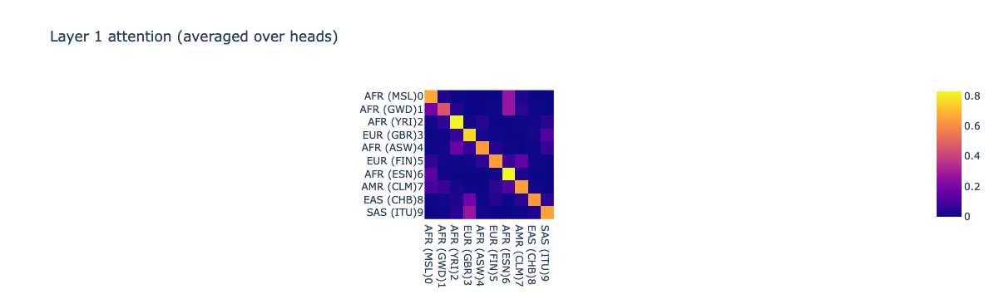

Test_34_t_1h AFR (MSL), AFR (GWD), AFR (YRI), EUR (GBR), AFR (ASW), EUR (FIN), AFR (ESN), AMR (CLM), EAS (CHB), SAS (ITU)


<IPython.core.display.Javascript object>

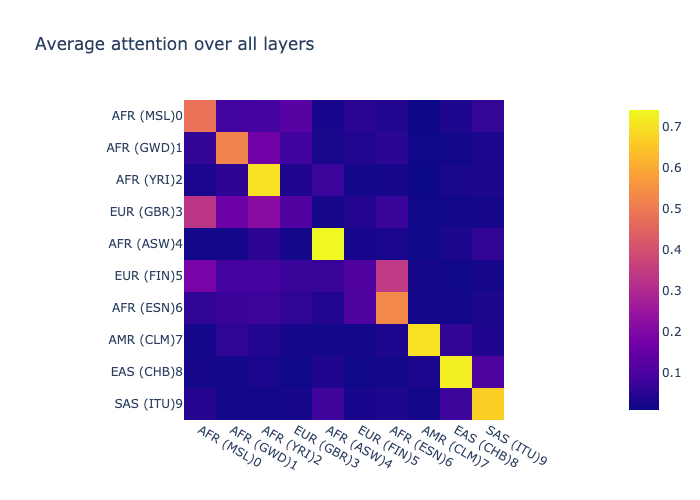

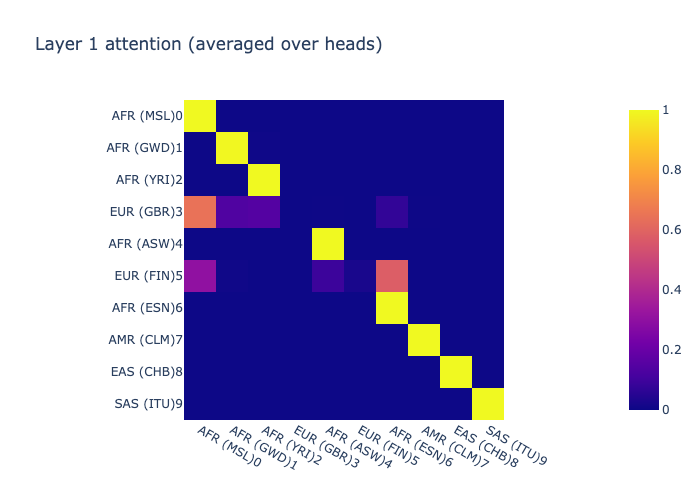

In [15]:
# Random inds length
rlen = 10

for i in range(3):
    inds = np.random.randint(2503, size=rlen)
    print(inds)
    for model in models:
    
        viz_inds(inds, model, labels_both)

[ 843 1508 2252  379 1183 1271  342 1817  154  724]
Test_32_t_f_1h EUR (IBS), SAS (STU), AFR (ASW), AMR (CLM), AFR (MSL), AFR (ESN), AMR (PUR), EAS (CHB), EUR (FIN), AMR (PEL)


<IPython.core.display.Javascript object>

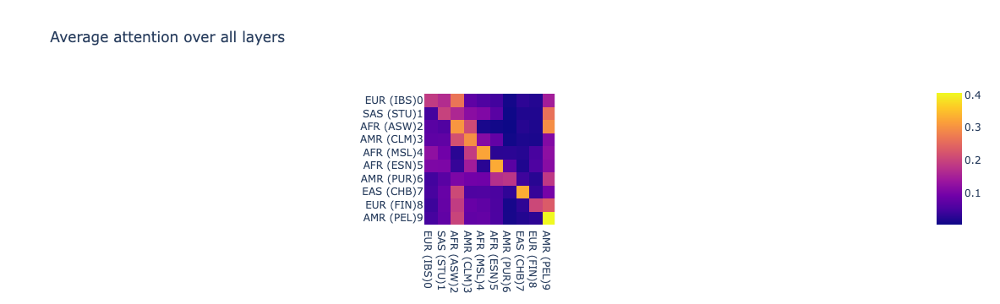

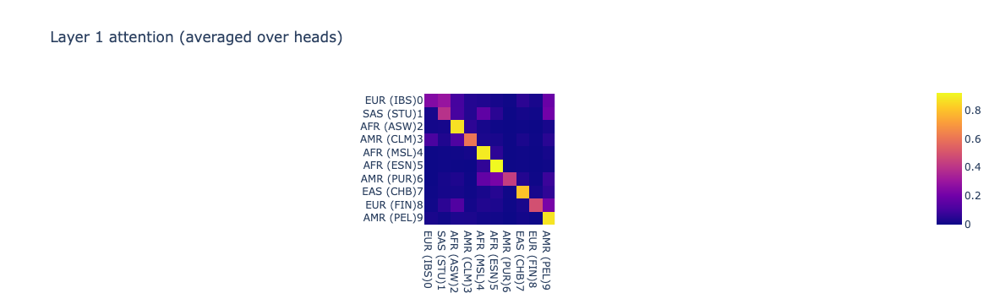

Test_33_t_f_2h EUR (IBS), SAS (STU), AFR (ASW), AMR (CLM), AFR (MSL), AFR (ESN), AMR (PUR), EAS (CHB), EUR (FIN), AMR (PEL)


<IPython.core.display.Javascript object>

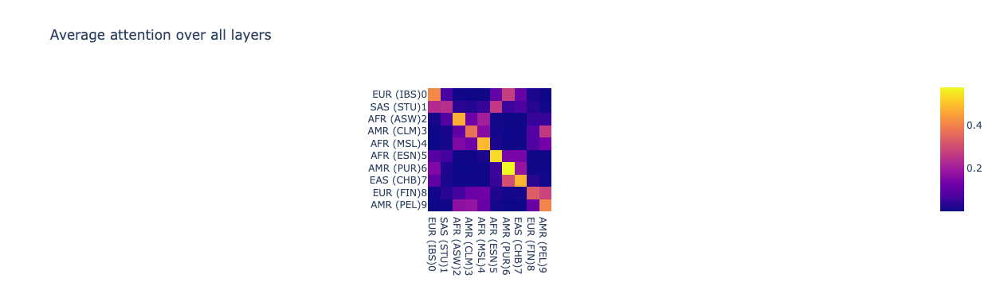

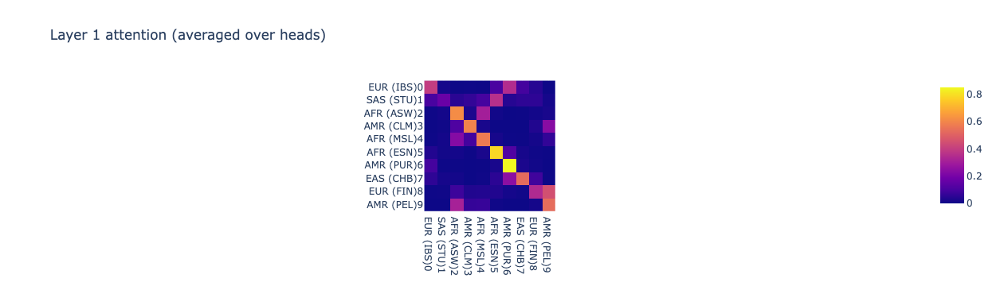

Test_34_t_1h EUR (IBS), SAS (STU), AFR (ASW), AMR (CLM), AFR (MSL), AFR (ESN), AMR (PUR), EAS (CHB), EUR (FIN), AMR (PEL)


<IPython.core.display.Javascript object>

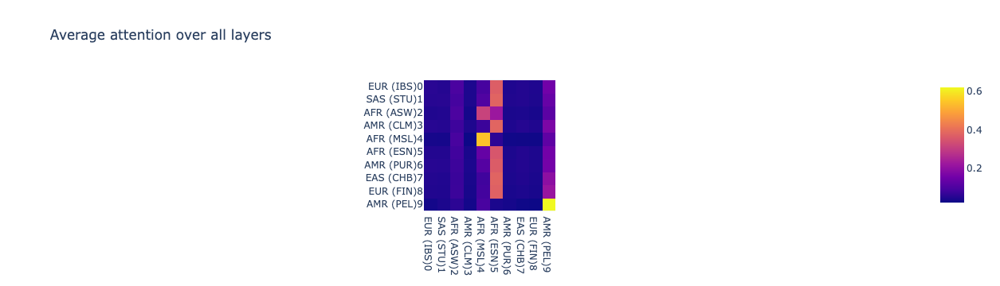

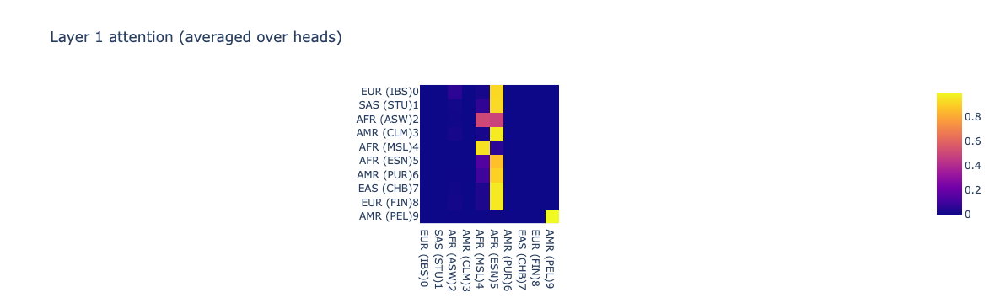

[2122   56 1690  165 2363  622 1019 1034 2221 1276]
Test_32_t_f_1h AFR (LWK), EUR (FIN), EUR (CEU), EUR (FIN), EUR (TSI), EAS (CDX), AFR (GWD), AFR (GWD), AMR (MXL), AFR (ESN)


<IPython.core.display.Javascript object>

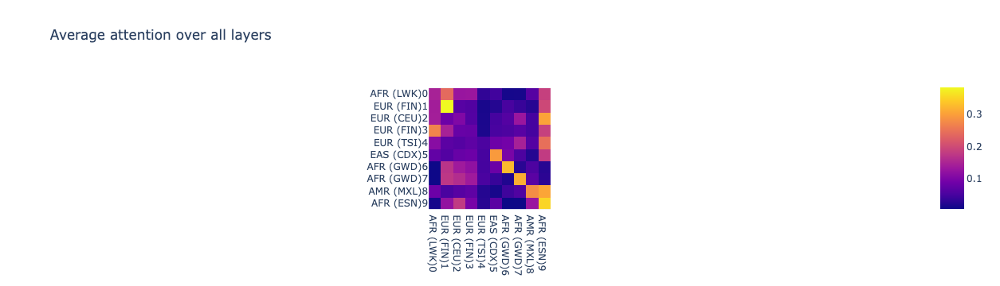

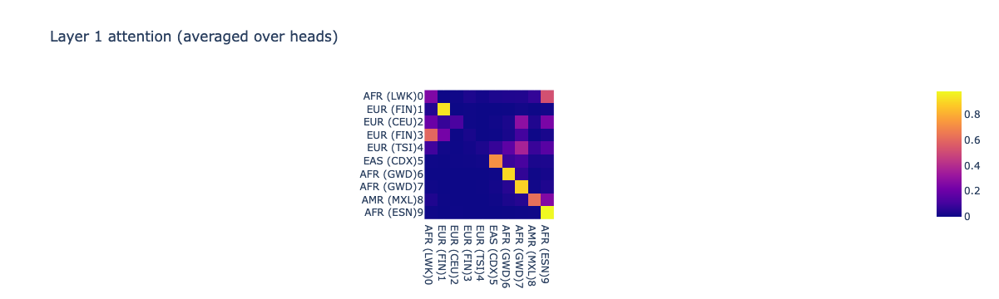

Test_33_t_f_2h AFR (LWK), EUR (FIN), EUR (CEU), EUR (FIN), EUR (TSI), EAS (CDX), AFR (GWD), AFR (GWD), AMR (MXL), AFR (ESN)


<IPython.core.display.Javascript object>

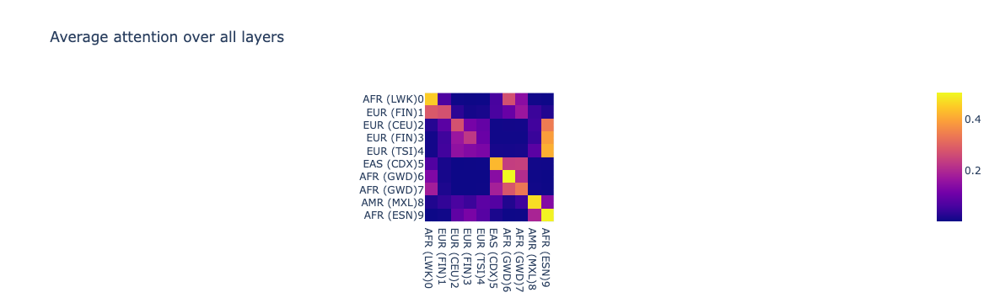

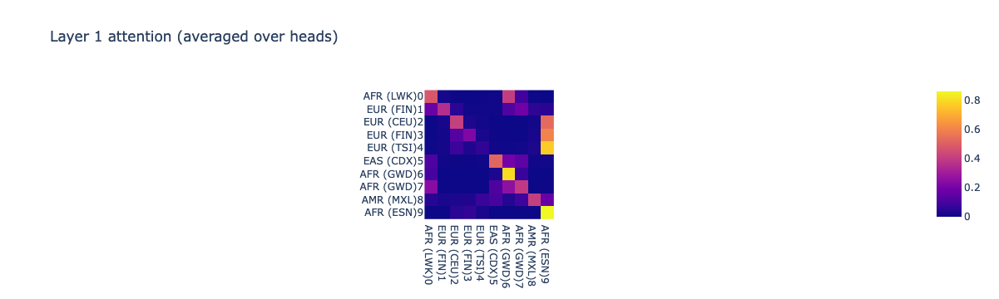

Test_34_t_1h AFR (LWK), EUR (FIN), EUR (CEU), EUR (FIN), EUR (TSI), EAS (CDX), AFR (GWD), AFR (GWD), AMR (MXL), AFR (ESN)


<IPython.core.display.Javascript object>

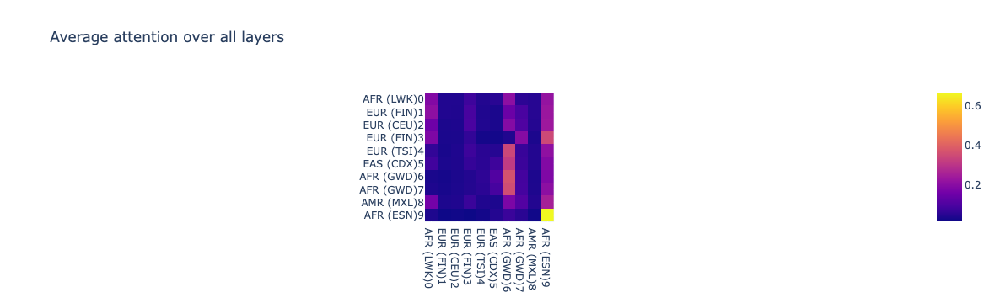

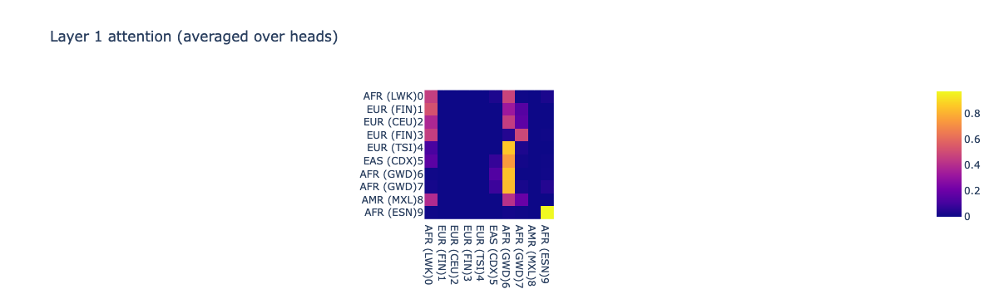

[2470  797 2081  411  453 1261 2449 1436 1083  436]
Test_32_t_f_1h SAS (GIH), EAS (KHV), AFR (YRI), AMR (CLM), AMR (CLM), AFR (ESN), SAS (GIH), SAS (PJL), SAS (PJL), AMR (CLM)


<IPython.core.display.Javascript object>

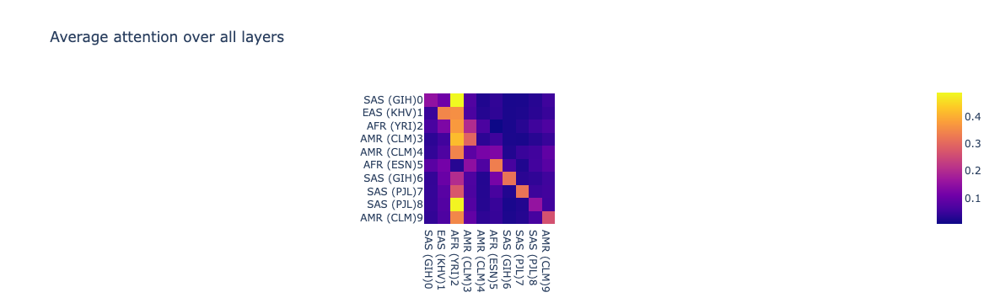

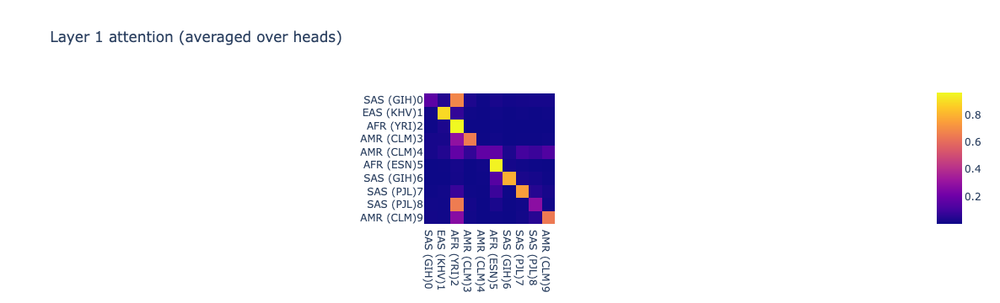

Test_33_t_f_2h SAS (GIH), EAS (KHV), AFR (YRI), AMR (CLM), AMR (CLM), AFR (ESN), SAS (GIH), SAS (PJL), SAS (PJL), AMR (CLM)


<IPython.core.display.Javascript object>

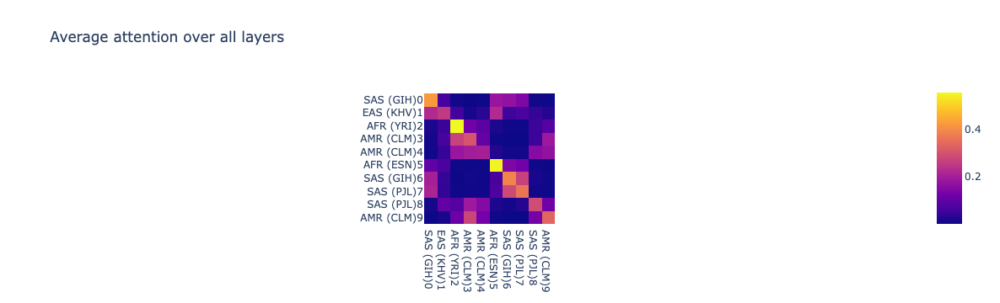

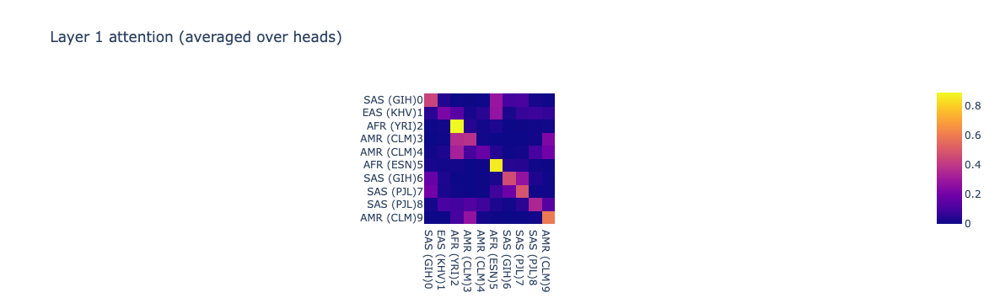

Test_34_t_1h SAS (GIH), EAS (KHV), AFR (YRI), AMR (CLM), AMR (CLM), AFR (ESN), SAS (GIH), SAS (PJL), SAS (PJL), AMR (CLM)


<IPython.core.display.Javascript object>

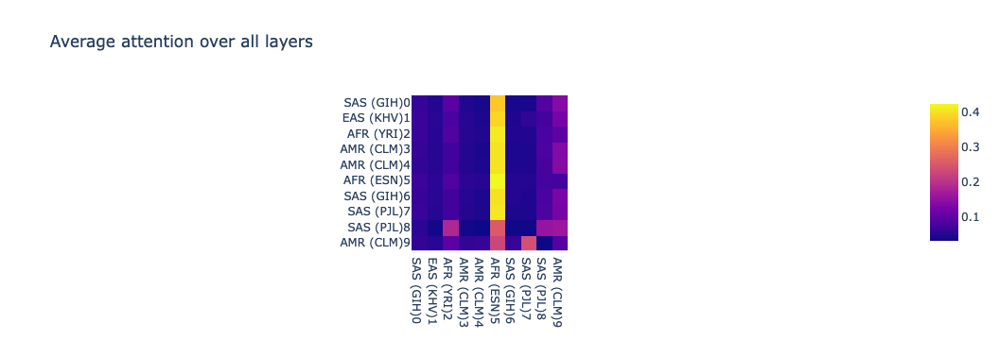

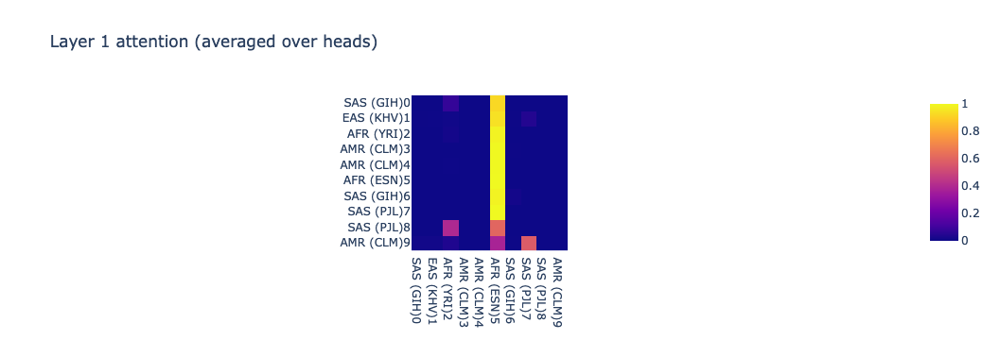

In [49]:
# Random inds length
rlen = 10

for i in range(3):
    inds = np.random.randint(2503, size=rlen)
    print(inds)
    for model in models:
        viz_inds(inds, model, labels_both)

#### Save attention output for selected subsets of inds

In [66]:
clusts_nosas = (afr_inds, amer_clust_inds, euro_clust_inds, easian_clust_inds)
combinations = itertools.chain(itertools.combinations(clusts_nosas, 2), 
                                 itertools.combinations(clusts_nosas, 3),
                                (clusts_nosas,))
attns = []
for c in combinations:
    inds = list(itertools.chain(*c))
    print(inds)
    attn_weights, tokens = get_attn_for_inds(models[0], inds, input_superpop)
    attn_weights = tuple(attn_weights)
    print(attn_weights[0].shape)
    attns.append((inds, attn_weights))

attns = np.array(attns, dtype=object)
np.save(os.path.join(outdir, f"{model_names[0]}_attns.npy"), attns)

[940, 880, 980, 360, 300, 420, 340, 400]
(1, 1, 8, 8)
[940, 880, 980, 140, 120, 20, 60]
(1, 1, 7, 7)
[940, 880, 980, 800, 760, 900, 660, 220, 540]
(1, 1, 9, 9)
[360, 300, 420, 340, 400, 140, 120, 20, 60]
(1, 1, 9, 9)
[360, 300, 420, 340, 400, 800, 760, 900, 660, 220, 540]
(1, 1, 11, 11)
[140, 120, 20, 60, 800, 760, 900, 660, 220, 540]
(1, 1, 10, 10)
[940, 880, 980, 360, 300, 420, 340, 400, 140, 120, 20, 60]
(1, 1, 12, 12)
[940, 880, 980, 360, 300, 420, 340, 400, 800, 760, 900, 660, 220, 540]
(1, 1, 14, 14)
[940, 880, 980, 140, 120, 20, 60, 800, 760, 900, 660, 220, 540]
(1, 1, 13, 13)
[360, 300, 420, 340, 400, 140, 120, 20, 60, 800, 760, 900, 660, 220, 540]
(1, 1, 15, 15)
[940, 880, 980, 360, 300, 420, 340, 400, 140, 120, 20, 60, 800, 760, 900, 660, 220, 540]
(1, 1, 18, 18)


In [45]:
(q_w, q_b), (k_w, k_b), (v_w, v_b) = get_QKV_weights(models[0])
[print(x.shape) for x in [q_w, q_b, k_w, k_b, v_w, v_b]]

torch.Size([120, 120])
torch.Size([120])
torch.Size([120, 120])
torch.Size([120])
torch.Size([120, 120])
torch.Size([120])


[None, None, None, None, None, None]

Test_28_t_f_1h ['AFR' 'AFR' 'AFR' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS' 'EUR' 'EUR' 'EUR'
 'EUR']


<IPython.core.display.Javascript object>

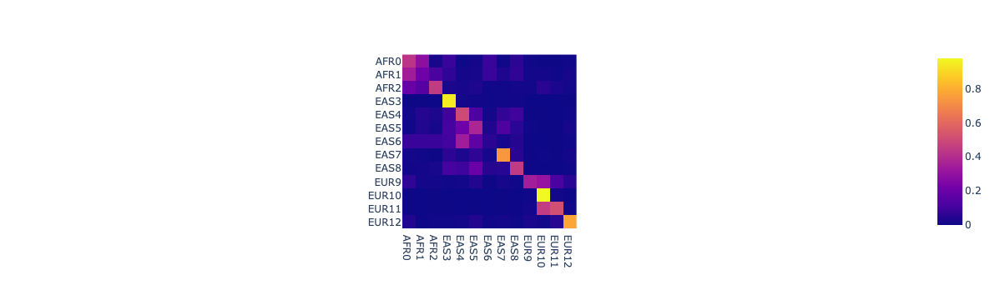

In [29]:
inds = afr_inds + easian_clust_inds + euro_clust_inds
for model in models[:1]:
    attn_weights, tokens = get_attn_for_inds(model, inds, input_superpop)
    print(model.get_name(), tokens)
    head_view([torch.tensor(a) for a in attn_weights], tokens)
    viz_avg_attn(attn_weights, tokens)

### Used in paper

Test_32_t_f_1h AFR, AFR, AFR, SAS, SAS, SAS, SAS, SAS


<IPython.core.display.Javascript object>

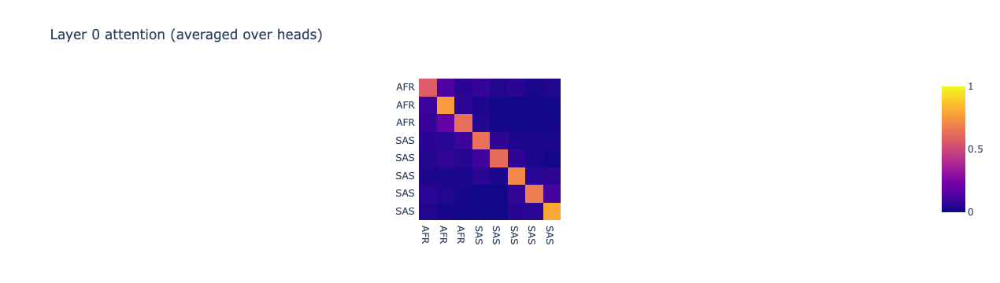

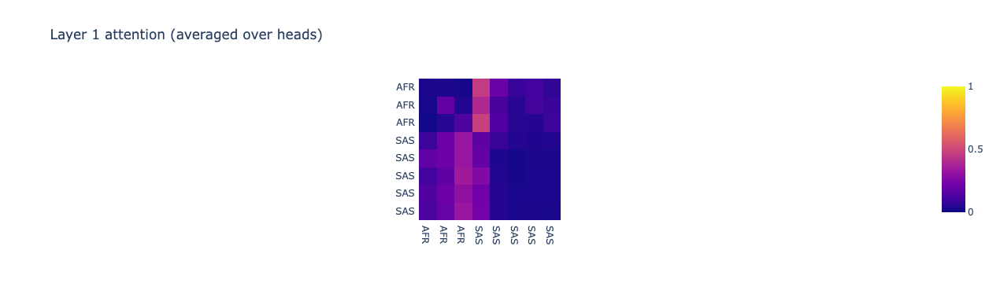

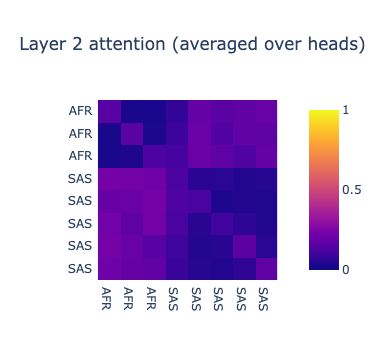

INVERTED:


<IPython.core.display.Javascript object>

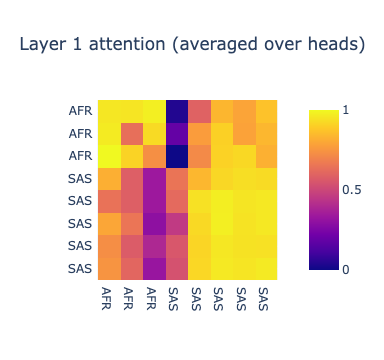

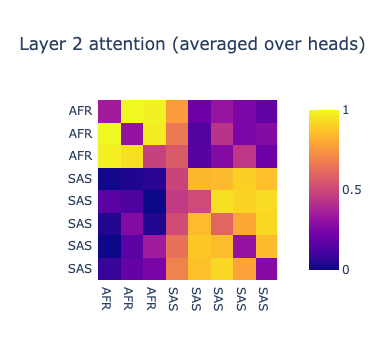

Test_32_t_f_1h AMR, AMR, AMR, AMR, AMR, EAS, EAS, EAS, EAS, EAS, EAS


<IPython.core.display.Javascript object>

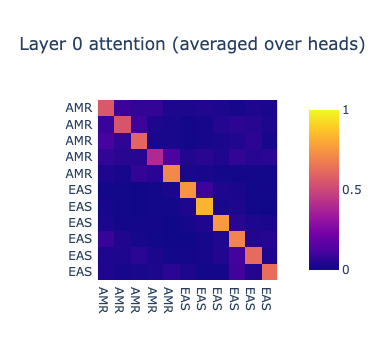

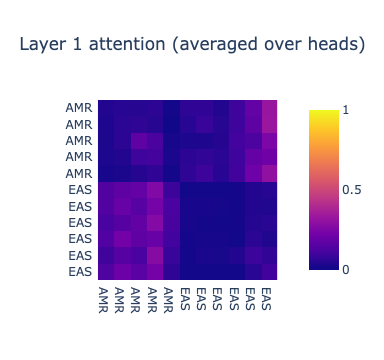

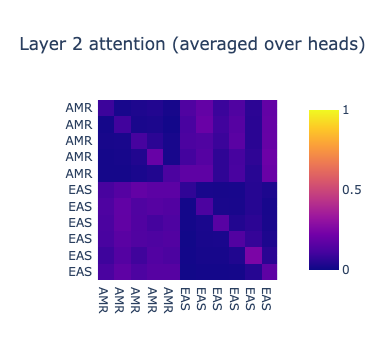

INVERTED:


<IPython.core.display.Javascript object>

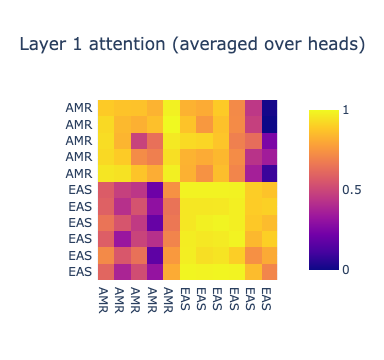

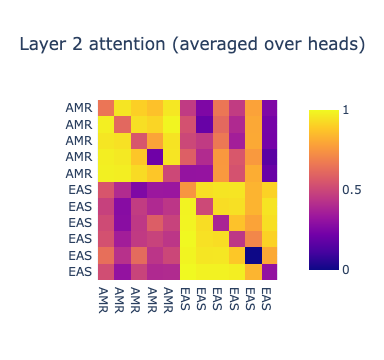

Test_32_t_f_1h AMR, SAS, EAS, AMR, AFR, AFR, AFR, EAS, EAS, EUR


<IPython.core.display.Javascript object>

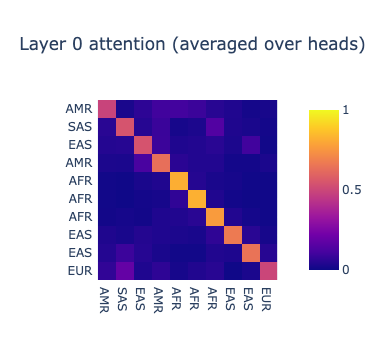

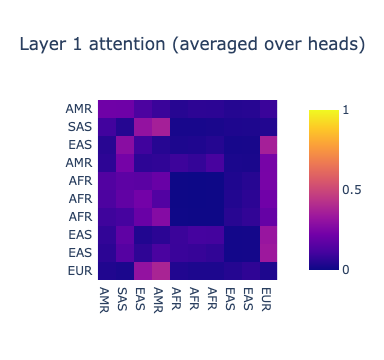

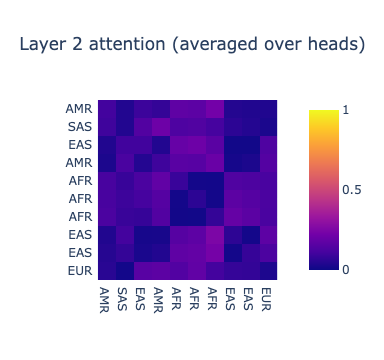

INVERTED:


<IPython.core.display.Javascript object>

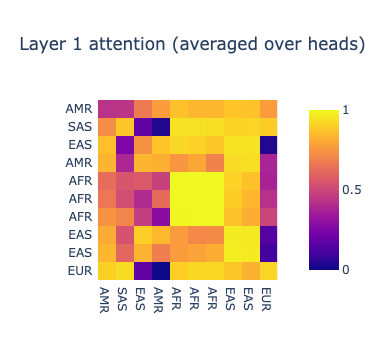

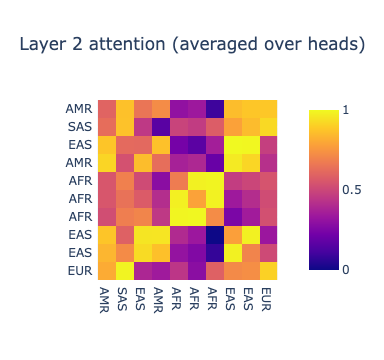

In [88]:
paper_inds = [afr_inds + sasian_inds, amer_clust_inds + easian_clust_inds, sel_inds[0]]
model = models[0]

for inds in paper_inds:
    viz_inds(inds, model, label_superpops)
    attn_weights, tokens = get_attn_for_inds(model, inds, label_superpops)
    inverted_attn = invert_attn(attn_weights, normalize=True)
    print("INVERTED:")
    head_view([torch.tensor(a) for a in inverted_attn], tokens)
    viz_layer_attn(attn_weights, tokens, inds, 1)
    viz_layer_attn(attn_weights, tokens, inds, 2)

## Attention Numerical Analysis

In [51]:

# The threshold above which the attn weight is considered showing significant attention
def get_attn_correctness(attn_weights, tokens, thresh=0.3):
    tokens = np.array(tokens)
    attns = np.array(attn_weights).squeeze()
    # Average over heads
    attns = attns if len(attns.shape) <= 3 else np.mean(attns, axis=1) 
    has_attn = attns >= thresh
    # print(attns.shape, tokens, has_attn)

    # Make same-shape arr of where the values should be >= thresh
    correct = np.full(attns.shape, False)
    for t in tokens:
        corr_inds = np.where(tokens == t)[0]
        # print(corr_inds)
        correct[np.ix_(list(range(len(correct))), corr_inds, corr_inds)] = True

    # The "correctness" per layer
    return (has_attn == correct).mean(axis=(1, 2))
    
        
def get_ip_perc(attn_weights, tokens):
    """Get the percentage of intra-connection (within the same populations) vs inter (connected to other pops)
    """
    tokens = np.array(tokens)
    attns = np.array(attn_weights).squeeze()
    # Normalize for percentages calc
    # attns = (attns - attns.min()) / (attns.max() - attns.min())
    
    # print(attns.shape)
    
    # Make same-shape arr of where the values should be >= thresh
    correct = np.full(attns.shape, False)
    for t in tokens:
        corr_inds = np.where(tokens == t)[0]
        # print(corr_inds)
        correct[np.ix_(list(range(len(correct))), corr_inds, corr_inds)] = True

    intra_perc = attns.copy()
    intra_perc[~correct] = 0
    intra_perc = intra_perc.sum(axis=1) / attns.sum(axis=1)
    return(intra_perc)
    
    
    # intra_perc =  attns[correct] / attns.sum(axis=1)
    # print(intra_perc.shape, intra_perc)

### Used in paper: Significance Testing

Wilcoxon Signed-Rank Test

* Example: Evaluating the effectiveness of a new medication by comparing patients’ pain levels before and after treatment.
* Justification: Wilcoxon signed-rank test is a non-parametric test used for paired data, assessing whether the ranks of differences between two related groups are significant.
* Test for ordinal or continuous data. In contrast to Student’s t-test, does not require the data to be normally distributed. This test too can be used for paired or unpaired data.
* Continuous, non-normal OR discrete

But maybe Fisher's exact test? Over chi-squared because small sample size


In [75]:
paper_inds = [afr_inds + sasian_inds, amer_clust_inds + easian_clust_inds, sel_inds[0]]
model = models[0]

layer_test_side = ["less", "less", "less"]

for inds in paper_inds:
    # viz_inds(inds, model, label_superpops)
    attn_weights, tokens = get_attn_for_inds(model, inds, label_superpops)
    ratios = get_ip_perc(attn_weights, tokens)
    print(tokens, np.mean(ratios, axis=1))
    
    # Log because Median = log-geometric mean
    # ratios = np.log(ratios)
    for i, layer in enumerate(ratios):
        # H0: median(log_ratios) == 0 (i.e., A/B == 1 on median)
        # print(wilcoxon(layer, alternative=layer_test_side[i]))
        print(wilcoxon(layer, alternative="two-sided", zero_method='pratt', method="exact"))

['AFR' 'AFR' 'AFR' 'SAS' 'SAS' 'SAS' 'SAS' 'SAS'] [0.8665104  0.29809433 0.34271556]
WilcoxonResult(statistic=0.0, pvalue=0.0078125)
WilcoxonResult(statistic=0.0, pvalue=0.0078125)
WilcoxonResult(statistic=0.0, pvalue=0.0078125)
['AMR' 'AMR' 'AMR' 'AMR' 'AMR' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS'] [0.8504415  0.22074436 0.27316287]
WilcoxonResult(statistic=0.0, pvalue=0.0009765625)
WilcoxonResult(statistic=0.0, pvalue=0.0009765625)
WilcoxonResult(statistic=0.0, pvalue=0.0009765625)
['AMR' 'SAS' 'EAS' 'AMR' 'AFR' 'AFR' 'AFR' 'EAS' 'EAS' 'EUR'] [0.71650064 0.08289979 0.10597932]
WilcoxonResult(statistic=0.0, pvalue=0.001953125)
WilcoxonResult(statistic=0.0, pvalue=0.001953125)
WilcoxonResult(statistic=0.0, pvalue=0.001953125)


### Average across random runs of all individuals

All 2500 individuals sampled and run as random groups of 10

In [61]:
def get_avg_ip(model, layer):
    # Drop last 3
    all_inds = np.random.permutation(2500).reshape((250, 10))

    all_tokens, all_ip = np.full(2500, "tst"), np.zeros(2500)
    for i, inds in enumerate(all_inds):
        attn_weights, tokens = get_attn_for_inds(model, inds, label_superpops)
        # print(tokens)
        all_tokens[(i*10):((i+1)*10)] = tokens
        all_ip[(i*10):((i+1)*10)] = get_ip_perc(attn_weights, tokens)[layer]
    
    
    vals = {}
    for pop in label_superpops.unique().tolist():
        pop_ip = all_ip[np.where(all_tokens == pop)[0]]
        print(len(pop_ip))
        vals[pop] = {"mean": pop_ip.mean(), "sterr": pop_ip.std() / np.sqrt(len(pop_ip))}
    
    print(vals)
    
    avg_ip_df = pd.DataFrame(vals).T.reset_index()
    avg_ip_df.columns = ["Population", "Intra", "sterr"]
    avg_ip_df["Inter"] = 1 - avg_ip_df["Intra"]
    return avg_ip_df

In [62]:
avg_ip_l1_df = get_avg_ip(models[0], 0)
avg_ip_l1_df

503
504
347
485
661
{'EUR': {'mean': 0.7670600743997642, 'sterr': 0.003356268520318997}, 'EAS': {'mean': 0.7700718863615914, 'sterr': 0.003134190142529438}, 'AMR': {'mean': 0.709939738171932, 'sterr': 0.004781780960588651}, 'SAS': {'mean': 0.7565548136983951, 'sterr': 0.0042079557343049365}, 'AFR': {'mean': 0.7148845782799367, 'sterr': 0.002998580629636243}}


,Population,Intra,sterr,Inter
0,EUR,0.767060,0.003356,0.232940
1,EAS,0.770072,0.003134,0.229928
2,AMR,0.709940,0.004782,0.290060
3,SAS,0.756555,0.004208,0.243445
4,AFR,0.714885,0.002999,0.285115


In [63]:
avg_ip_l2_df = get_avg_ip(models[0], 1)
avg_ip_l2_df_inv = avg_ip_l2_df.copy()
avg_ip_l2_df_inv[["Intra", "Inter"]] =  1 - avg_ip_l2_df_inv[["Intra", "Inter"]]
avg_ip_l2_df, avg_ip_l2_df_inv

503
504
347
485
661
{'EUR': {'mean': 0.16296321602823366, 'sterr': 0.004279678476820409}, 'EAS': {'mean': 0.118524494735221, 'sterr': 0.003722417656561986}, 'AMR': {'mean': 0.1730643148669538, 'sterr': 0.006807998069435025}, 'SAS': {'mean': 0.21031537352648286, 'sterr': 0.005532889005978132}, 'AFR': {'mean': 0.06808254960572147, 'sterr': 0.0032552270000630852}}


(  Population     Intra     sterr     Inter
 0        EUR  0.162963  0.004280  0.837037
 1        EAS  0.118524  0.003722  0.881476
 2        AMR  0.173064  0.006808  0.826936
 3        SAS  0.210315  0.005533  0.789685
 4        AFR  0.068083  0.003255  0.931917,
   Population     Intra     sterr     Inter
 0        EUR  0.837037  0.004280  0.162963
 1        EAS  0.881476  0.003722  0.118524
 2        AMR  0.826936  0.006808  0.173064
 3        SAS  0.789685  0.005533  0.210315
 4        AFR  0.931917  0.003255  0.068083)

In [64]:
avg_ip_l3_df = get_avg_ip(models[0], 2)
avg_ip_l3_df_inv = avg_ip_l3_df.copy()
avg_ip_l3_df_inv[["Intra", "Inter"]] =  1 - avg_ip_l3_df_inv[["Intra", "Inter"]]
avg_ip_l3_df, avg_ip_l2_df_inv

503
504
347
485
661
{'EUR': {'mean': 0.22487599574488626, 'sterr': 0.005630528234366072}, 'EAS': {'mean': 0.16225194377041172, 'sterr': 0.00431738895896646}, 'AMR': {'mean': 0.22068410425283208, 'sterr': 0.006247026856144423}, 'SAS': {'mean': 0.26234557916669504, 'sterr': 0.00565931692865021}, 'AFR': {'mean': 0.12684132315714403, 'sterr': 0.0036560661768167916}}


(  Population     Intra     sterr     Inter
 0        EUR  0.224876  0.005631  0.775124
 1        EAS  0.162252  0.004317  0.837748
 2        AMR  0.220684  0.006247  0.779316
 3        SAS  0.262346  0.005659  0.737654
 4        AFR  0.126841  0.003656  0.873159,
   Population     Intra     sterr     Inter
 0        EUR  0.837037  0.004280  0.162963
 1        EAS  0.881476  0.003722  0.118524
 2        AMR  0.826936  0.006808  0.173064
 3        SAS  0.789685  0.005533  0.210315
 4        AFR  0.931917  0.003255  0.068083)

#### Significance Testing

In [76]:
for df in [avg_ip_l1_df, avg_ip_l2_df_inv, avg_ip_l3_df_inv]:
    ratios = df["Intra"].tolist()
    log_ratios = np.log(ratios)
    # print(log_ratios)
    print(np.mean(ratios), wilcoxon(log_ratios, alternative="less", zero_method='pratt', method="exact"))

0.7437022181823238 WilcoxonResult(statistic=0.0, pvalue=0.03125)
0.8534100102474774 WilcoxonResult(statistic=0.0, pvalue=0.03125)
0.800600210781606 WilcoxonResult(statistic=0.0, pvalue=0.03125)


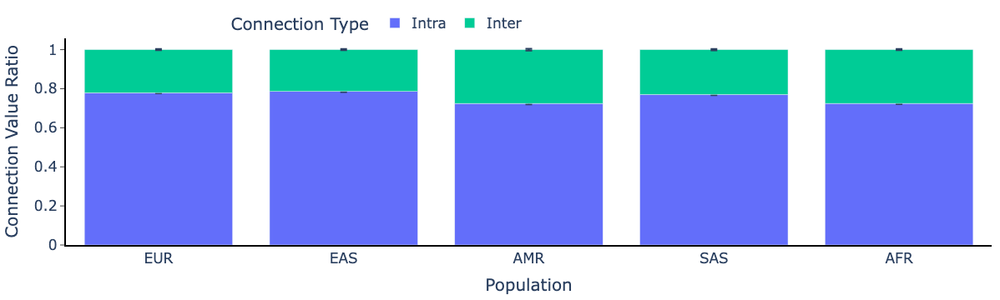

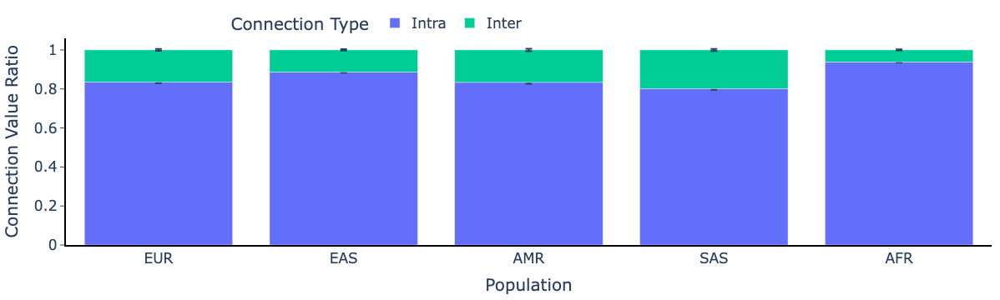

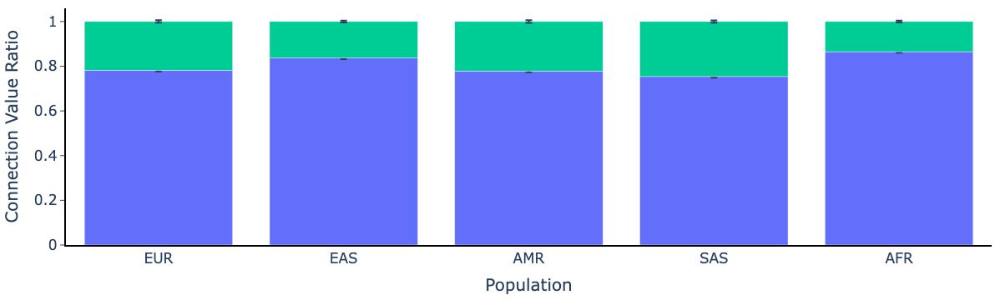

In [23]:
fig = px.bar(avg_ip_l1_df, x="Population", y=["Intra", "Inter"], error_y="sterr")
fig.update_layout(legend=dict(orientation="h", title="Connection Type", x=0.5, y=1), yaxis_title="Connection Value Ratio")
fig.write_image("images/ip_l1.pdf")
fig.show()

fig = px.bar(avg_ip_l2_df_inv, x="Population", y=["Intra", "Inter"], error_y="sterr")
fig.update_layout(legend=dict(orientation="h", title="Connection Type", x=0.5, y=1), yaxis_title="Connection Value Ratio")
fig.write_image("images/ip_l2_inv.pdf")
fig.show()

fig = px.bar(avg_ip_l3_df_inv, x="Population", y=["Intra", "Inter"], error_y="sterr")
fig.update_layout(legend_visible=False, yaxis_title="Connection Value Ratio")
fig.write_image("images/ip_l3_inv.pdf")
fig.show()

In [100]:
# Do all possible combinations of 2 nationalities
all_clusts = [afr_inds, sasian_inds, amer_clust_inds, euro_clust_inds, easian_clust_inds]
model = models[0]
for c1, c2 in itertools.combinations(all_clusts, 2):
    inds = c1 + c2
    attn_weights, tokens = get_attn_for_inds(model, inds, label_superpops)
    print(tokens)
    display.display(pd.DataFrame({"Pop": tokens, "Intra": get_ip_perc(attn_weights, tokens)[0]}))

['AFR' 'AFR' 'AFR' 'SAS' 'SAS' 'SAS' 'SAS' 'SAS']


,Pop,Intra
0,AFR,0.779413
1,AFR,0.850340
2,AFR,0.806232
3,SAS,0.854057
4,SAS,0.932792
5,SAS,0.942590
6,SAS,0.959016
7,SAS,0.947884


['AFR' 'AFR' 'AFR' 'AMR' 'AMR' 'AMR' 'AMR' 'AMR']


,Pop,Intra
0,AFR,0.777352
1,AFR,0.820071
2,AFR,0.810952
3,AMR,0.888693
4,AMR,0.949214
5,AMR,0.923166
6,AMR,0.932763
7,AMR,0.955082


['AFR' 'AFR' 'AFR' 'EUR' 'EUR' 'EUR' 'EUR']


,Pop,Intra
0,AFR,0.821849
1,AFR,0.803994
2,AFR,0.859266
3,EUR,0.886808
4,EUR,0.916260
5,EUR,0.953513
6,EUR,0.868863


['AFR' 'AFR' 'AFR' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS']


,Pop,Intra
0,AFR,0.752326
1,AFR,0.774281
2,AFR,0.715864
3,EAS,0.898214
4,EAS,0.893304
5,EAS,0.934005
6,EAS,0.941145
7,EAS,0.909225
8,EAS,0.875427


['SAS' 'SAS' 'SAS' 'SAS' 'SAS' 'AMR' 'AMR' 'AMR' 'AMR' 'AMR']


,Pop,Intra
0,SAS,0.847937
1,SAS,0.778572
2,SAS,0.739837
3,SAS,0.835402
4,SAS,0.875145
5,AMR,0.812896
6,AMR,0.816977
7,AMR,0.888807
8,AMR,0.771986
9,AMR,0.880302


['SAS' 'SAS' 'SAS' 'SAS' 'SAS' 'EUR' 'EUR' 'EUR' 'EUR']


,Pop,Intra
0,SAS,0.810180
1,SAS,0.825218
2,SAS,0.864486
3,SAS,0.849870
4,SAS,0.800312
5,EUR,0.820263
6,EUR,0.759118
7,EUR,0.853708
8,EUR,0.856717


['SAS' 'SAS' 'SAS' 'SAS' 'SAS' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS']


,Pop,Intra
0,SAS,0.875781
1,SAS,0.844230
2,SAS,0.865657
3,SAS,0.884228
4,SAS,0.932493
5,EAS,0.892025
6,EAS,0.871789
7,EAS,0.881810
8,EAS,0.876265
9,EAS,0.856350


['AMR' 'AMR' 'AMR' 'AMR' 'AMR' 'EUR' 'EUR' 'EUR' 'EUR']


,Pop,Intra
0,AMR,0.711257
1,AMR,0.874050
2,AMR,0.922917
3,AMR,0.832503
4,AMR,0.804667
5,EUR,0.784021
6,EUR,0.827651
7,EUR,0.817281
8,EUR,0.870805


['AMR' 'AMR' 'AMR' 'AMR' 'AMR' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS']


,Pop,Intra
0,AMR,0.813594
1,AMR,0.881687
2,AMR,0.895512
3,AMR,0.876085
4,AMR,0.906658
5,EAS,0.892139
6,EAS,0.883436
7,EAS,0.870216
8,EAS,0.846717
9,EAS,0.793039


['EUR' 'EUR' 'EUR' 'EUR' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS' 'EAS']


,Pop,Intra
0,EUR,0.810621
1,EUR,0.871194
2,EUR,0.887814
3,EUR,0.901857
4,EAS,0.883656
5,EAS,0.823127
6,EAS,0.832439
7,EAS,0.848747
8,EAS,0.876643
9,EAS,0.854184


In [103]:
# Find intra percentage for some random inds
# Random inds length
rlen = 15
nlayers = 3
nrep = 50

model_accs = np.zeros((nrep, nlayers))
model = models[0]

for i in range(nrep):
    inds = np.random.randint(2503, size=rlen)
    print(labels_both[inds].tolist())
    print(*inds, sep=",")
    attn_weights, tokens = get_attn_for_inds(model, inds, label_superpops)
    ip = get_ip_perc(attn_weights, tokens).mean(axis=1)
    model_accs[i, :] = ip
    print(f"{i} intra percentage: {ip}")
    display.display(pd.DataFrame({"Pop": tokens, "Intra": get_ip_perc(attn_weights, tokens)[0]}))
    display.display(pd.DataFrame({"Pop": tokens, "Intra": get_ip_perc(attn_weights, tokens)[1]}))
        
print(f"Average intra percentage per layer: {model_accs.mean(axis=0)}")
print(f"STD intra percentage per layer: {model_accs.std(axis=0)}")
print(f"Lowest: {model_accs.argmin(axis=0)}")

['AMR (CLM)', 'AFR (ESN)', 'EUR (GBR)', 'AFR (YRI)', 'EAS (CHB)', 'EAS (JPT)', 'SAS (GIH)', 'AFR (MSL)', 'EAS (JPT)', 'AMR (PUR)', 'AFR (LWK)', 'EAS (KHV)', 'AMR (CLM)', 'AFR (LWK)', 'AFR (MSL)']
411,1202,20,2085,1860,1954,2406,1172,1954,358,2090,972,378,2126,1299
0 intra percentage: [0.7047317  0.07365651 0.10853379]


,Pop,Intra
0,AMR,0.551856
1,AFR,0.655310
2,EUR,0.504152
3,AFR,0.708673
4,EAS,0.750758
5,EAS,0.741250
6,SAS,0.631884
7,AFR,0.743536
8,EAS,0.712231
9,AMR,0.735640


,Pop,Intra
0,AMR,0.129255
1,AFR,0.119917
2,EUR,0.026139
3,AFR,0.119843
4,EAS,0.043977
5,EAS,0.065760
6,SAS,0.017444
7,AFR,0.010384
8,EAS,0.034274
9,AMR,0.189255


['EAS (KHV)', 'AMR (MXL)', 'AFR (GWD)', 'EUR (FIN)', 'EUR (IBS)', 'EUR (TSI)', 'EAS (CHS)', 'EUR (IBS)', 'AFR (GWD)', 'EAS (KHV)', 'SAS (BEB)', 'AFR (GWD)', 'AMR (MXL)', 'EAS (CHS)', 'AFR (ESN)']
801,2184,1032,160,523,2312,231,607,1159,659,1527,1011,2170,230,1195
1 intra percentage: [0.6781698  0.07210371 0.1276856 ]


,Pop,Intra
0,EAS,0.696181
1,AMR,0.669710
2,AFR,0.648507
3,EUR,0.700011
4,EUR,0.818519
5,EUR,0.680345
6,EAS,0.766437
7,EUR,0.715012
8,AFR,0.516909
9,EAS,0.713786


,Pop,Intra
0,EAS,0.060794
1,AMR,0.071966
2,AFR,0.034656
3,EUR,0.157703
4,EUR,0.145766
5,EUR,0.136455
6,EAS,0.084604
7,EUR,0.124680
8,AFR,0.008435
9,EAS,0.058466


['EUR (TSI)', 'EUR (FIN)', 'AFR (ESN)', 'SAS (GIH)', 'EAS (CDX)', 'AMR (CLM)', 'EAS (CHB)', 'EAS (CDX)', 'AFR (GWD)', 'AFR (ACB)', 'AFR (MSL)', 'AFR (ESN)', 'SAS (BEB)', 'SAS (GIH)', 'AMR (CLM)']
2359,64,1199,2458,626,409,1781,931,1087,940,1282,1196,1346,2493,447
2 intra percentage: [0.67051876 0.06630333 0.11502443]


,Pop,Intra
0,EUR,0.643287
1,EUR,0.609685
2,AFR,0.572332
3,SAS,0.668099
4,EAS,0.778643
5,AMR,0.502601
6,EAS,0.822706
7,EAS,0.663145
8,AFR,0.602931
9,AFR,0.765297


,Pop,Intra
0,EUR,0.054038
1,EUR,0.057440
2,AFR,0.069919
3,SAS,0.103604
4,EAS,0.039088
5,AMR,0.036118
6,EAS,0.069792
7,EAS,0.116714
8,AFR,0.017149
9,AFR,0.063220


['SAS (BEB)', 'EUR (CEU)', 'EUR (IBS)', 'AFR (ASW)', 'SAS (BEB)', 'EAS (CDX)', 'AMR (PEL)', 'AMR (CLM)', 'EUR (TSI)', 'EAS (CHB)', 'EUR (TSI)', 'EUR (IBS)', 'EAS (CDX)', 'SAS (GIH)', 'AFR (LWK)']
1470,1727,523,2289,1467,319,737,435,2365,1824,2338,559,833,2459,2167
3 intra percentage: [0.68061936 0.11480281 0.1871499 ]


,Pop,Intra
0,SAS,0.651400
1,EUR,0.787756
2,EUR,0.800253
3,AFR,0.635824
4,SAS,0.640260
5,EAS,0.591691
6,AMR,0.466236
7,AMR,0.653712
8,EUR,0.740991
9,EAS,0.745607


,Pop,Intra
0,SAS,0.109007
1,EUR,0.236349
2,EUR,0.206766
3,AFR,0.018681
4,SAS,0.130652
5,EAS,0.038272
6,AMR,0.070891
7,AMR,0.108130
8,EUR,0.163204
9,EAS,0.074936


['EAS (KHV)', 'AFR (ASW)', 'EUR (TSI)', 'AFR (LWK)', 'EAS (CDX)', 'AMR (MXL)', 'EAS (CHS)', 'EUR (FIN)', 'EAS (KHV)', 'AMR (CLM)', 'EUR (GBR)', 'SAS (GIH)', 'AFR (MSL)', 'EUR (GBR)', 'AMR (PEL)']
759,2282,2370,2120,638,2222,292,64,808,433,17,2417,1289,43,863
4 intra percentage: [0.67301136 0.09768841 0.14955933]


,Pop,Intra
0,EAS,0.578200
1,AFR,0.533265
2,EUR,0.684352
3,AFR,0.663700
4,EAS,0.718962
5,AMR,0.613555
6,EAS,0.658622
7,EUR,0.677419
8,EAS,0.778157
9,AMR,0.735644


,Pop,Intra
0,EAS,0.089198
1,AFR,0.036425
2,EUR,0.193136
3,AFR,0.018795
4,EAS,0.063130
5,AMR,0.138417
6,EAS,0.095169
7,EUR,0.138261
8,EAS,0.086662
9,AMR,0.125071


['AFR (ESN)', 'EAS (KHV)', 'EAS (JPT)', 'AMR (PEL)', 'SAS (STU)', 'AFR (YRI)', 'SAS (PJL)', 'AMR (PEL)', 'EUR (FIN)', 'AMR (CLM)', 'AFR (YRI)', 'AFR (ESN)', 'AFR (YRI)', 'SAS (STU)', 'AFR (ASW)']
1226,778,1963,723,1547,1894,1152,859,180,457,1768,1250,1887,1433,2258
5 intra percentage: [0.6607963  0.08548207 0.15442099]


,Pop,Intra
0,AFR,0.559385
1,EAS,0.666041
2,EAS,0.625984
3,AMR,0.526348
4,SAS,0.671244
5,AFR,0.723993
6,SAS,0.671843
7,AMR,0.501461
8,EUR,0.603085
9,AMR,0.744468


,Pop,Intra
0,AFR,0.046485
1,EAS,0.081971
2,EAS,0.067496
3,AMR,0.120711
4,SAS,0.137344
5,AFR,0.010898
6,SAS,0.131332
7,AMR,0.213722
8,EUR,0.030198
9,AMR,0.184612


['AFR (ESN)', 'EUR (IBS)', 'SAS (GIH)', 'SAS (BEB)', 'AMR (PEL)', 'EAS (CHS)', 'EAS (CHS)', 'EUR (FIN)', 'AFR (ESN)', 'EUR (TSI)', 'EUR (GBR)', 'SAS (ITU)', 'EAS (KHV)', 'AMR (PUR)', 'AFR (ASW)']
1254,509,2422,1535,935,262,269,157,1127,2314,25,1653,757,405,2277
6 intra percentage: [0.697005   0.11085866 0.15461653]


,Pop,Intra
0,AFR,0.576870
1,EUR,0.804727
2,SAS,0.699056
3,SAS,0.718042
4,AMR,0.615197
5,EAS,0.715228
6,EAS,0.737208
7,EUR,0.654938
8,AFR,0.760784
9,EUR,0.683455


,Pop,Intra
0,AFR,0.015718
1,EUR,0.191187
2,SAS,0.199713
3,SAS,0.142031
4,AMR,0.123764
5,EAS,0.059601
6,EAS,0.059754
7,EUR,0.184490
8,AFR,0.004564
9,EUR,0.192193


['EAS (CDX)', 'EUR (FIN)', 'SAS (ITU)', 'EUR (IBS)', 'AFR (GWD)', 'EUR (FIN)', 'EAS (CHB)', 'AFR (LWK)', 'AFR (ESN)', 'AMR (PEL)', 'AFR (GWD)', 'EUR (GBR)', 'EAS (CHB)', 'AFR (LWK)', 'SAS (ITU)']
919,164,1497,513,1032,110,1862,2153,1193,786,1110,29,1780,1976,1499
7 intra percentage: [0.62608653 0.08361889 0.11087577]


,Pop,Intra
0,EAS,0.460170
1,EUR,0.556553
2,SAS,0.653909
3,EUR,0.676212
4,AFR,0.621563
5,EUR,0.669488
6,EAS,0.772672
7,AFR,0.632504
8,AFR,0.626600
9,AMR,0.545021


,Pop,Intra
0,EAS,0.081595
1,EUR,0.155446
2,SAS,0.081817
3,EUR,0.167531
4,AFR,0.010692
5,EUR,0.180744
6,EAS,0.172934
7,AFR,0.006748
8,AFR,0.012197
9,AMR,0.054302


['AFR (ESN)', 'AFR (LWK)', 'EUR (CEU)', 'AFR (YRI)', 'SAS (GIH)', 'SAS (BEB)', 'AFR (LWK)', 'SAS (PJL)', 'EAS (KHV)', 'SAS (PJL)', 'AMR (PEL)', 'EUR (CEU)', 'AFR (ESN)', 'EAS (CHB)', 'AMR (PUR)']
1211,2159,1730,1755,2419,1613,2141,1083,654,1435,704,1728,1258,1853,229
8 intra percentage: [0.6646916  0.07467043 0.10914287]


,Pop,Intra
0,AFR,0.623417
1,AFR,0.611999
2,EUR,0.698038
3,AFR,0.724048
4,SAS,0.821965
5,SAS,0.769565
6,AFR,0.527287
7,SAS,0.711506
8,EAS,0.628182
9,SAS,0.775682


,Pop,Intra
0,AFR,0.069605
1,AFR,0.093083
2,EUR,0.095692
3,AFR,0.047286
4,SAS,0.091852
5,SAS,0.112548
6,AFR,0.015249
7,SAS,0.162410
8,EAS,0.018754
9,SAS,0.112261


['EUR (FIN)', 'AMR (CLM)', 'AMR (CLM)', 'EUR (TSI)', 'EUR (FIN)', 'EUR (IBS)', 'AFR (ESN)', 'AMR (MXL)', 'EUR (FIN)', 'EAS (CHS)', 'EAS (KHV)', 'EUR (FIN)', 'AFR (ESN)', 'AFR (MSL)', 'AFR (MSL)']
106,484,480,2330,133,556,1253,2217,71,223,759,112,1256,1174,1296
9 intra percentage: [0.6922516  0.17160845 0.16736636]


,Pop,Intra
0,EUR,0.628937
1,AMR,0.629627
2,AMR,0.651504
3,EUR,0.800942
4,EUR,0.872419
5,EUR,0.844211
6,AFR,0.590595
7,AMR,0.637619
8,EUR,0.772068
9,EAS,0.700586


,Pop,Intra
0,EUR,0.361644
1,AMR,0.213791
2,AMR,0.225941
3,EUR,0.298090
4,EUR,0.332000
5,EUR,0.279949
6,AFR,0.002004
7,AMR,0.220130
8,EUR,0.277957
9,EAS,0.049592


['AFR (ESN)', 'AFR (ASW)', 'SAS (GIH)', 'EAS (CHB)', 'AMR (MXL)', 'EUR (CEU)', 'EUR (GBR)', 'SAS (ITU)', 'EAS (CDX)', 'EAS (CHS)', 'AFR (ESN)', 'EAS (CDX)', 'SAS (STU)', 'EUR (GBR)', 'AMR (MXL)']
1133,2169,2486,1827,2217,1658,84,1592,928,288,1133,924,1510,76,2182
10 intra percentage: [0.6770022  0.0767853  0.15486011]


,Pop,Intra
0,AFR,0.588132
1,AFR,0.570521
2,SAS,0.620049
3,EAS,0.886993
4,AMR,0.660996
5,EUR,0.618201
6,EUR,0.704968
7,SAS,0.731590
8,EAS,0.713872
9,EAS,0.746065


,Pop,Intra
0,AFR,0.017262
1,AFR,0.056778
2,SAS,0.206857
3,EAS,0.089683
4,AMR,0.072816
5,EUR,0.043204
6,EUR,0.043266
7,SAS,0.117815
8,EAS,0.091799
9,EAS,0.100566


['EUR (CEU)', 'EAS (JPT)', 'EUR (TSI)', 'AMR (CLM)', 'AMR (CLM)', 'AFR (MSL)', 'EUR (CEU)', 'EAS (JPT)', 'AFR (GWD)', 'AFR (MSL)', 'SAS (PJL)', 'AFR (ACB)', 'EAS (KHV)', 'EAS (JPT)', 'EUR (FIN)']
1750,2025,2371,446,473,1288,1742,2011,1086,1287,1148,683,785,1915,129
11 intra percentage: [0.67068654 0.08547185 0.1385746 ]


,Pop,Intra
0,EUR,0.600540
1,EAS,0.719271
2,EUR,0.800868
3,AMR,0.658031
4,AMR,0.508748
5,AFR,0.532944
6,EUR,0.721878
7,EAS,0.736071
8,AFR,0.610798
9,AFR,0.664155


,Pop,Intra
0,EUR,0.166908
1,EAS,0.088252
2,EUR,0.134462
3,AMR,0.075495
4,AMR,0.073349
5,AFR,0.005247
6,EUR,0.126825
7,EAS,0.091478
8,AFR,0.019426
9,AFR,0.032695


['SAS (GIH)', 'SAS (PJL)', 'AMR (PEL)', 'SAS (STU)', 'AFR (GWD)', 'EUR (FIN)', 'EUR (IBS)', 'AMR (PUR)', 'AFR (LWK)', 'SAS (GIH)', 'EAS (CHS)', 'EUR (TSI)', 'SAS (ITU)', 'AMR (PEL)', 'SAS (GIH)']
2429,1148,862,1586,1155,170,580,400,1991,2482,241,2369,1492,716,2482
12 intra percentage: [0.7065164  0.18451443 0.23558594]


,Pop,Intra
0,SAS,0.684611
1,SAS,0.738862
2,AMR,0.552386
3,SAS,0.859828
4,AFR,0.585129
5,EUR,0.797197
6,EUR,0.635387
7,AMR,0.709848
8,AFR,0.590997
9,SAS,0.852049


,Pop,Intra
0,SAS,0.369822
1,SAS,0.391457
2,AMR,0.135633
3,SAS,0.245369
4,AFR,0.002646
5,EUR,0.171560
6,EUR,0.106833
7,AMR,0.331351
8,AFR,0.001421
9,SAS,0.251463


['AFR (ASW)', 'EAS (CDX)', 'EAS (CHB)', 'EAS (JPT)', 'EUR (FIN)', 'AMR (PEL)', 'SAS (PJL)', 'AFR (ASW)', 'AFR (ACB)', 'SAS (STU)', 'AMR (PUR)', 'EUR (GBR)', 'EUR (TSI)', 'EAS (CHS)', 'EAS (JPT)']
2193,620,1812,1907,133,862,1001,2249,742,1587,386,93,2327,222,1958
13 intra percentage: [0.7189736  0.09504034 0.14872672]


,Pop,Intra
0,AFR,0.582441
1,EAS,0.729636
2,EAS,0.841928
3,EAS,0.808629
4,EUR,0.803032
5,AMR,0.384454
6,SAS,0.650661
7,AFR,0.596126
8,AFR,0.645935
9,SAS,0.790768


,Pop,Intra
0,AFR,0.030009
1,EAS,0.140446
2,EAS,0.144830
3,EAS,0.141707
4,EUR,0.104424
5,AMR,0.193603
6,SAS,0.058815
7,AFR,0.000713
8,AFR,0.002737
9,SAS,0.138174


['AFR (ACB)', 'AMR (MXL)', 'AFR (ASW)', 'AFR (ASW)', 'EUR (FIN)', 'AFR (YRI)', 'EAS (JPT)', 'AFR (LWK)', 'AFR (YRI)', 'EUR (FIN)', 'EUR (FIN)', 'AFR (MSL)', 'AMR (CLM)', 'EAS (CHS)', 'EAS (CHB)']
867,2229,2282,2289,110,2066,2019,2137,2034,111,149,1187,377,236,1795
14 intra percentage: [0.6783632  0.05974381 0.11139789]


,Pop,Intra
0,AFR,0.586122
1,AMR,0.388076
2,AFR,0.734394
3,AFR,0.688820
4,EUR,0.665844
5,AFR,0.732685
6,EAS,0.721508
7,AFR,0.697293
8,AFR,0.754201
9,EUR,0.681080


,Pop,Intra
0,AFR,0.056149
1,AMR,0.047093
2,AFR,0.144031
3,AFR,0.095305
4,EUR,0.063494
5,AFR,0.021191
6,EAS,0.051544
7,AFR,0.030970
8,AFR,0.037747
9,EUR,0.094511


['EUR (IBS)', 'EUR (TSI)', 'SAS (PJL)', 'AFR (MSL)', 'AMR (PEL)', 'AFR (LWK)', 'SAS (PJL)', 'AFR (ACB)', 'AFR (GWD)', 'EAS (CHB)', 'SAS (STU)', 'EUR (FIN)', 'AFR (ESN)', 'EAS (CHB)', 'AMR (PUR)']
585,2369,1398,1279,876,2142,1153,942,1162,1793,1485,62,1231,1792,344
15 intra percentage: [0.64006025 0.08347867 0.12785839]


,Pop,Intra
0,EUR,0.656527
1,EUR,0.698056
2,SAS,0.662729
3,AFR,0.653816
4,AMR,0.564282
5,AFR,0.693637
6,SAS,0.405513
7,AFR,0.691995
8,AFR,0.620406
9,EAS,0.639060


,Pop,Intra
0,EUR,0.138399
1,EUR,0.153367
2,SAS,0.147691
3,AFR,0.043372
4,AMR,0.039834
5,AFR,0.011377
6,SAS,0.287093
7,AFR,0.007576
8,AFR,0.011526
9,EAS,0.049669


['EAS (KHV)', 'SAS (STU)', 'EAS (JPT)', 'SAS (BEB)', 'EAS (CHB)', 'AMR (PUR)', 'EAS (KHV)', 'AFR (LWK)', 'AMR (PUR)', 'EUR (IBS)', 'SAS (STU)', 'AMR (PUR)', 'AFR (ESN)', 'EUR (IBS)', 'SAS (PJL)']
809,1423,1948,1535,1786,468,804,2147,355,602,1587,427,1204,605,1001
16 intra percentage: [0.6597973  0.11260652 0.18601672]


,Pop,Intra
0,EAS,0.706514
1,SAS,0.673126
2,EAS,0.819198
3,SAS,0.720842
4,EAS,0.645788
5,AMR,0.649993
6,EAS,0.641789
7,AFR,0.557121
8,AMR,0.689857
9,EUR,0.738045


,Pop,Intra
0,EAS,0.069752
1,SAS,0.194882
2,EAS,0.147325
3,SAS,0.199381
4,EAS,0.053446
5,AMR,0.115218
6,EAS,0.071680
7,AFR,0.001443
8,AMR,0.136164
9,EUR,0.106493


['EAS (CHB)', 'AFR (MSL)', 'SAS (ITU)', 'EUR (FIN)', 'AMR (MXL)', 'AMR (CLM)', 'AMR (PEL)', 'EAS (JPT)', 'AMR (CLM)', 'EAS (CHB)', 'EAS (KHV)', 'AFR (ESN)', 'SAS (STU)', 'EAS (CHS)', 'SAS (ITU)']
1813,1186,1654,170,2171,408,699,1969,378,1844,654,1250,1367,281,1549
17 intra percentage: [0.66171765 0.13716334 0.20813532]


,Pop,Intra
0,EAS,0.670775
1,AFR,0.517343
2,SAS,0.733351
3,EUR,0.716999
4,AMR,0.720946
5,AMR,0.606624
6,AMR,0.642031
7,EAS,0.720487
8,AMR,0.709396
9,EAS,0.794184


,Pop,Intra
0,EAS,0.119220
1,AFR,0.017676
2,SAS,0.182528
3,EUR,0.051970
4,AMR,0.221277
5,AMR,0.249988
6,AMR,0.268584
7,EAS,0.157413
8,AMR,0.244891
9,EAS,0.123436


['AFR (MSL)', 'AMR (PEL)', 'EAS (CDX)', 'AFR (YRI)', 'EUR (FIN)', 'EUR (IBS)', 'EAS (CHB)', 'AFR (LWK)', 'EUR (FIN)', 'EUR (FIN)', 'EAS (JPT)', 'SAS (GIH)', 'SAS (ITU)', 'EAS (KHV)', 'EUR (CEU)']
1165,704,920,2069,124,555,1780,2148,145,125,1996,2459,1408,781,1681
18 intra percentage: [0.6283602  0.09373712 0.14429766]


,Pop,Intra
0,AFR,0.469403
1,AMR,0.557973
2,EAS,0.646663
3,AFR,0.587784
4,EUR,0.771281
5,EUR,0.675012
6,EAS,0.593747
7,AFR,0.544430
8,EUR,0.611506
9,EUR,0.701830


,Pop,Intra
0,AFR,0.012102
1,AMR,0.047413
2,EAS,0.136595
3,AFR,0.016713
4,EUR,0.147957
5,EUR,0.166634
6,EAS,0.078967
7,AFR,0.000241
8,EUR,0.183451
9,EUR,0.200937


['EAS (KHV)', 'AFR (ACB)', 'EUR (FIN)', 'AFR (YRI)', 'AFR (ESN)', 'SAS (PJL)', 'AFR (LWK)', 'EUR (CEU)', 'EAS (CHS)', 'SAS (PJL)', 'SAS (ITU)', 'AFR (MSL)', 'AFR (GWD)', 'SAS (BEB)', 'EUR (GBR)']
774,949,141,1883,1215,1028,2094,1656,210,1151,1576,1304,946,1522,18
19 intra percentage: [0.631917   0.12562776 0.14920208]


,Pop,Intra
0,EAS,0.620793
1,AFR,0.559952
2,EUR,0.628718
3,AFR,0.593869
4,AFR,0.647477
5,SAS,0.255591
6,AFR,0.622921
7,EUR,0.562182
8,EAS,0.707629
9,SAS,0.735046


,Pop,Intra
0,EAS,0.019869
1,AFR,0.072986
2,EUR,0.113248
3,AFR,0.056952
4,AFR,0.020607
5,SAS,0.604690
6,AFR,0.012572
7,EUR,0.091209
8,EAS,0.023413
9,SAS,0.142481


['SAS (BEB)', 'SAS (ITU)', 'EUR (CEU)', 'AFR (GWD)', 'EAS (CHS)', 'EAS (CDX)', 'EAS (CHB)', 'EUR (TSI)', 'EUR (CEU)', 'SAS (BEB)', 'EUR (TSI)', 'SAS (PJL)', 'AFR (YRI)', 'SAS (PJL)', 'SAS (BEB)']
1467,1502,1731,1244,206,902,1780,2387,1748,1622,2372,1028,2036,961,1520
20 intra percentage: [0.65664667 0.20731607 0.22171184]


,Pop,Intra
0,SAS,0.686909
1,SAS,0.766734
2,EUR,0.594287
3,AFR,0.574862
4,EAS,0.639753
5,EAS,0.754519
6,EAS,0.593361
7,EUR,0.712916
8,EUR,0.741298
9,SAS,0.734934


,Pop,Intra
0,SAS,0.386410
1,SAS,0.349797
2,EUR,0.225690
3,AFR,0.017177
4,EAS,0.037157
5,EAS,0.051455
6,EAS,0.046885
7,EUR,0.109127
8,EUR,0.119405
9,SAS,0.378123


['SAS (PJL)', 'AMR (MXL)', 'EUR (CEU)', 'AFR (MSL)', 'EAS (CDX)', 'AFR (MSL)', 'EUR (TSI)', 'AMR (PUR)', 'AFR (MSL)', 'EAS (CHS)', 'EUR (TSI)', 'AFR (ESN)', 'EAS (JPT)', 'EAS (KHV)', 'SAS (STU)']
1360,2227,1749,1314,932,1301,2315,468,1169,187,2365,1132,1955,650,1605
21 intra percentage: [0.67097163 0.06101772 0.10906548]


,Pop,Intra
0,SAS,0.627825
1,AMR,0.694525
2,EUR,0.666566
3,AFR,0.579337
4,EAS,0.665516
5,AFR,0.615063
6,EUR,0.731352
7,AMR,0.591695
8,AFR,0.667950
9,EAS,0.767230


,Pop,Intra
0,SAS,0.086282
1,AMR,0.049899
2,EUR,0.147238
3,AFR,0.023740
4,EAS,0.053946
5,AFR,0.004539
6,EUR,0.075952
7,AMR,0.070428
8,AFR,0.004628
9,EAS,0.065856


['EAS (KHV)', 'SAS (STU)', 'EUR (CEU)', 'AFR (MSL)', 'SAS (BEB)', 'EAS (CHS)', 'SAS (STU)', 'AMR (MXL)', 'EUR (IBS)', 'EAS (CDX)', 'SAS (GIH)', 'SAS (ITU)', 'AFR (MSL)', 'AFR (ASW)', 'EAS (CHS)']
644,1368,1742,1287,1358,248,1386,2182,522,920,2460,1601,1312,2277,212
22 intra percentage: [0.6594058  0.12763602 0.16911872]


,Pop,Intra
0,EAS,0.681468
1,SAS,0.730609
2,EUR,0.760090
3,AFR,0.684336
4,SAS,0.509103
5,EAS,0.667227
6,SAS,0.765151
7,AMR,0.487335
8,EUR,0.574350
9,EAS,0.785675


,Pop,Intra
0,EAS,0.098560
1,SAS,0.265712
2,EUR,0.095241
3,AFR,0.024705
4,SAS,0.224896
5,EAS,0.087783
6,SAS,0.224164
7,AMR,0.035385
8,EUR,0.071106
9,EAS,0.115247


['AFR (YRI)', 'EUR (IBS)', 'SAS (GIH)', 'EUR (TSI)', 'EUR (GBR)', 'AMR (CLM)', 'AMR (MXL)', 'AFR (MSL)', 'SAS (BEB)', 'EAS (CDX)', 'SAS (GIH)', 'SAS (STU)', 'EAS (CHS)', 'EAS (JPT)', 'EUR (IBS)']
2048,508,2478,2373,94,525,2241,1182,1470,918,2415,1643,234,2025,513
23 intra percentage: [0.655798   0.12963963 0.19112325]


,Pop,Intra
0,AFR,0.448376
1,EUR,0.670989
2,SAS,0.570855
3,EUR,0.615830
4,EUR,0.745475
5,AMR,0.719104
6,AMR,0.731985
7,AFR,0.548464
8,SAS,0.667780
9,EAS,0.688264


,Pop,Intra
0,AFR,0.016413
1,EUR,0.150160
2,SAS,0.274916
3,EUR,0.184481
4,EUR,0.151822
5,AMR,0.087935
6,AMR,0.053583
7,AFR,0.000086
8,SAS,0.154114
9,EAS,0.044260


['AFR (ESN)', 'AFR (LWK)', 'EAS (CHS)', 'AMR (PUR)', 'AMR (PUR)', 'EAS (CHS)', 'EAS (CHS)', 'AFR (GWD)', 'SAS (BEB)', 'SAS (PJL)', 'EUR (TSI)', 'EUR (GBR)', 'EUR (FIN)', 'EUR (FIN)', 'EAS (JPT)']
1270,2124,274,340,342,296,250,1093,1459,1149,2317,42,57,113,1947
24 intra percentage: [0.6429435  0.08401178 0.13623624]


,Pop,Intra
0,AFR,0.521325
1,AFR,0.543709
2,EAS,0.707256
3,AMR,0.533216
4,AMR,0.602274
5,EAS,0.622555
6,EAS,0.645726
7,AFR,0.589695
8,SAS,0.716107
9,SAS,0.604540


,Pop,Intra
0,AFR,0.039917
1,AFR,0.027944
2,EAS,0.077622
3,AMR,0.091811
4,AMR,0.055294
5,EAS,0.056834
6,EAS,0.081309
7,AFR,0.000992
8,SAS,0.109662
9,SAS,0.168387


['EUR (FIN)', 'AFR (YRI)', 'EUR (GBR)', 'EUR (CEU)', 'EAS (JPT)', 'AMR (PUR)', 'AMR (CLM)', 'AFR (LWK)', 'EAS (CHB)', 'SAS (ITU)', 'AMR (PUR)', 'AFR (GWD)', 'SAS (PJL)', 'EAS (CHB)', 'EUR (IBS)']
150,1768,92,1671,1936,341,489,2088,1817,1501,266,1163,1047,1847,515
25 intra percentage: [0.6613719  0.10026703 0.16370276]


,Pop,Intra
0,EUR,0.686432
1,AFR,0.574798
2,EUR,0.831200
3,EUR,0.725694
4,EAS,0.706221
5,AMR,0.602511
6,AMR,0.578176
7,AFR,0.538474
8,EAS,0.723769
9,SAS,0.624821


,Pop,Intra
0,EUR,0.153726
1,AFR,0.046602
2,EUR,0.248246
3,EUR,0.184552
4,EAS,0.025820
5,AMR,0.167162
6,AMR,0.158091
7,AFR,0.002629
8,EAS,0.028496
9,SAS,0.103585


['EUR (GBR)', 'SAS (GIH)', 'SAS (GIH)', 'AFR (ASW)', 'EAS (CDX)', 'AFR (MSL)', 'SAS (STU)', 'SAS (STU)', 'AMR (PEL)', 'EUR (CEU)', 'AFR (ASW)', 'AMR (PEL)', 'EAS (CHS)', 'AMR (CLM)', 'AFR (YRI)']
614,2454,2432,2285,832,1297,1544,1389,724,1752,2190,720,212,476,2041
26 intra percentage: [0.65530753 0.11520659 0.15950567]


,Pop,Intra
0,EUR,0.695638
1,SAS,0.764767
2,SAS,0.680085
3,AFR,0.588380
4,EAS,0.636793
5,AFR,0.560840
6,SAS,0.671020
7,SAS,0.692765
8,AMR,0.551597
9,EUR,0.640883


,Pop,Intra
0,EUR,0.107823
1,SAS,0.228265
2,SAS,0.234515
3,AFR,0.044999
4,EAS,0.027073
5,AFR,0.005402
6,SAS,0.134106
7,SAS,0.166016
8,AMR,0.121444
9,EUR,0.117591


['AMR (PUR)', 'EAS (KHV)', 'SAS (ITU)', 'AMR (MXL)', 'EAS (CHS)', 'AFR (YRI)', 'SAS (PJL)', 'EUR (TSI)', 'EAS (JPT)', 'AFR (LWK)', 'EAS (CHS)', 'AFR (ACB)', 'EAS (CHS)', 'AMR (CLM)', 'SAS (GIH)']
394,809,1548,2202,199,1905,1399,2344,1943,2139,281,887,283,459,2407
27 intra percentage: [0.6479023  0.08849642 0.16060069]


,Pop,Intra
0,AMR,0.591759
1,EAS,0.760557
2,SAS,0.647979
3,AMR,0.711875
4,EAS,0.685396
5,AFR,0.512035
6,SAS,0.578311
7,EUR,0.624199
8,EAS,0.713521
9,AFR,0.608218


,Pop,Intra
0,AMR,0.090751
1,EAS,0.114036
2,SAS,0.169677
3,AMR,0.168920
4,EAS,0.078317
5,AFR,0.002693
6,SAS,0.098036
7,EUR,0.018227
8,EAS,0.094813
9,AFR,0.028548


['EAS (CDX)', 'EUR (TSI)', 'EUR (GBR)', 'SAS (BEB)', 'AFR (ASW)', 'SAS (PJL)', 'AMR (PUR)', 'AFR (YRI)', 'SAS (BEB)', 'EAS (CHS)', 'AMR (MXL)', 'SAS (GIH)', 'AFR (ACB)', 'AFR (MSL)', 'SAS (STU)']
622,2377,41,1349,2282,1041,393,2078,1616,273,2203,2429,936,1342,1425
28 intra percentage: [0.6623232  0.12090815 0.1265385 ]


,Pop,Intra
0,EAS,0.583412
1,EUR,0.624813
2,EUR,0.670869
3,SAS,0.795150
4,AFR,0.621794
5,SAS,0.686589
6,AMR,0.537443
7,AFR,0.560756
8,SAS,0.741763
9,EAS,0.639971


,Pop,Intra
0,EAS,0.023256
1,EUR,0.087280
2,EUR,0.069461
3,SAS,0.295587
4,AFR,0.008482
5,SAS,0.341110
6,AMR,0.054901
7,AFR,0.002900
8,SAS,0.254688
9,EAS,0.030710


['AFR (ASW)', 'SAS (PJL)', 'SAS (GIH)', 'EUR (FIN)', 'EUR (GBR)', 'AFR (LWK)', 'AFR (ESN)', 'AFR (GWD)', 'EUR (IBS)', 'SAS (ITU)', 'AFR (YRI)', 'EUR (GBR)', 'EAS (KHV)', 'EAS (KHV)', 'SAS (GIH)']
2263,535,2406,118,82,2103,1217,1068,586,1405,2069,23,770,774,2478
29 intra percentage: [0.6713378  0.13005883 0.17639215]


,Pop,Intra
0,AFR,0.450606
1,SAS,0.713579
2,SAS,0.672634
3,EUR,0.706263
4,EUR,0.785465
5,AFR,0.673588
6,AFR,0.683197
7,AFR,0.611353
8,EUR,0.689168
9,SAS,0.737545


,Pop,Intra
0,AFR,0.212571
1,SAS,0.244061
2,SAS,0.213864
3,EUR,0.176298
4,EUR,0.141759
5,AFR,0.046006
6,AFR,0.034493
7,AFR,0.027490
8,EUR,0.177101
9,SAS,0.213421


['SAS (BEB)', 'AMR (CLM)', 'AMR (CLM)', 'EUR (GBR)', 'AFR (ASW)', 'SAS (BEB)', 'EAS (JPT)', 'AFR (ASW)', 'AFR (MSL)', 'SAS (STU)', 'EAS (JPT)', 'EUR (FIN)', 'EUR (IBS)', 'EAS (KHV)', 'AMR (CLM)']
1458,477,372,7,2255,1465,1914,2194,1332,1397,1924,115,589,784,487
30 intra percentage: [0.6790809  0.11113121 0.16285059]


,Pop,Intra
0,SAS,0.525711
1,AMR,0.702780
2,AMR,0.760612
3,EUR,0.695810
4,AFR,0.615715
5,SAS,0.751011
6,EAS,0.708331
7,AFR,0.600430
8,AFR,0.605473
9,SAS,0.742118


,Pop,Intra
0,SAS,0.185137
1,AMR,0.194701
2,AMR,0.225577
3,EUR,0.133222
4,AFR,0.004476
5,SAS,0.138735
6,EAS,0.072395
7,AFR,0.001294
8,AFR,0.002239
9,SAS,0.188804


['SAS (GIH)', 'SAS (PJL)', 'AMR (CLM)', 'SAS (ITU)', 'AFR (ACB)', 'EUR (TSI)', 'EUR (IBS)', 'AFR (ESN)', 'EUR (CEU)', 'EAS (CHB)', 'SAS (BEB)', 'AFR (ACB)', 'EAS (JPT)', 'EUR (FIN)', 'EAS (CDX)']
2481,1378,411,1501,761,2340,524,1255,1745,1803,1628,886,1926,125,317
31 intra percentage: [0.67868346 0.1093497  0.15608358]


,Pop,Intra
0,SAS,0.743234
1,SAS,0.670153
2,AMR,0.651821
3,SAS,0.704855
4,AFR,0.573412
5,EUR,0.771044
6,EUR,0.785118
7,AFR,0.586109
8,EUR,0.590458
9,EAS,0.729808


,Pop,Intra
0,SAS,0.190012
1,SAS,0.249386
2,AMR,0.084842
3,SAS,0.177935
4,AFR,0.001464
5,EUR,0.148066
6,EUR,0.121283
7,AFR,0.000404
8,EUR,0.139132
9,EAS,0.066844


['AFR (GWD)', 'SAS (BEB)', 'AMR (PUR)', 'AMR (MXL)', 'EUR (TSI)', 'AFR (LWK)', 'EUR (IBS)', 'EAS (CHB)', 'EAS (CHS)', 'EUR (CEU)', 'AMR (CLM)', 'AFR (GWD)', 'EUR (TSI)', 'AFR (ASW)', 'EUR (CEU)']
1245,1346,337,2203,2309,2149,604,1837,245,1718,409,989,2306,2289,1703
32 intra percentage: [0.6745983  0.10563675 0.12346044]


,Pop,Intra
0,AFR,0.493813
1,SAS,0.528438
2,AMR,0.692060
3,AMR,0.697002
4,EUR,0.698044
5,AFR,0.719173
6,EUR,0.785487
7,EAS,0.684610
8,EAS,0.720466
9,EUR,0.742739


,Pop,Intra
0,AFR,0.017067
1,SAS,0.073884
2,AMR,0.258039
3,AMR,0.107286
4,EUR,0.171898
5,AFR,0.002661
6,EUR,0.204999
7,EAS,0.021357
8,EAS,0.014086
9,EUR,0.234449


['AMR (MXL)', 'SAS (STU)', 'AFR (LWK)', 'EAS (CHB)', 'SAS (PJL)', 'SAS (ITU)', 'EAS (CHS)', 'SAS (BEB)', 'AMR (CLM)', 'AMR (MXL)', 'AFR (MSL)', 'SAS (ITU)', 'AMR (PUR)', 'EUR (CEU)', 'EUR (FIN)']
2188,1419,2152,1876,1075,1549,211,1347,436,2173,1334,1496,350,1727,130
33 intra percentage: [0.6823739  0.14821103 0.23596844]


,Pop,Intra
0,AMR,0.614565
1,SAS,0.652439
2,AFR,0.639909
3,EAS,0.671344
4,SAS,0.784160
5,SAS,0.652625
6,EAS,0.676226
7,SAS,0.670650
8,AMR,0.692288
9,AMR,0.790717


,Pop,Intra
0,AMR,0.284380
1,SAS,0.267655
2,AFR,0.020474
3,EAS,0.027914
4,SAS,0.240155
5,SAS,0.277897
6,EAS,0.041213
7,SAS,0.291483
8,AMR,0.151500
9,AMR,0.125870


['EUR (FIN)', 'AMR (CLM)', 'SAS (ITU)', 'SAS (BEB)', 'AMR (PUR)', 'AFR (LWK)', 'EUR (FIN)', 'AFR (ACB)', 'AMR (PUR)', 'AFR (ACB)', 'AFR (ACB)', 'SAS (GIH)', 'EUR (GBR)', 'AMR (CLM)', 'EAS (KHV)']
156,481,1501,1470,468,2131,162,729,427,729,895,2470,615,527,649
34 intra percentage: [0.64122045 0.13681884 0.2270659 ]


,Pop,Intra
0,EUR,0.578413
1,AMR,0.721528
2,SAS,0.636308
3,SAS,0.562279
4,AMR,0.611820
5,AFR,0.625146
6,EUR,0.643290
7,AFR,0.485040
8,AMR,0.598707
9,AFR,0.668564


,Pop,Intra
0,EUR,0.126845
1,AMR,0.253025
2,SAS,0.174273
3,SAS,0.134126
4,AMR,0.211303
5,AFR,0.030686
6,EUR,0.103733
7,AFR,0.041335
8,AMR,0.281770
9,AFR,0.101121


['EAS (JPT)', 'AMR (MXL)', 'AFR (MSL)', 'EUR (IBS)', 'AFR (YRI)', 'AFR (ACB)', 'EUR (CEU)', 'AFR (ASW)', 'AFR (GWD)', 'AFR (ACB)', 'EAS (CHB)', 'SAS (STU)', 'EAS (CDX)', 'EUR (FIN)', 'SAS (STU)']
1937,2211,1306,524,1899,936,1674,2278,986,886,1819,1566,635,168,1545
35 intra percentage: [0.6717672  0.04722054 0.10797492]


,Pop,Intra
0,EAS,0.661778
1,AMR,0.516883
2,AFR,0.619690
3,EUR,0.730802
4,AFR,0.664408
5,AFR,0.642084
6,EUR,0.703680
7,AFR,0.575420
8,AFR,0.772681
9,AFR,0.756105


,Pop,Intra
0,EAS,0.050819
1,AMR,0.056825
2,AFR,0.080904
3,EUR,0.068624
4,AFR,0.016719
5,AFR,0.017158
6,EUR,0.081665
7,AFR,0.024833
8,AFR,0.030896
9,AFR,0.054143


['AFR (LWK)', 'AFR (MSL)', 'AMR (PEL)', 'AFR (ACB)', 'EUR (GBR)', 'AFR (GWD)', 'AFR (LWK)', 'AFR (YRI)', 'EUR (CEU)', 'AMR (CLM)', 'SAS (STU)', 'AFR (ASW)', 'SAS (ITU)', 'EAS (KHV)', 'SAS (STU)']
2116,1183,714,687,15,1014,2121,2086,1753,379,1587,2293,1491,759,1404
36 intra percentage: [0.62050545 0.08007812 0.14759745]


,Pop,Intra
0,AFR,0.531993
1,AFR,0.612758
2,AMR,0.481107
3,AFR,0.674590
4,EUR,0.565003
5,AFR,0.658731
6,AFR,0.743199
7,AFR,0.698794
8,EUR,0.718843
9,AMR,0.635620


,Pop,Intra
0,AFR,0.087341
1,AFR,0.143716
2,AMR,0.047615
3,AFR,0.085903
4,EUR,0.034021
5,AFR,0.017980
6,AFR,0.012670
7,AFR,0.010908
8,EUR,0.034885
9,AMR,0.073170


['EAS (KHV)', 'AMR (CLM)', 'SAS (BEB)', 'EUR (TSI)', 'AMR (CLM)', 'AFR (LWK)', 'SAS (PJL)', 'EAS (JPT)', 'AFR (LWK)', 'AFR (LWK)', 'EUR (GBR)', 'EAS (JPT)', 'EUR (CEU)', 'AFR (LWK)', 'AFR (GWD)']
644,407,1534,2330,408,2134,1373,1953,2100,2139,88,1995,1673,2108,1117
37 intra percentage: [0.6567639  0.05990832 0.12781106]


,Pop,Intra
0,EAS,0.596390
1,AMR,0.587092
2,SAS,0.634888
3,EUR,0.647937
4,AMR,0.687378
5,AFR,0.662593
6,SAS,0.666627
7,EAS,0.710026
8,AFR,0.675633
9,AFR,0.668218


,Pop,Intra
0,EAS,0.071266
1,AMR,0.052789
2,SAS,0.105524
3,EUR,0.147322
4,AMR,0.027844
5,AFR,0.005421
6,SAS,0.085136
7,EAS,0.063985
8,AFR,0.018635
9,AFR,0.042744


['SAS (GIH)', 'AMR (PEL)', 'EAS (JPT)', 'EUR (CEU)', 'AFR (GWD)', 'AFR (LWK)', 'EUR (GBR)', 'EAS (KHV)', 'AFR (GWD)', 'SAS (GIH)', 'AMR (PEL)', 'EUR (CEU)', 'AFR (LWK)', 'EUR (IBS)', 'AFR (LWK)']
2405,738,2010,1748,1244,2148,6,759,1069,2468,715,1751,1981,611,2147
38 intra percentage: [0.60058856 0.10689338 0.12048919]


,Pop,Intra
0,SAS,0.517553
1,AMR,0.448288
2,EAS,0.720993
3,EUR,0.697569
4,AFR,0.678739
5,AFR,0.574508
6,EUR,0.750227
7,EAS,0.683891
8,AFR,0.443374
9,SAS,0.717221


,Pop,Intra
0,SAS,0.122240
1,AMR,0.098601
2,EAS,0.057611
3,EUR,0.142144
4,AFR,0.028115
5,AFR,0.026221
6,EUR,0.253302
7,EAS,0.047020
8,AFR,0.031835
9,SAS,0.080470


['AMR (PUR)', 'AFR (YRI)', 'SAS (STU)', 'EUR (IBS)', 'AFR (GWD)', 'AFR (LWK)', 'EAS (KHV)', 'AFR (ESN)', 'EAS (CHS)', 'SAS (BEB)', 'SAS (STU)', 'EUR (CEU)', 'EAS (KHV)', 'EAS (CDX)', 'AFR (ASW)']
386,2057,1481,503,1054,1983,768,1139,263,1358,1430,1711,660,626,2274
39 intra percentage: [0.6363998  0.07626032 0.10841346]


,Pop,Intra
0,AMR,0.611351
1,AFR,0.664196
2,SAS,0.691465
3,EUR,0.660637
4,AFR,0.646388
5,AFR,0.574594
6,EAS,0.691810
7,AFR,0.593230
8,EAS,0.648169
9,SAS,0.242983


,Pop,Intra
0,AMR,0.034785
1,AFR,0.073801
2,SAS,0.174783
3,EUR,0.050177
4,AFR,0.036338
5,AFR,0.032509
6,EAS,0.073919
7,AFR,0.039559
8,EAS,0.097710
9,SAS,0.125313


['AFR (YRI)', 'AFR (ACB)', 'SAS (GIH)', 'EUR (TSI)', 'AFR (ESN)', 'EUR (CEU)', 'AFR (YRI)', 'SAS (ITU)', 'AMR (CLM)', 'AMR (MXL)', 'EAS (KHV)', 'AMR (PEL)', 'EAS (KHV)', 'EUR (GBR)', 'SAS (BEB)']
1905,892,2467,2386,1328,1734,2063,1600,477,2221,782,530,756,91,1348
40 intra percentage: [0.67381024 0.08495241 0.13346657]


,Pop,Intra
0,AFR,0.494931
1,AFR,0.743215
2,SAS,0.604973
3,EUR,0.612216
4,AFR,0.678807
5,EUR,0.643111
6,AFR,0.642978
7,SAS,0.618469
8,AMR,0.659858
9,AMR,0.748251


,Pop,Intra
0,AFR,0.028309
1,AFR,0.063157
2,SAS,0.177999
3,EUR,0.089133
4,AFR,0.003800
5,EUR,0.106651
6,AFR,0.007748
7,SAS,0.151057
8,AMR,0.148867
9,AMR,0.134722


['AFR (GWD)', 'EAS (CHS)', 'EAS (KHV)', 'EAS (JPT)', 'EAS (CDX)', 'EAS (CDX)', 'AFR (GWD)', 'SAS (GIH)', 'EUR (TSI)', 'EUR (FIN)', 'AFR (ESN)', 'AMR (PEL)', 'EUR (GBR)', 'AMR (PEL)', 'EAS (CHB)']
1050,197,655,1916,820,629,1089,2500,2314,178,1229,721,53,862,1807
41 intra percentage: [0.6426934  0.09472204 0.17498761]


,Pop,Intra
0,AFR,0.469884
1,EAS,0.733759
2,EAS,0.757492
3,EAS,0.783909
4,EAS,0.843631
5,EAS,0.720425
6,AFR,0.443246
7,SAS,0.633544
8,EUR,0.645077
9,EUR,0.731496


,Pop,Intra
0,AFR,0.018242
1,EAS,0.188487
2,EAS,0.220584
3,EAS,0.202367
4,EAS,0.159374
5,EAS,0.160959
6,AFR,0.001420
7,SAS,0.014007
8,EUR,0.059594
9,EUR,0.108901


['AMR (CLM)', 'AMR (PUR)', 'EAS (JPT)', 'AMR (MXL)', 'EUR (TSI)', 'EAS (CHS)', 'AFR (GWD)', 'EAS (JPT)', 'EUR (GBR)', 'SAS (BEB)', 'SAS (PJL)', 'EAS (JPT)', 'SAS (PJL)', 'SAS (STU)', 'SAS (BEB)']
439,468,1929,2215,2326,239,1158,1966,51,1634,1060,1929,958,1428,1144
42 intra percentage: [0.6652003  0.14743613 0.21227549]


,Pop,Intra
0,AMR,0.654200
1,AMR,0.553281
2,EAS,0.598079
3,AMR,0.648047
4,EUR,0.569303
5,EAS,0.657890
6,AFR,0.450611
7,EAS,0.681407
8,EUR,0.674880
9,SAS,0.750143


,Pop,Intra
0,AMR,0.235984
1,AMR,0.185396
2,EAS,0.066761
3,AMR,0.127702
4,EUR,0.067381
5,EAS,0.079453
6,AFR,0.000000
7,EAS,0.143012
8,EUR,0.062709
9,SAS,0.340800


['EUR (GBR)', 'SAS (GIH)', 'EAS (JPT)', 'EAS (JPT)', 'EUR (IBS)', 'AFR (GWD)', 'AFR (GWD)', 'SAS (STU)', 'EAS (JPT)', 'SAS (ITU)', 'SAS (ITU)', 'EUR (CEU)', 'AFR (YRI)', 'EUR (TSI)', 'EUR (IBS)']
89,2428,1934,1920,510,1112,1158,1379,1994,1572,1415,1686,1889,2399,546
43 intra percentage: [0.68569165 0.13702168 0.18004447]


,Pop,Intra
0,EUR,0.696531
1,SAS,0.641881
2,EAS,0.735504
3,EAS,0.584003
4,EUR,0.783227
5,AFR,0.720852
6,AFR,0.590767
7,SAS,0.506477
8,EAS,0.581467
9,SAS,0.730086


,Pop,Intra
0,EUR,0.176127
1,SAS,0.240982
2,EAS,0.090294
3,EAS,0.071366
4,EUR,0.139528
5,AFR,0.002549
6,AFR,0.001696
7,SAS,0.318022
8,EAS,0.081368
9,SAS,0.262659


['EAS (JPT)', 'EUR (CEU)', 'EUR (TSI)', 'SAS (STU)', 'AMR (CLM)', 'AFR (ACB)', 'SAS (ITU)', 'SAS (PJL)', 'EUR (IBS)', 'AMR (PEL)', 'AFR (ESN)', 'AFR (ACB)', 'SAS (PJL)', 'AFR (ESN)', 'SAS (STU)']
2014,1679,2365,1418,477,674,1438,1319,516,738,1136,793,1039,1206,1485
44 intra percentage: [0.68129075 0.17147115 0.21171862]


,Pop,Intra
0,EAS,0.573522
1,EUR,0.745586
2,EUR,0.698379
3,SAS,0.721971
4,AMR,0.669577
5,AFR,0.674118
6,SAS,0.838410
7,SAS,0.802678
8,EUR,0.640112
9,AMR,0.585820


,Pop,Intra
0,EAS,0.028856
1,EUR,0.135916
2,EUR,0.164589
3,SAS,0.297825
4,AMR,0.084735
5,AFR,0.016481
6,SAS,0.396689
7,SAS,0.398452
8,EUR,0.128529
9,AMR,0.069372


['AMR (CLM)', 'AFR (MSL)', 'AFR (ESN)', 'EUR (CEU)', 'AMR (PEL)', 'EAS (CDX)', 'AFR (LWK)', 'AFR (ASW)', 'SAS (ITU)', 'AFR (YRI)', 'EUR (TSI)', 'AMR (MXL)', 'EAS (JPT)', 'EAS (CHS)', 'SAS (GIH)']
449,1190,1208,1672,697,307,1993,2277,1579,1770,2353,2201,1955,275,2403
45 intra percentage: [0.6618529  0.0615964  0.11734474]


,Pop,Intra
0,AMR,0.607097
1,AFR,0.594048
2,AFR,0.625258
3,EUR,0.575471
4,AMR,0.700108
5,EAS,0.726327
6,AFR,0.581096
7,AFR,0.662857
8,SAS,0.732809
9,AFR,0.699413


,Pop,Intra
0,AMR,0.102950
1,AFR,0.090357
2,AFR,0.076180
3,EUR,0.076448
4,AMR,0.069465
5,EAS,0.028047
6,AFR,0.012693
7,AFR,0.052091
8,SAS,0.058376
9,AFR,0.053632


['AMR (CLM)', 'EAS (CHB)', 'EUR (GBR)', 'AFR (GWD)', 'AMR (PUR)', 'EUR (IBS)', 'AFR (GWD)', 'AFR (ESN)', 'AFR (ESN)', 'AMR (PUR)', 'EUR (FIN)', 'EUR (FIN)', 'SAS (PJL)', 'AFR (ESN)', 'EUR (FIN)']
366,1815,83,1100,466,606,1087,1192,1193,324,175,154,1363,1224,141
46 intra percentage: [0.6762598  0.0884985  0.10892761]


,Pop,Intra
0,AMR,0.640977
1,EAS,0.656719
2,EUR,0.714737
3,AFR,0.628859
4,AMR,0.576401
5,EUR,0.661945
6,AFR,0.584440
7,AFR,0.658056
8,AFR,0.642079
9,AMR,0.722628


,Pop,Intra
0,AMR,0.023693
1,EAS,0.009174
2,EUR,0.207687
3,AFR,0.039576
4,AMR,0.058729
5,EUR,0.176520
6,AFR,0.005401
7,AFR,0.004368
8,AFR,0.012769
9,AMR,0.126715


['AMR (CLM)', 'EAS (CHB)', 'SAS (PJL)', 'AFR (YRI)', 'EAS (JPT)', 'SAS (STU)', 'AMR (MXL)', 'EAS (CHB)', 'AFR (ESN)', 'SAS (PJL)', 'SAS (STU)', 'EUR (FIN)', 'EUR (FIN)', 'SAS (PJL)', 'EUR (TSI)']
414,1866,1151,2034,1972,1370,2206,1795,1327,1359,1652,160,130,1056,2305
47 intra percentage: [0.6622434  0.11859621 0.19385992]


,Pop,Intra
0,AMR,0.661146
1,EAS,0.623768
2,SAS,0.738470
3,AFR,0.538697
4,EAS,0.733945
5,SAS,0.671166
6,AMR,0.454646
7,EAS,0.687645
8,AFR,0.556031
9,SAS,0.784737


,Pop,Intra
0,AMR,0.136001
1,EAS,0.053887
2,SAS,0.314791
3,AFR,0.012528
4,EAS,0.032267
5,SAS,0.183703
6,AMR,0.039913
7,EAS,0.051043
8,AFR,0.000228
9,SAS,0.252267


['AFR (ASW)', 'EUR (IBS)', 'SAS (BEB)', 'AFR (LWK)', 'EAS (KHV)', 'EUR (IBS)', 'SAS (BEB)', 'AMR (CLM)', 'AFR (LWK)', 'SAS (ITU)', 'AMR (PEL)', 'EAS (CHS)', 'AFR (ACB)', 'AMR (PUR)', 'AFR (MSL)']
2265,523,1627,1980,776,589,1357,457,1985,1654,681,191,794,338,1285
48 intra percentage: [0.6802148  0.09214816 0.15526667]


,Pop,Intra
0,AFR,0.653749
1,EUR,0.632022
2,SAS,0.823656
3,AFR,0.684017
4,EAS,0.712368
5,EUR,0.601283
6,SAS,0.522994
7,AMR,0.720819
8,AFR,0.722996
9,SAS,0.774220


,Pop,Intra
0,AFR,0.199215
1,EUR,0.076022
2,SAS,0.160650
3,AFR,0.056056
4,EAS,0.022982
5,EUR,0.033900
6,SAS,0.148233
7,AMR,0.144685
8,AFR,0.025354
9,SAS,0.143797


['AFR (GWD)', 'EUR (IBS)', 'SAS (GIH)', 'AFR (ESN)', 'AFR (ESN)', 'AFR (LWK)', 'AFR (MSL)', 'AFR (LWK)', 'EAS (CDX)', 'SAS (BEB)', 'EUR (GBR)', 'SAS (STU)', 'EAS (JPT)', 'EAS (KHV)', 'SAS (BEB)']
1008,559,2502,1224,1270,2092,1331,2118,638,1474,77,1391,2017,744,1624
49 intra percentage: [0.700817   0.06696443 0.1302336 ]


,Pop,Intra
0,AFR,0.629722
1,EUR,0.647692
2,SAS,0.769103
3,AFR,0.667119
4,AFR,0.711990
5,AFR,0.710957
6,AFR,0.661293
7,AFR,0.688885
8,EAS,0.627924
9,SAS,0.780953


,Pop,Intra
0,AFR,0.055613
1,EUR,0.071721
2,SAS,0.170822
3,AFR,0.035898
4,AFR,0.026668
5,AFR,0.012769
6,AFR,0.005880
7,AFR,0.006435
8,EAS,0.031654
9,SAS,0.193120


Average intra percentage per layer: [0.66554682 0.10428872 0.15477733]
STD intra percentage per layer: [0.02278177 0.0341694  0.03627102]
Lowest: [38 35 35]


In [87]:
# Find correctness for some random inds
# Random inds length
rlen = 15
nlayers = 3
nrep = 30

model_accs = [np.zeros((nrep, nlayers)) for i in range(len(models))]

for i in range(nrep):
    inds = np.random.randint(2503, size=rlen)
    print(labels_both[inds].tolist())
    for j, model in enumerate(models):
        attn_weights, tokens = get_attn_for_inds(model, inds, label_superpops)
        accs = get_attn_correctness(attn_weights, tokens)
        model_accs[j][i, :] = accs
        print(f"{model.get_name()} layers correctness: {accs}")
        
for i in range(len(models)):
    print(f"{models[i].get_name()} average correctness per layer: {model_accs[i].mean(axis=0)}")

['AFR (MSL)', 'AMR (MXL)', 'SAS (BEB)', 'SAS (BEB)', 'AFR (GWD)', 'AFR (ESN)', 'EUR (GBR)', 'SAS (BEB)', 'SAS (PJL)', 'AFR (ESN)', 'EUR (IBS)', 'EAS (CHB)', 'EAS (CHB)', 'EUR (FIN)', 'EUR (FIN)']
Test_32_t_f_1h layers correctness: [0.76444444 0.71555556 0.76444444]
Test_33_t_f_2h layers correctness: [0.79555556 0.75555556 0.77777778]
Test_34_t_1h layers correctness: [0.73333333 0.76444444 0.75555556]
['AFR (ESN)', 'EAS (CDX)', 'EUR (TSI)', 'AFR (ESN)', 'EAS (JPT)', 'AFR (MSL)', 'SAS (GIH)', 'EUR (CEU)', 'SAS (PJL)', 'EUR (TSI)', 'EUR (CEU)', 'EAS (CDX)', 'AMR (CLM)', 'EAS (CHB)', 'SAS (BEB)']
Test_32_t_f_1h layers correctness: [0.83111111 0.72444444 0.77333333]
Test_33_t_f_2h layers correctness: [0.82666667 0.77333333 0.78666667]
Test_34_t_1h layers correctness: [0.73333333 0.77333333 0.77333333]
['AFR (GWD)', 'AMR (MXL)', 'SAS (GIH)', 'EUR (GBR)', 'EUR (FIN)', 'AFR (YRI)', 'EUR (GBR)', 'SAS (STU)', 'EAS (JPT)', 'AFR (YRI)', 'AMR (MXL)', 'EAS (CDX)', 'EAS (KHV)', 'EUR (IBS)', 'AFR (ASW

In [92]:
combinations = itertools.chain(itertools.combinations(all_clusts, 2), 
                                 itertools.combinations(all_clusts, 3),
                                 itertools.combinations(all_clusts, 4),
                                (all_clusts,))
nlayers = 3
nrep = len(list(combinations))

model_accs = [np.zeros((nrep, nlayers)) for i in range(len(models))]
print(model_accs[0].shape)

for i, c in enumerate(combinations):
    inds = list(itertools.chain(*c))
    print(inds)
    print(labels_both[inds].tolist())
    for j, model in enumerate(models):
        attn_weights, tokens = get_attn_for_inds(model, inds, label_superpops)
        accs = get_attn_correctness(attn_weights, tokens)
        model_accs[j][i, :] = accs
        print(f"{model.get_name()} layers correctness: {accs}")
        
for i in range(len(models)):
    print(f"{models[i].get_name()} average correctness per layer: {model_accs[i].mean(axis=0)}")

(26, 3)
Test_32_t_f_1h average correctness per layer: [0. 0. 0.]
Test_33_t_f_2h average correctness per layer: [0. 0. 0.]
Test_34_t_1h average correctness per layer: [0. 0. 0.]


In [103]:
combinations = itertools.chain(itertools.combinations(all_clusts, 2), 
                                 itertools.combinations(all_clusts, 3),
                                 itertools.combinations(all_clusts, 4),
                                (all_clusts,))
print(list(combinations), len(list(combinations)))
itertools.chain(*list(combinations)[0])

[([940, 880, 980], [537, 961, 959, 536, 1001]), ([940, 880, 980], [360, 300, 420, 340, 400]), ([940, 880, 980], [140, 120, 20, 60]), ([940, 880, 980], [800, 760, 900, 660, 220, 540]), ([537, 961, 959, 536, 1001], [360, 300, 420, 340, 400]), ([537, 961, 959, 536, 1001], [140, 120, 20, 60]), ([537, 961, 959, 536, 1001], [800, 760, 900, 660, 220, 540]), ([360, 300, 420, 340, 400], [140, 120, 20, 60]), ([360, 300, 420, 340, 400], [800, 760, 900, 660, 220, 540]), ([140, 120, 20, 60], [800, 760, 900, 660, 220, 540]), ([940, 880, 980], [537, 961, 959, 536, 1001], [360, 300, 420, 340, 400]), ([940, 880, 980], [537, 961, 959, 536, 1001], [140, 120, 20, 60]), ([940, 880, 980], [537, 961, 959, 536, 1001], [800, 760, 900, 660, 220, 540]), ([940, 880, 980], [360, 300, 420, 340, 400], [140, 120, 20, 60]), ([940, 880, 980], [360, 300, 420, 340, 400], [800, 760, 900, 660, 220, 540]), ([940, 880, 980], [140, 120, 20, 60], [800, 760, 900, 660, 220, 540]), ([537, 961, 959, 536, 1001], [360, 300, 420, 340

IndexError: list index out of range

In [79]:
np.array([True, False, False]).mean()

0.3333333333333333

## Contextual Embeddings/Encoder Output

1. Generate inputs that contain random lengths and subpops but one same sample in all
2. Compare cosine similarity
3. Generate "random" sufficient subsets that contain each sample a sufficient amount of times
4. Average over runs for each sample to produce final average contexual embeddings for all samples

In [132]:
def gen_rand_sets_for_sample(ind, setlens, labels):
    sets = []
    for slen in setlens:
        s, _ = train_test_split(list(range(2503)), train_size=slen - 1, shuffle=True, stratify=labels)
        # Include the given ind sample in a random location in the new inds set
        s = np.insert(s, np.random.randint(len(s)), values=ind)
        sets.append(s)
    return sets


def gen_fixed_sets_for_sample(ind, setlen, labels):
    sets = []
    base_set, _ = train_test_split(list(range(2503)), train_size=setlen - 1, shuffle=True, stratify=labels)

    for i in range(setlen):
        sets.append(np.insert(base_set, i, values=ind))

    return sets


def make_output(model, inds):
    x, _, mask = make_data(inds)

    model.train(False)
    model.eval()

    # Pass given data through the model
    out = model(x, mask)

    return out

# Examples
print(gen_rand_sets_for_sample(3, (6, 10, 30), label_superpops))

fixedsets = gen_fixed_sets_for_sample(3, 10, label_superpops)
print("FIXED:", fixedsets, len(fixedsets), label_superpops[fixedsets[0]])

[array([1518,  748,    3,   55, 1188,  708]), array([1849,  908, 2081, 2463,    3, 1033, 1083,  102,  490,  111]), array([ 477, 1696, 2493,   71, 2148,  414,  187,  610, 1805, 1023, 2363,
       1173,  432, 1739, 1596,  813,    3, 2183, 2088,  274, 2228,  620,
        763, 2107, 2023, 1109, 1294, 1403, 1796, 1400])]
FIXED: [array([   3, 1835,  280,  422, 1717, 1716, 1288, 2468, 1357, 1244]), array([1835,    3,  280,  422, 1717, 1716, 1288, 2468, 1357, 1244]), array([1835,  280,    3,  422, 1717, 1716, 1288, 2468, 1357, 1244]), array([1835,  280,  422,    3, 1717, 1716, 1288, 2468, 1357, 1244]), array([1835,  280,  422, 1717,    3, 1716, 1288, 2468, 1357, 1244]), array([1835,  280,  422, 1717, 1716,    3, 1288, 2468, 1357, 1244]), array([1835,  280,  422, 1717, 1716, 1288,    3, 2468, 1357, 1244]), array([1835,  280,  422, 1717, 1716, 1288, 2468,    3, 1357, 1244]), array([1835,  280,  422, 1717, 1716, 1288, 2468, 1357,    3, 1244]), array([1835,  280,  422, 1717, 1716, 1288, 2468, 1357

[[1.         0.90772767 0.87814107 0.86060332 0.86088947 0.82024169
  0.83044952 0.79312169 0.81056257 0.79649431]
 [0.90772767 1.         0.9011006  0.86806482 0.84885299 0.80737075
  0.82179514 0.78612637 0.80448495 0.79277697]
 [0.87814107 0.9011006  1.         0.87898873 0.85018792 0.80699571
  0.80958548 0.773134   0.78775034 0.79087562]
 [0.86060332 0.86806482 0.87898873 1.         0.87437689 0.82769727
  0.81982375 0.77309582 0.78888839 0.79452225]
 [0.86088947 0.84885299 0.85018792 0.87437689 1.         0.83317475
  0.82218335 0.7703727  0.7817932  0.77063301]
 [0.82024169 0.80737075 0.80699571 0.82769727 0.83317475 1.
  0.86861201 0.80407758 0.80192852 0.79110515]
 [0.83044952 0.82179514 0.80958548 0.81982375 0.82218335 0.86861201
  1.         0.80781937 0.79651924 0.77625409]
 [0.79312169 0.78612637 0.773134   0.77309582 0.7703727  0.80407758
  0.80781937 1.         0.88177966 0.84927159]
 [0.81056257 0.80448495 0.78775034 0.78888839 0.7817932  0.80192852
  0.79651924 0.88177

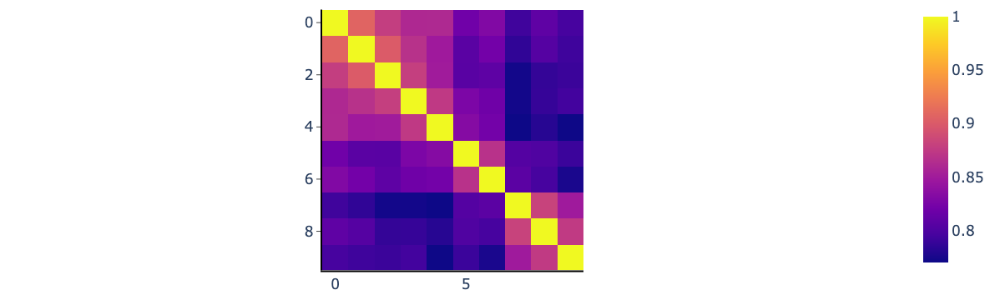

In [154]:
## Positional invarariance: Test if with a given fixed set, and same indice/sample in different location, the cosine similarity is high

model = models[0]
nsets = 10
samp_ind = 42
embed_size = 200 # ?

c_embs = []
sample_embeds = np.zeros((nsets, embed_size))
input_sets = gen_fixed_sets_for_sample(samp_ind, nsets, label_superpops)

for i, s in enumerate(input_sets):
    out = make_output(model, s)
    c_emb = activation["encoder"].cpu().detach().numpy().squeeze()
    c_embs.append(c_emb)
    sample_embeds[i, :] = c_emb[np.where(s == samp_ind)[0][0], :]

    # print(np.where(s == samp_ind)[0][0], s[np.where(s == samp_ind)[0][0]])

    # labs = [f"{label_superpops[i]} ({i})" for i in s]
    # px.imshow(cosine_similarity(c_emb), x=labs, y=labs).show()

print(cosine_similarity(sample_embeds))
fig = px.imshow(cosine_similarity(sample_embeds))
# fig.update_layout(xaxis_title="Index of individual in input (contextual embeddings)", yaxis_title="Index of individual in input (contextual embeddings)")
fig.write_image("images/csm_cemb_posinv.pdf")
fig.show()

(10, 200)


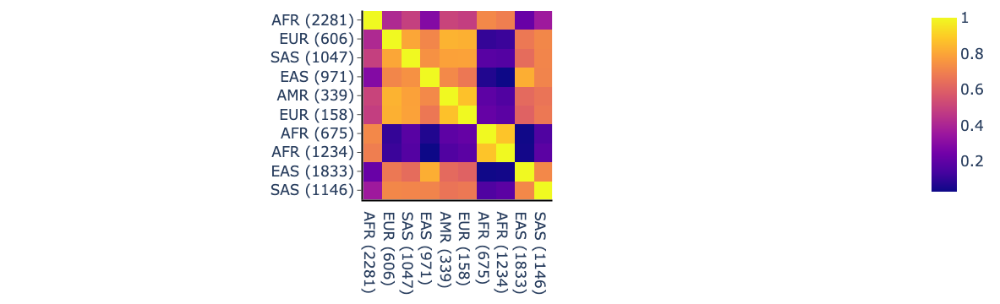

(20, 200)


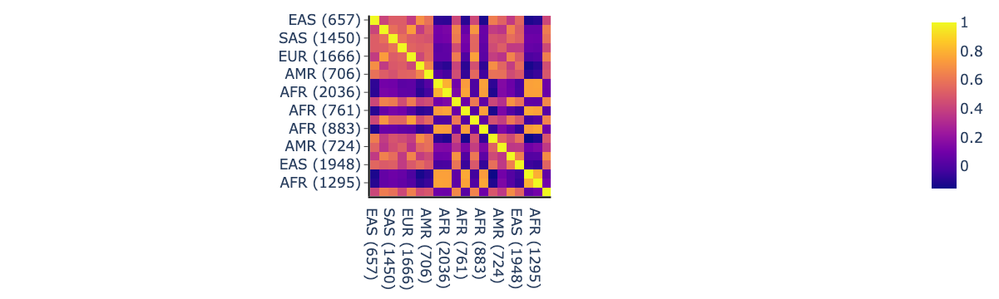

(30, 200)


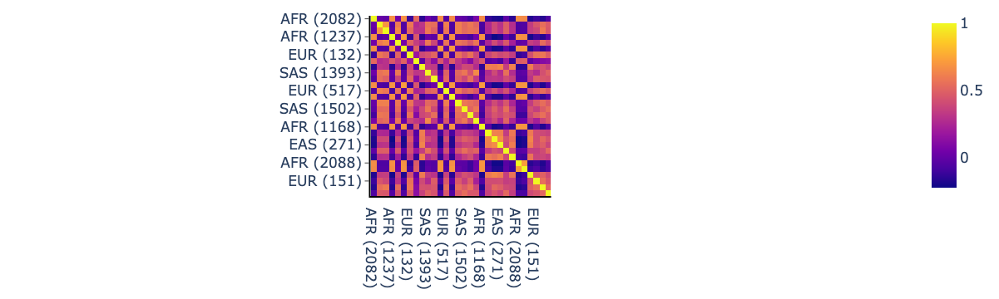

(40, 200)


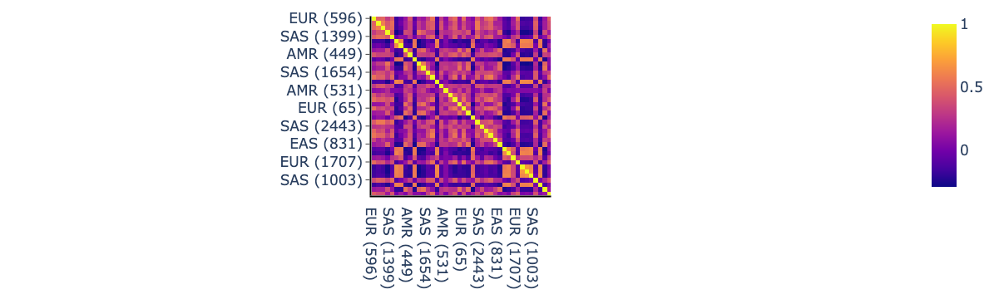

(50, 200)


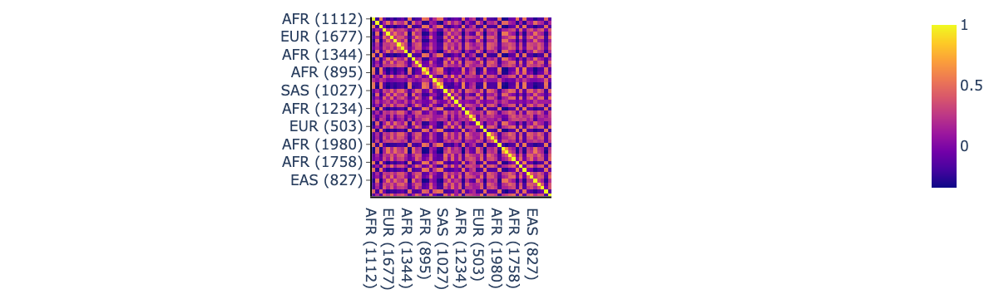

(60, 200)


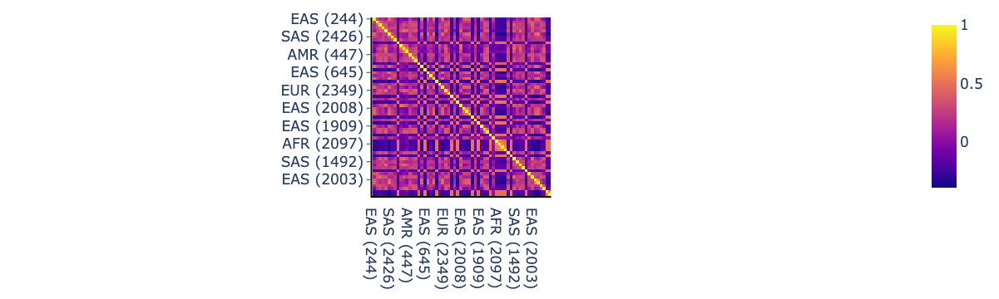

(70, 200)


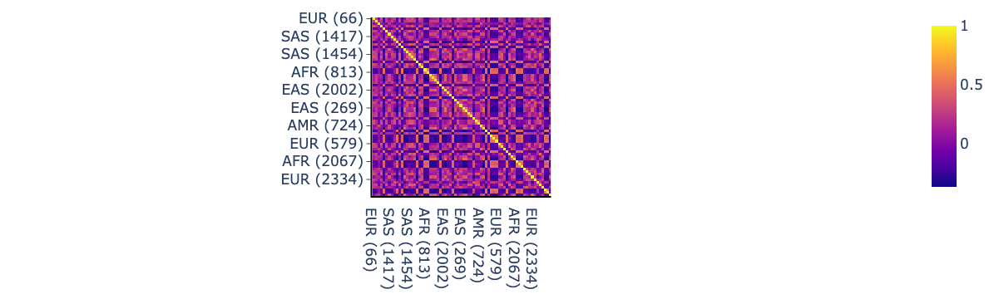

(80, 200)


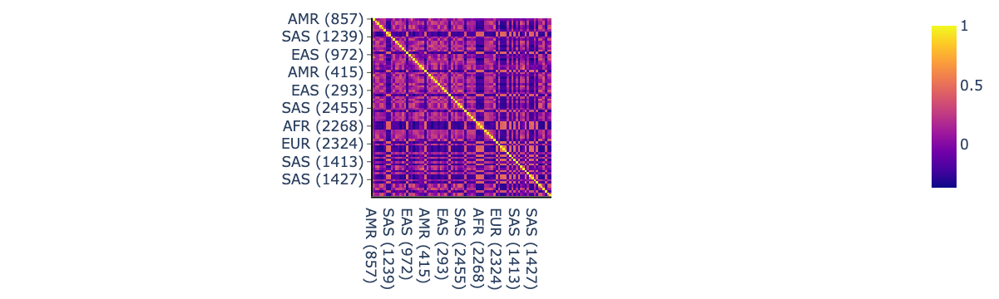

(90, 200)


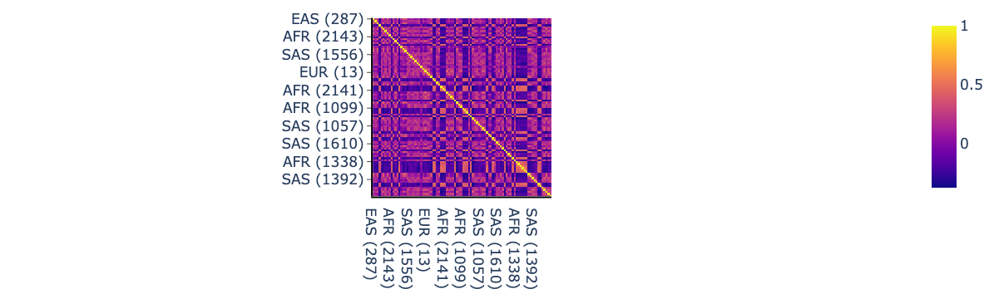

(100, 200)


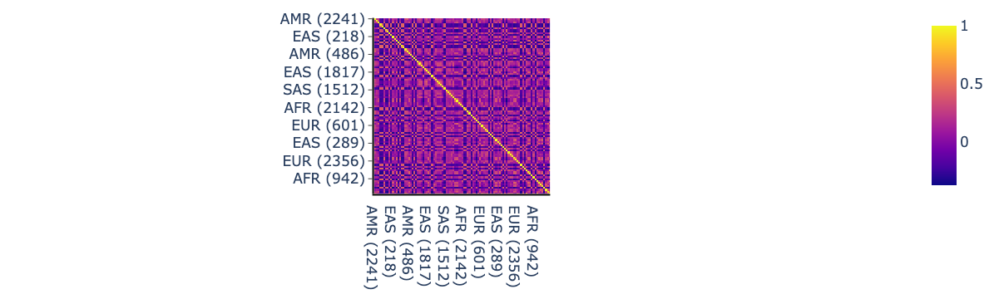

[[1.         0.74987186 0.69272137 0.6680888  0.5925731  0.53466714
  0.49075484 0.50684255 0.47344545 0.45114629]
 [0.74987186 1.         0.67753578 0.61521829 0.59174903 0.57868999
  0.53683042 0.52916933 0.4821701  0.47661824]
 [0.69272137 0.67753578 1.         0.65222451 0.59107102 0.53618025
  0.52648604 0.51602089 0.49555714 0.50043769]
 [0.6680888  0.61521829 0.65222451 1.         0.56159601 0.51721479
  0.51685833 0.53098511 0.47974123 0.57481368]
 [0.5925731  0.59174903 0.59107102 0.56159601 1.         0.51586658
  0.52452632 0.49971198 0.49537369 0.47099112]
 [0.53466714 0.57868999 0.53618025 0.51721479 0.51586658 1.
  0.51000268 0.49322896 0.46967875 0.45079198]
 [0.49075484 0.53683042 0.52648604 0.51685833 0.52452632 0.51000268
  1.         0.50322277 0.46024404 0.45929267]
 [0.50684255 0.52916933 0.51602089 0.53098511 0.49971198 0.49322896
  0.50322277 1.         0.49868863 0.48210869]
 [0.47344545 0.4821701  0.49555714 0.47974123 0.49537369 0.46967875
  0.46024404 0.49868

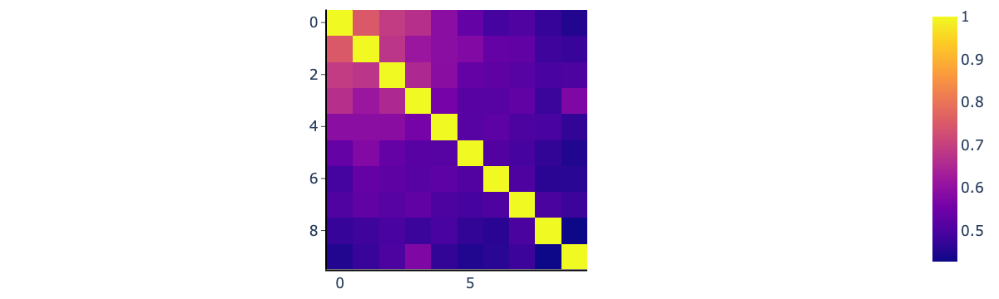

In [118]:
## Test if cosine similarity between same sample (and all samples in a inds set) is high
## Answer: it is not.

model = models[0]
nsets = 10
samp_ind = 1234
embed_size = 200 # ?

c_embs = []
sample_embeds = np.zeros((nsets, embed_size))
input_sets = gen_rand_sets_for_sample(samp_ind, range(10, 101, nsets), label_superpops)

for i, s in enumerate(input_sets):
    out = make_output(model, s)
    c_emb = activation["encoder"].cpu().detach().numpy().squeeze()
    c_embs.append(c_emb)
    print(c_emb.shape)
    sample_embeds[i, :] = c_emb[np.where(s == samp_ind)[0][0], :]

    labs = [f"{label_superpops[i]} ({i})" for i in s]
    px.imshow(cosine_similarity(c_emb), x=labs, y=labs).show()

print(cosine_similarity(sample_embeds))
px.imshow(cosine_similarity(sample_embeds)).show()

(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
(6, 200) 1168
[[1.         0.85835685 0.88859141 0.8675711  0.91187964 0.9064975
  0.96333325 0.87424246 0.87261413 0.88093538 0.96227735 0.97865977
  0.88583526 0.88587746 0.86550296 0.8703771  0.87579526 0.86224047
  0.97725651 0.88053146 0.89110576 0.88634453 0.88950954 0.87720135
  0.86863994 0.87287688 0.88962122 0.88562063 0.88149837 0.87990486]
 [0.85835685 1.         0.88387108 0.98565834 0.87727958 0.87507378
  0.88022247 0.86425729 0.90365475 0.86039451 0.85369791 0.85944508
  0.87789276 0.97457055 0.97196423 0.84786389 0.9883175  0.89932136
  0.86969455 0.87071242 0.87901139 0

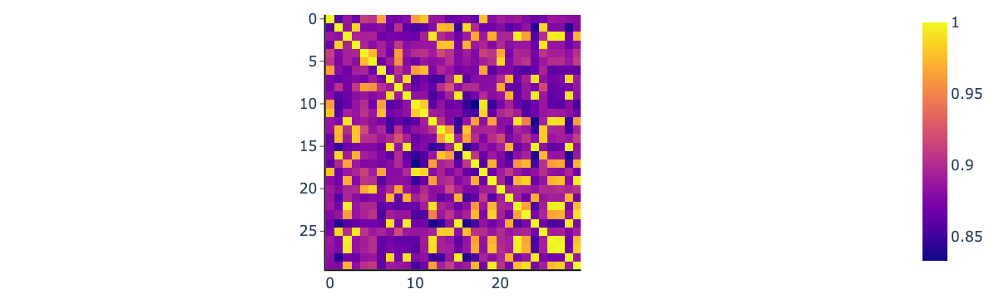

In [117]:
## Same test but with sets only of length 6, to try and increase cosine similarity

model = models[0]
nsets = 30
samp_ind = 1168
embed_size = 200 # ?

c_embs = []
sample_embeds = np.zeros((nsets, embed_size))
input_sets = gen_rand_sets_for_sample(samp_ind, [6] * nsets, label_superpops)

for i, s in enumerate(input_sets):
    out = make_output(model, s)
    c_emb = activation["encoder"].cpu().detach().numpy().squeeze()
    c_embs.append(c_emb)
    
    print(c_emb.shape, s[np.where(s == samp_ind)[0][0]])
    
    sample_embeds[i, :] = c_emb[np.where(s == samp_ind)[0][0], :]

    # labs = [f"{label_superpops[i]} ({i})" for i in s]
    # px.imshow(cosine_similarity(c_emb), x=labs, y=labs).show()

print(cosine_similarity(sample_embeds))
px.imshow(cosine_similarity(sample_embeds)).show()

In [113]:
# Random sample of maxseqlen length that gets approx all pops equally represented
inds, _ = train_test_split(list(range(2503)), train_size=100, shuffle=True, stratify=label_codes)
print(len(inds))
print(label_codes[inds].value_counts())

100
0
GWD    5
KHV    4
YRI    4
GBR    4
LWK    4
ACB    4
JPT    4
ITU    4
CDX    4
CHB    4
TSI    4
IBS    4
PJL    4
ESN    4
STU    4
CHS    4
FIN    4
PUR    4
GIH    4
CEU    4
CLM    4
BEB    3
ASW    3
PEL    3
MXL    3
MSL    3
Name: count, dtype: int64


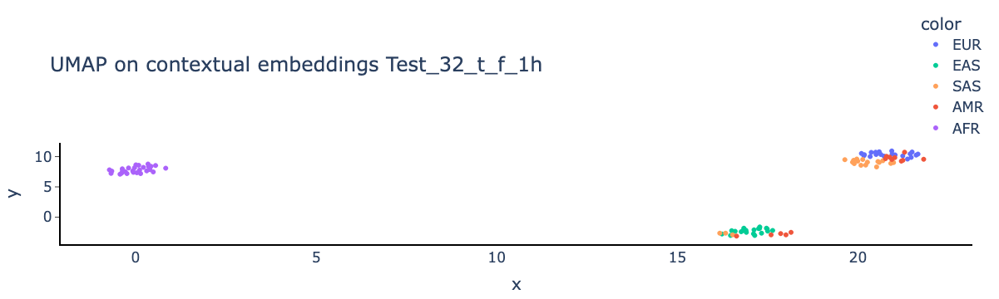

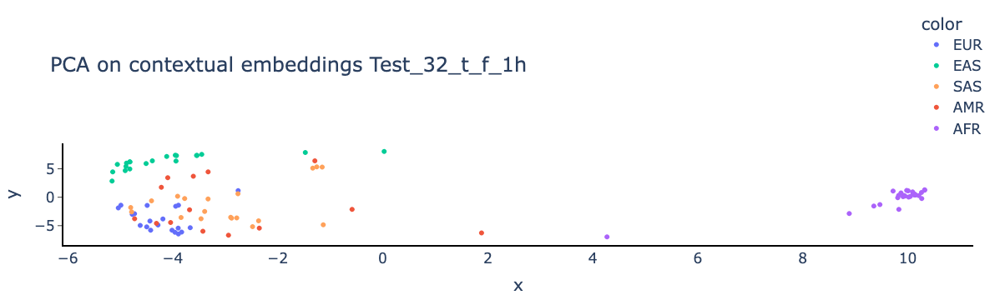

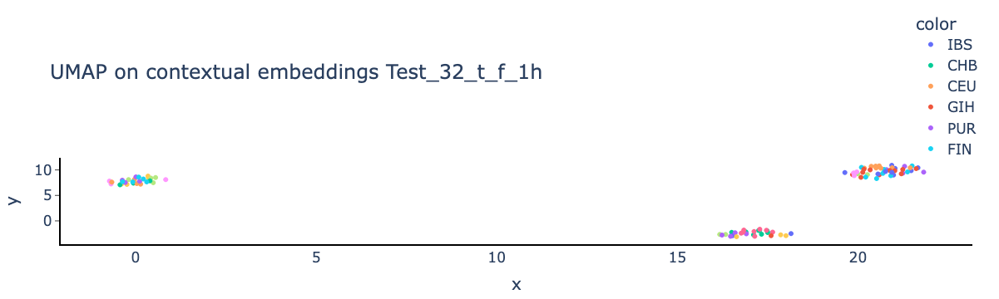

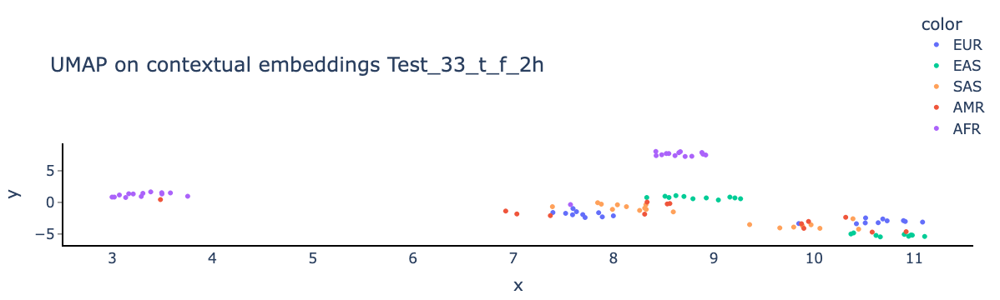

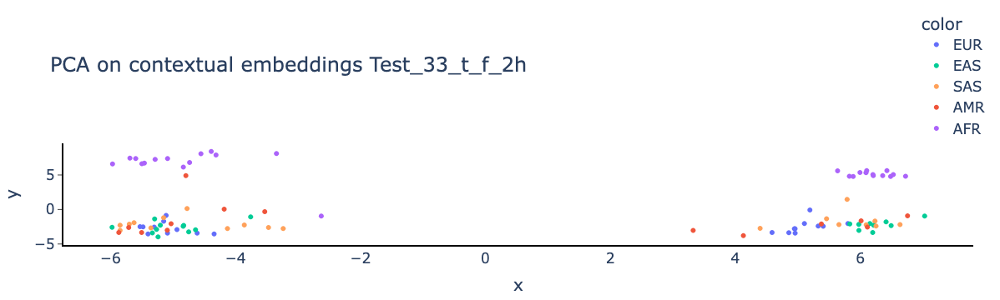

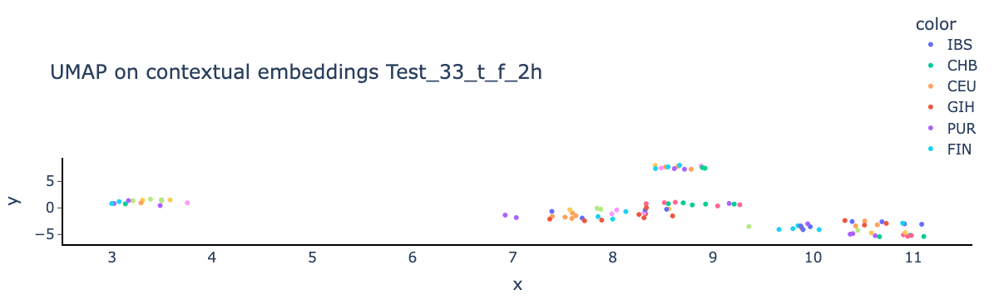

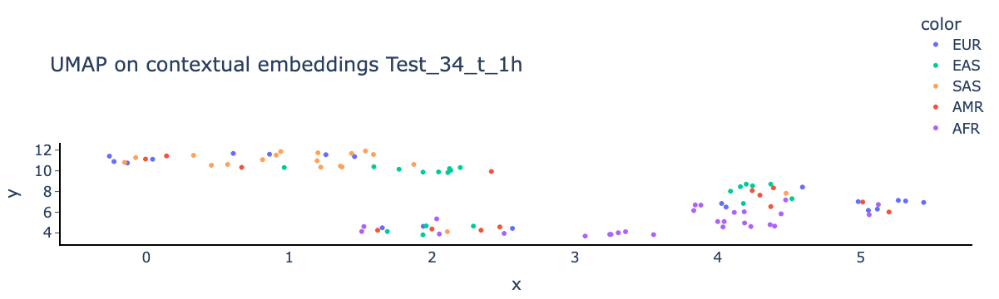

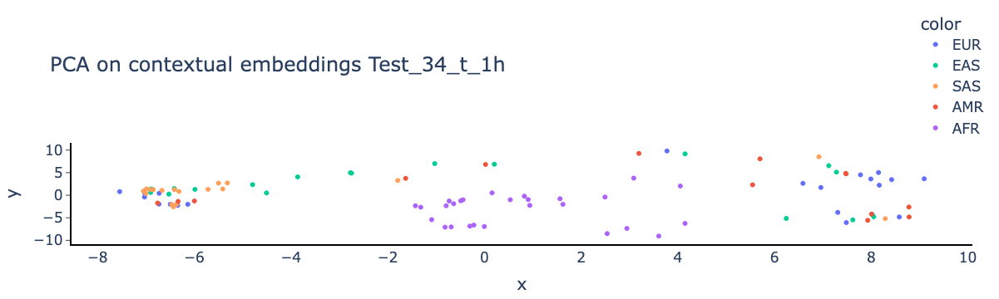

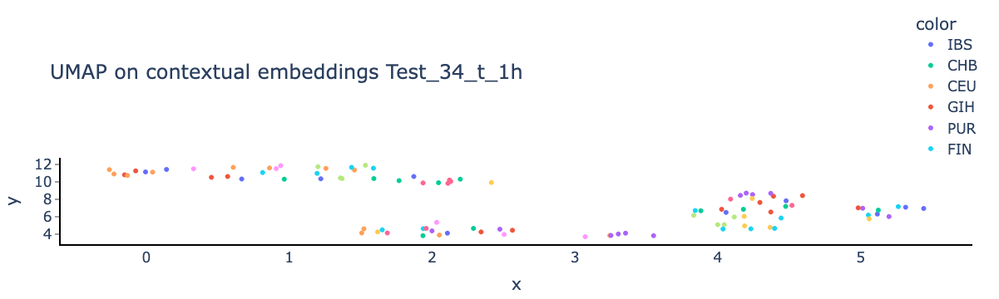

In [114]:
labs_pop = label_codes[inds].tolist()
labs_superpop = label_superpops[inds].tolist()

for model in models:

    out = make_output(model, inds)
    
    c_emb = activation["encoder"].cpu().detach().numpy().squeeze()
    
    umap_c_emb = UMAP(n_components=2).fit_transform(c_emb)
    pca_c_emb = PCA(n_components=2).fit_transform(c_emb)
    
    fig = px.scatter(x=umap_c_emb[:, 0], y=umap_c_emb[:, 1], 
                     color=labs_superpop, 
                     hover_name=inds,
                     title=f"UMAP on contextual embeddings {model.get_name()}")
    fig.show()
    
    fig = px.scatter(x=pca_c_emb[:, 0], y=pca_c_emb[:, 1], 
                     color=labs_superpop, 
                     hover_name=inds,
                     title=f"PCA on contextual embeddings {model.get_name()}")
    fig.show()
    
    fig = px.scatter(x=umap_c_emb[:, 0], y=umap_c_emb[:, 1], 
                     color=labs_pop, 
                     hover_name=inds,
                     title=f"UMAP on contextual embeddings {model.get_name()}")
    fig.show()